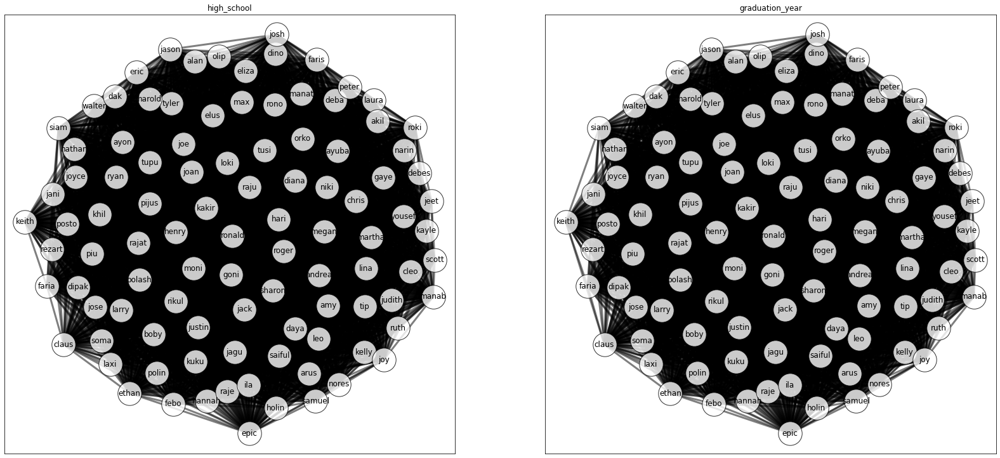

In [19]:
import numpy as np
from scipy.optimize import minimize

import matplotlib.colors as mcolors
import matplotlib._color_data as mcd

import networkx as nx
import matplotlib.pyplot as plt
%matplotlib inline

import networkx.algorithms.clique as clq
from termcolor import colored
from itertools import combinations
from collections import Counter

import math
import ctypes 

#colorlist = {}

#colorlist.update(mcolors.CSS4_COLORS)

#colornames = []
#colorcodes = []
#for name, color in colorlist.items():
#    if name.find('white') ==-1:
#        if name.find('black') ==-1:
#            colornames.append(name)
#            colorcodes.append(color)
            
#colornames = ['aqua', 'blanchedalmond', 'blue', 
              #'blueviolet', 'brown', 'burlywood', 'cadetblue', 'chartreuse', 'chocolate', 'coral', 
              #'cornflowerblue', 'cornsilk', 'crimson', 'cyan', 'darkblue', 'darkcyan', 'darkgoldenrod', 
              #'darkgray', 'darkgreen', 'darkgrey', 'darkkhaki', 'darkmagenta', 'darkolivegreen', 'darkorange', 
              #'darkorchid', 'darkred', 'darksalmon', 'darkseagreen', 'darkslateblue', 'darkslategray', 'darkslategrey', 
              #'darkturquoise', 'darkviolet', 'deeppink', 'deepskyblue', 'dimgray', 'dimgrey', 'dodgerblue', 'firebrick', 
              #'forestgreen', 'fuchsia', 'gainsboro', 'gold', 'goldenrod', 'gray', 'green', 'greenyellow', 'grey', 'honeydew', 
              #'hotpink', 'indianred', 'indigo', 'ivory', 'khaki', 'lavender', 'lavenderblush', 'lawngreen', 'lemonchiffon', 
              #'lightblue', 'lightcoral', 'lightcyan', 'lightgoldenrodyellow', 'lightgray', 'lightgreen', 'lightgrey', 'lightpink', 
              #'lightsalmon', 'lightseagreen', 'lightskyblue', 'lightslategray', 'lightslategrey', 'lightsteelblue', 'lightyellow', 
              #'lime', 'limegreen', 'linen', 'magenta', 'maroon', 'mediumaquamarine', 'mediumblue', 'mediumorchid', 'mediumpurple', 
              #'mediumseagreen', 'mediumslateblue', 'mediumspringgreen', 'mediumturquoise', 'mediumvioletred', 'midnightblue', 
              #'mintcream', 'mistyrose', 'moccasin', 'navy', 'oldlace', 'olive', 'olivedrab', 'orange', 'orangered', 'orchid', 
              #'palegoldenrod', 'palegreen', 'paleturquoise', 'palevioletred', 'papayawhip', 'peachpuff', 'peru', 'pink', 'plum', 
              #'powderblue', 'purple', 'rebeccapurple', 'red', 'rosybrown', 'royalblue', 'saddlebrown', 'salmon', 'sandybrown', 
              #'seagreen', 'seashell', 'sienna', 'silver', 'skyblue', 'slateblue', 'slategray', 'slategrey', 'snow', 'springgreen', 
              #'steelblue', 'tan', 'teal', 'thistle', 'tomato', 'turquoise', 'violet', 'wheat', 'yellow', 'yellowgreen']

mcolor = {"red":'\033[31m', "green":'\033[32m', "yellow":'\033[33m', 
          "blue":'\033[34m', "purple":'\033[35m', "cyan":'\033[36m', 
          "lightgrey":'\033[37m', "lightred":'\033[91m', "lightgreen":'\033[92m', 
          "lightblue":'\033[94m'}

dim = 100

thr1 = 0.5
thr2 = 0.5

thrf = 0.5

c = np.empty((dim, dim), dtype=float)
d = np.empty((dim, dim), dtype=float)
e = np.empty((dim, dim), dtype=float)
u = np.empty((dim, dim), dtype=float)

ax = np.random.rand(dim,dim)

bx = np.random.rand(dim,dim)

i = 0
j = 0

for i in range(0,dim):
    for j in range(i,dim):
        ax[i,j] = "{:.2f}".format(ax[i,j])
        ax[j,i] = ax[i,j]
        
        if i==j: 
            ax[i,i] = 1 
    
for i in range(0,dim):
    for j in range(i,dim): 
        bx[i,j] = "{:.2f}".format(bx[i,j])
        bx[j,i] = bx[i,j] 
        
        if i==j: 
            bx[i,i] = 1

Smaj = ax

Syear = bx

Smaj = np.array([[1.  , 0.66, 0.6 , 0.69, 0.86, 0.92, 0.68, 0.78, 0.77, 0.92, 0.66,
       0.83, 0.7 , 0.97, 0.75, 0.  , 0.83, 0.75, 0.63, 0.89, 0.95, 0.86,
       0.98, 0.92, 0.97, 0.66, 0.98, 0.75, 0.6 , 0.68, 0.  , 0.69, 0.55,
       0.58, 0.8 , 0.84, 0.82, 0.71, 0.67, 0.76, 0.77, 0.69, 0.87, 0.66,
       0.75, 0.  , 0.59, 0.64, 0.87, 0.92, 0.82, 0.8 , 0.8 , 0.85, 0.56,
       0.67, 1.  , 0.72, 0.74, 0.91, 0.  , 0.78, 0.71, 0.72, 0.7 , 0.92,
       0.98, 0.59, 0.92, 0.85, 0.56, 0.68, 0.99, 0.64, 0.94, 0.  , 0.6 ,
       0.56, 0.79, 0.65, 1.  , 0.94, 0.87, 0.74, 0.87, 0.64, 0.69, 0.63,
       0.8 , 0.95, 0.  , 0.9 , 0.76, 0.62, 0.84, 0.78, 0.57, 0.62, 0.68,
       0.87], [0.66, 1.  , 0.84, 0.59, 0.75, 0.64, 0.67, 0.61, 0.66, 0.96, 0.58,
       0.82, 0.88, 0.81, 0.61, 0.56, 0.58, 0.81, 0.96, 0.82, 0.96, 0.97,
       0.93, 1.  , 0.65, 1.  , 0.7 , 0.95, 0.68, 0.89, 0.77, 0.89, 0.69,
       0.97, 0.78, 0.65, 0.9 , 0.56, 0.97, 0.86, 0.81, 0.72, 0.92, 0.92,
       0.56, 0.92, 0.94, 0.79, 0.95, 0.99, 0.8 , 0.76, 0.83, 0.73, 0.65,
       0.67, 0.96, 0.96, 0.92, 0.84, 0.69, 0.82, 0.66, 0.6 , 0.86, 0.59,
       0.88, 0.71, 0.59, 0.68, 0.75, 0.66, 0.59, 0.78, 0.7 , 0.88, 0.67,
       1.  , 0.86, 0.82, 0.84, 0.89, 0.87, 0.92, 0.75, 0.66, 0.85, 0.74,
       0.87, 1.  , 0.59, 0.96, 0.95, 0.73, 0.8 , 0.77, 0.94, 0.72, 0.76,
       0.77],[0.6 , 0.84, 1.  , 0.89, 0.74, 0.65, 0.79, 0.55, 0.81, 0.56, 0.55,
       0.77, 0.85, 0.7 , 0.82, 0.63, 0.95, 0.77, 0.87, 0.82, 0.9 , 0.95,
       0.77, 0.86, 0.81, 0.78, 0.75, 0.77, 0.68, 0.9 , 0.95, 0.81, 0.64,
       0.64, 0.92, 0.56, 0.94, 0.6 , 0.75, 0.97, 0.95, 0.61, 0.7 , 0.78,
       0.97, 0.92, 0.6 , 0.78, 0.66, 0.88, 0.74, 0.94, 0.87, 0.76, 0.57,
       0.6 , 0.62, 0.67, 0.79, 0.62, 0.65, 0.81, 0.93, 0.63, 0.78, 0.74,
       0.95, 0.71, 0.76, 0.77, 0.88, 0.61, 0.6 , 0.77, 0.63, 0.97, 0.56,
       0.61, 0.95, 0.87, 0.75, 0.78, 0.77, 0.96, 0.81, 0.89, 0.58, 0.98,
       0.92, 0.92, 0.93, 0.85, 0.85, 0.69, 0.73, 0.57, 0.76, 0.94, 0.99,
       0.73], [0.69, 0.59, 0.89, 1.  , 0.96, 0.95, 0.58, 0.61, 0.8 , 0.79, 0.97,
       0.81, 0.56, 0.86, 0.93, 0.61, 0.79, 0.8 , 0.82, 0.94, 0.94, 0.9 ,
       0.92, 0.56, 0.78, 0.62, 0.92, 0.82, 0.74, 0.98, 0.61, 0.72, 0.92,
       0.75, 0.58, 0.7 , 0.91, 0.57, 0.8 , 0.96, 0.69, 0.88, 0.84, 0.83,
       0.9 , 0.89, 0.99, 0.79, 0.95, 0.84, 0.83, 0.98, 0.73, 0.58, 0.93,
       0.61, 0.59, 0.69, 0.94, 0.7 , 0.99, 0.93, 0.86, 0.58, 0.78, 0.82,
       0.68, 0.79, 0.83, 0.94, 1.  , 0.85, 0.97, 0.7 , 0.6 , 0.87, 0.76,
       0.73, 0.63, 0.8 , 0.96, 0.85, 0.59, 0.98, 0.76, 0.79, 0.69, 0.76,
       0.85, 0.59, 0.69, 0.96, 0.64, 0.9 , 0.65, 0.91, 0.94, 0.7 , 0.97,
       0.97], [0.86, 0.75, 0.74, 0.96, 1.  , 0.64, 0.71, 0.84, 0.78, 0.59, 0.93,
       0.87, 0.6 , 0.63, 0.76, 0.81, 0.85, 0.61, 0.95, 0.97, 0.83, 0.68,
       0.75, 0.55, 0.57, 0.87, 0.64, 0.56, 0.6 , 0.67, 0.96, 0.9 , 0.64,
       0.62, 0.61, 0.59, 0.96, 0.66, 0.87, 0.79, 0.6 , 0.61, 0.67, 0.73,
       0.99, 0.89, 0.71, 0.92, 0.6 , 0.62, 0.73, 0.59, 0.78, 0.85, 0.92,
       0.93, 0.85, 0.56, 0.62, 0.97, 0.57, 0.62, 0.73, 0.66, 0.62, 0.75,
       0.71, 0.68, 0.94, 0.92, 0.69, 0.59, 0.92, 0.68, 0.7 , 0.99, 0.57,
       0.64, 0.76, 0.83, 0.98, 0.94, 0.74, 0.95, 0.93, 0.81, 0.84, 0.74,
       0.6 , 0.57, 0.94, 0.62, 0.56, 0.96, 0.67, 0.58, 0.65, 0.71, 0.97,
       0.65], [0.92, 0.64, 0.65, 0.95, 0.64, 1.  , 0.79, 0.89, 0.62, 0.62, 0.59,
       0.89, 0.74, 0.9 , 0.84, 0.88, 0.78, 0.77, 0.69, 0.64, 0.72, 0.99,
       0.83, 0.7 , 0.77, 0.66, 0.94, 0.63, 0.97, 0.68, 0.81, 0.71, 0.62,
       0.86, 0.66, 0.61, 0.84, 0.68, 0.6 , 0.95, 0.68, 0.63, 0.93, 0.74,
       0.68, 0.83, 0.85, 0.94, 0.86, 0.87, 0.77, 0.98, 0.96, 0.73, 0.95,
       0.77, 0.84, 0.88, 0.75, 0.99, 0.9 , 0.68, 0.64, 0.88, 0.77, 0.59,
       0.98, 0.77, 0.82, 0.69, 0.59, 0.85, 0.74, 0.82, 0.65, 0.58, 0.89,
       0.62, 0.61, 0.96, 0.8 , 0.94, 0.69, 0.56, 0.56, 0.66, 0.98, 0.65,
       0.87, 0.79, 0.72, 0.76, 0.85, 0.95, 0.6 , 0.78, 0.75, 0.92, 0.59,
       0.65], [0.68, 0.67, 0.79, 0.58, 0.71, 0.79, 1.  , 0.61, 0.92, 0.98, 0.59,
       0.63, 0.84, 0.77, 0.83, 1.  , 0.55, 0.86, 0.77, 0.79, 0.78, 0.59,
       0.84, 0.98, 0.76, 0.84, 0.87, 0.95, 0.8 , 0.94, 0.97, 0.56, 1.  ,
       0.61, 0.68, 0.87, 0.72, 0.97, 0.59, 0.7 , 0.84, 0.78, 0.85, 0.8 ,
       0.65, 0.57, 0.61, 0.69, 0.85, 0.73, 0.8 , 0.56, 0.97, 0.83, 0.65,
       0.84, 0.79, 0.98, 0.55, 0.89, 0.6 , 0.99, 0.63, 0.87, 0.56, 0.8 ,
       0.95, 0.95, 0.8 , 0.69, 0.7 , 0.99, 0.58, 0.91, 0.7 , 0.95, 0.8 ,
       0.98, 0.76, 0.7 , 0.74, 0.6 , 1.  , 0.77, 0.88, 0.61, 0.78, 0.88,
       0.94, 0.9 , 0.59, 0.62, 0.56, 0.99, 0.6 , 0.82, 0.74, 0.73, 0.98,
       0.89], [0.78, 0.61, 0.55, 0.61, 0.84, 0.89, 0.61, 1.  , 0.78, 0.77, 0.99,
       0.89, 0.62, 0.62, 0.87, 0.77, 0.93, 0.89, 0.98, 0.65, 0.66, 0.97,
       0.65, 0.96, 0.7 , 0.95, 0.78, 0.69, 0.83, 0.55, 0.64, 0.79, 0.85,
       0.71, 0.78, 0.96, 0.81, 0.75, 0.72, 0.82, 0.99, 0.89, 0.91, 0.84,
       0.65, 0.68, 0.69, 0.89, 0.76, 0.96, 0.9 , 0.9 , 0.84, 0.74, 0.59,
       0.99, 0.78, 0.97, 0.8 , 0.83, 0.88, 0.93, 0.83, 0.58, 0.67, 0.9 ,
       0.76, 0.81, 0.6 , 0.97, 0.72, 0.98, 0.94, 0.7 , 0.77, 0.91, 0.77,
       0.76, 1.  , 0.95, 0.87, 0.92, 0.82, 0.91, 0.97, 0.98, 0.93, 0.7 ,
       0.67, 0.75, 0.64, 0.56, 0.89, 0.91, 0.73, 0.88, 0.93, 0.71, 0.95,
       0.8 ], [0.77, 0.66, 0.81, 0.8 , 0.78, 0.62, 0.92, 0.78, 1.  , 0.92, 0.93,
       0.76, 0.79, 0.56, 0.75, 0.57, 0.63, 0.81, 0.56, 0.77, 0.89, 0.72,
       0.7 , 0.98, 0.63, 0.9 , 0.81, 0.92, 0.85, 0.69, 0.85, 0.6 , 0.68,
       0.95, 0.6 , 0.62, 0.86, 0.97, 0.86, 0.67, 0.99, 0.75, 0.93, 0.93,
       0.91, 0.6 , 1.  , 0.75, 0.9 , 0.88, 0.85, 0.71, 0.89, 0.83, 0.81,
       0.66, 0.74, 0.62, 0.69, 0.97, 0.86, 0.99, 1.  , 0.75, 0.97, 0.87,
       0.75, 0.86, 0.69, 0.7 , 0.88, 0.99, 0.7 , 0.89, 0.86, 0.72, 0.9 ,
       0.59, 0.66, 0.57, 0.76, 0.73, 0.9 , 0.58, 0.75, 0.72, 0.58, 0.84,
       0.8 , 0.81, 0.88, 0.59, 0.76, 0.87, 0.79, 0.73, 0.87, 0.93, 0.55,
       0.76], [0.92, 0.96, 0.56, 0.79, 0.59, 0.62, 0.98, 0.77, 0.92, 1.  , 0.93,
       0.86, 0.57, 0.86, 0.68, 0.61, 0.96, 0.56, 0.98, 0.92, 0.63, 0.66,
       0.7 , 0.73, 0.79, 0.93, 0.65, 0.8 , 0.97, 0.72, 0.94, 1.  , 0.66,
       0.93, 0.7 , 0.66, 0.96, 0.67, 0.99, 0.73, 0.91, 0.78, 0.64, 0.89,
       0.8 , 0.96, 0.88, 0.66, 0.98, 0.59, 0.92, 0.99, 0.86, 0.95, 0.82,
       0.96, 0.9 , 0.69, 0.6 , 0.8 , 0.85, 0.65, 0.88, 0.87, 0.74, 0.74,
       1.  , 0.75, 0.65, 0.59, 0.97, 0.55, 0.62, 0.55, 0.95, 0.76, 0.75,
       0.95, 0.9 , 0.62, 0.56, 0.82, 0.61, 0.89, 0.95, 0.83, 0.84, 0.68,
       0.98, 0.94, 0.87, 0.92, 0.78, 0.83, 0.85, 0.78, 0.83, 0.9 , 0.7 ,
       0.61], [0.66, 0.58, 0.55, 0.97, 0.93, 0.59, 0.59, 0.99, 0.93, 0.93, 1.  ,
       0.97, 0.83, 0.81, 0.95, 0.56, 0.78, 0.85, 0.95, 0.58, 0.8 , 0.8 ,
       0.82, 0.83, 0.57, 0.7 , 0.75, 0.74, 0.98, 0.91, 0.57, 0.82, 0.97,
       0.7 , 0.64, 0.84, 0.94, 0.76, 0.85, 0.76, 0.94, 0.9 , 0.86, 0.8 ,
       0.82, 0.94, 0.93, 0.65, 0.98, 0.96, 0.84, 0.59, 0.96, 0.87, 0.89,
       0.83, 0.62, 0.96, 0.65, 0.8 , 0.97, 0.89, 0.63, 0.94, 0.69, 0.79,
       0.88, 0.56, 0.87, 0.76, 0.93, 0.81, 0.65, 0.63, 0.76, 0.92, 0.75,
       0.9 , 0.95, 0.71, 0.63, 0.92, 0.58, 0.8 , 0.85, 0.9 , 0.72, 0.61,
       0.56, 0.76, 0.87, 0.76, 0.83, 0.92, 0.69, 0.57, 0.93, 0.83, 0.94,
       0.99], [0.83, 0.82, 0.77, 0.81, 0.87, 0.89, 0.63, 0.89, 0.76, 0.86, 0.97,
       1.  , 0.6 , 0.89, 0.98, 0.82, 0.66, 0.6 , 0.65, 0.95, 0.84, 0.96,
       0.86, 0.61, 0.94, 0.71, 0.88, 0.57, 0.83, 0.58, 0.68, 0.61, 0.7 ,
       0.94, 0.56, 0.8 , 0.89, 0.86, 0.56, 0.64, 0.84, 0.58, 0.84, 0.64,
       0.56, 0.9 , 0.97, 0.9 , 0.97, 0.91, 0.98, 0.56, 0.97, 0.79, 0.96,
       0.68, 0.9 , 0.99, 0.87, 0.8 , 0.8 , 0.58, 0.64, 0.71, 0.6 , 0.77,
       0.65, 0.88, 0.86, 0.87, 0.58, 0.66, 0.8 , 0.7 , 0.98, 0.65, 0.92,
       0.57, 0.64, 0.7 , 0.62, 0.76, 0.94, 0.79, 0.95, 0.63, 0.92, 0.77,
       0.71, 0.63, 0.97, 0.78, 0.74, 0.61, 0.97, 0.56, 0.74, 0.91, 0.81,
       0.65], [0.7 , 0.88, 0.85, 0.56, 0.6 , 0.74, 0.84, 0.62, 0.79, 0.57, 0.83,
       0.6 , 1.  , 0.97, 0.71, 0.72, 0.6 , 0.69, 0.86, 0.98, 0.71, 0.58,
       0.61, 0.94, 0.6 , 0.93, 0.58, 0.78, 0.58, 0.66, 0.94, 0.87, 0.92,
       0.65, 0.94, 0.73, 0.6 , 0.73, 0.79, 0.89, 0.7 , 0.9 , 0.66, 0.62,
       0.87, 0.7 , 0.94, 0.97, 0.99, 0.85, 0.92, 0.64, 0.9 , 0.85, 0.95,
       0.58, 0.85, 0.57, 0.87, 0.99, 1.  , 0.88, 0.73, 0.89, 0.91, 0.56,
       0.65, 0.84, 0.85, 0.57, 0.94, 0.56, 0.66, 0.68, 0.56, 0.83, 0.67,
       0.87, 0.84, 0.56, 0.78, 0.6 , 0.57, 0.55, 0.99, 0.96, 0.6 , 0.9 ,
       0.86, 0.97, 0.71, 0.93, 0.78, 0.91, 0.98, 0.61, 0.92, 0.61, 0.83,
       0.93], [0.97, 0.81, 0.7 , 0.86, 0.63, 0.9 , 0.77, 0.62, 0.56, 0.86, 0.81,
       0.89, 0.97, 1.  , 0.76, 0.68, 0.61, 0.7 , 0.84, 0.55, 0.99, 0.67,
       0.85, 0.78, 0.87, 0.95, 0.81, 0.79, 0.71, 0.97, 0.88, 0.98, 0.83,
       0.84, 0.87, 0.63, 0.6 , 0.84, 0.68, 0.71, 0.89, 0.94, 0.94, 0.83,
       0.91, 0.91, 0.61, 0.82, 0.71, 0.82, 0.99, 0.82, 0.78, 0.68, 0.76,
       0.82, 0.83, 0.69, 0.56, 0.68, 0.56, 0.57, 0.59, 0.63, 0.7 , 0.77,
       0.95, 0.86, 0.83, 0.64, 0.78, 0.69, 0.72, 0.7 , 0.67, 0.98, 0.93,
       0.81, 0.89, 0.93, 0.93, 0.57, 0.76, 0.78, 0.97, 0.83, 0.62, 0.95,
       0.99, 0.94, 0.56, 0.77, 0.66, 0.8 , 0.58, 0.97, 0.88, 0.95, 0.64,
       0.58], [0.75, 0.61, 0.82, 0.93, 0.76, 0.84, 0.83, 0.87, 0.75, 0.68, 0.95,
       0.98, 0.71, 0.76, 1.  , 0.56, 0.64, 0.81, 0.66, 0.97, 0.95, 0.74,
       0.68, 0.6 , 0.99, 0.64, 0.72, 0.85, 0.82, 0.81, 0.85, 0.92, 0.99,
       0.67, 0.61, 0.91, 0.57, 0.6 , 0.95, 0.83, 0.89, 0.71, 0.81, 0.93,
       0.93, 0.8 , 0.95, 0.55, 0.65, 0.91, 0.96, 0.69, 0.78, 0.59, 0.81,
       0.59, 0.83, 0.67, 0.85, 0.62, 0.94, 0.71, 0.58, 0.93, 0.56, 0.89,
       0.64, 0.75, 0.67, 0.85, 0.84, 0.75, 0.82, 0.66, 0.99, 1.  , 0.75,
       0.74, 0.57, 0.75, 0.94, 0.9 , 0.98, 0.65, 0.78, 0.55, 0.88, 0.72,
       0.7 , 0.92, 0.75, 0.6 , 0.86, 0.86, 0.6 , 0.78, 0.64, 0.9 , 0.9 ,
       0.56], [0.  , 0.56, 0.63, 0.61, 0.81, 0.88, 1.  , 0.77, 0.57, 0.61, 0.56,
       0.82, 0.72, 0.68, 0.56, 1.  , 0.98, 0.87, 0.8 , 0.78, 0.81, 0.99,
       0.96, 0.83, 0.59, 0.71, 0.92, 0.73, 0.79, 0.58, 0.  , 0.71, 0.83,
       0.8 , 0.83, 0.76, 0.81, 0.59, 0.78, 0.6 , 0.88, 0.98, 0.71, 0.96,
       0.71, 0.  , 0.85, 0.59, 0.57, 0.88, 0.7 , 0.86, 0.84, 0.86, 0.93,
       0.91, 0.73, 0.67, 0.74, 0.65, 0.  , 0.99, 0.81, 0.86, 0.83, 0.56,
       0.76, 0.87, 0.84, 0.7 , 0.58, 0.91, 0.93, 0.7 , 0.92, 0.  , 0.93,
       0.9 , 0.7 , 0.67, 0.71, 0.76, 0.98, 0.6 , 0.61, 0.75, 0.56, 0.71,
       1.  , 0.91, 0.  , 0.75, 0.81, 0.63, 0.85, 0.77, 0.85, 0.95, 0.84,
       0.83], [0.83, 0.58, 0.95, 0.79, 0.85, 0.78, 0.55, 0.93, 0.63, 0.96, 0.78,
       0.66, 0.6 , 0.61, 0.64, 0.98, 1.  , 0.84, 0.96, 0.79, 0.7 , 0.64,
       0.78, 0.59, 0.8 , 0.67, 0.8 , 0.6 , 0.96, 0.57, 0.88, 0.97, 0.96,
       0.97, 0.79, 0.63, 0.95, 0.66, 0.72, 0.68, 0.87, 0.85, 0.87, 0.91,
       0.85, 0.85, 0.84, 0.99, 0.68, 0.69, 0.58, 0.65, 0.59, 0.9 , 0.72,
       0.73, 0.8 , 0.68, 0.79, 0.79, 0.85, 0.84, 0.88, 0.75, 0.78, 0.6 ,
       0.71, 0.68, 0.85, 0.76, 0.71, 0.95, 0.65, 0.73, 0.86, 0.8 , 0.83,
       0.65, 0.85, 0.7 , 0.7 , 0.68, 0.97, 0.56, 0.99, 0.98, 0.84, 0.8 ,
       0.85, 0.6 , 0.61, 0.74, 0.78, 0.55, 0.79, 0.83, 0.75, 0.79, 0.84,
       0.93], [0.75, 0.81, 0.77, 0.8 , 0.61, 0.77, 0.86, 0.89, 0.81, 0.56, 0.85,
       0.6 , 0.69, 0.7 , 0.81, 0.87, 0.84, 1.  , 0.59, 0.75, 0.92, 0.92,
       0.86, 0.58, 0.99, 0.67, 0.91, 0.95, 0.83, 0.67, 0.81, 0.69, 0.72,
       0.7 , 0.65, 0.95, 0.7 , 0.79, 0.91, 0.64, 0.61, 0.74, 0.81, 0.85,
       0.78, 0.61, 0.91, 0.76, 0.61, 0.7 , 0.56, 0.74, 0.96, 0.57, 0.98,
       0.67, 0.82, 0.93, 0.64, 0.89, 0.95, 0.68, 0.79, 0.65, 0.6 , 0.64,
       0.61, 0.62, 0.8 , 0.7 , 0.95, 0.75, 0.55, 0.74, 0.93, 0.97, 0.99,
       0.71, 0.98, 0.6 , 0.87, 0.6 , 0.89, 0.78, 0.97, 0.81, 0.92, 0.63,
       0.75, 0.6 , 0.86, 0.92, 0.76, 0.79, 0.71, 0.64, 0.66, 0.7 , 0.7 ,
       0.87], [0.63, 0.96, 0.87, 0.82, 0.95, 0.69, 0.77, 0.98, 0.56, 0.98, 0.95,
       0.65, 0.86, 0.84, 0.66, 0.8 , 0.96, 0.59, 1.  , 0.86, 0.91, 0.91,
       0.75, 0.69, 0.57, 0.93, 0.89, 0.68, 0.93, 0.83, 0.99, 0.88, 0.78,
       0.65, 0.99, 0.72, 0.58, 0.68, 0.72, 0.77, 0.63, 0.96, 0.71, 0.81,
       0.59, 0.72, 0.81, 0.79, 0.62, 0.67, 0.64, 0.64, 0.89, 0.6 , 0.64,
       0.73, 0.83, 0.63, 0.58, 0.74, 0.66, 0.77, 0.92, 0.81, 0.7 , 0.78,
       0.94, 0.56, 0.82, 0.71, 0.71, 0.65, 0.98, 0.58, 0.57, 0.81, 0.95,
       0.81, 0.84, 0.91, 0.71, 0.99, 0.76, 0.95, 0.98, 0.62, 0.97, 0.76,
       0.94, 0.75, 0.75, 0.75, 0.93, 0.95, 0.59, 0.73, 0.99, 0.85, 0.93,
       0.74], [0.89, 0.82, 0.82, 0.94, 0.97, 0.64, 0.79, 0.65, 0.77, 0.92, 0.58,
       0.95, 0.98, 0.55, 0.97, 0.78, 0.79, 0.75, 0.86, 1.  , 0.89, 0.8 ,
       0.8 , 1.  , 0.65, 0.89, 0.78, 0.64, 0.87, 0.63, 0.58, 0.87, 0.72,
       0.9 , 0.7 , 0.95, 0.59, 0.77, 0.82, 0.96, 0.6 , 0.61, 0.58, 0.65,
       0.94, 0.56, 0.89, 0.66, 0.98, 0.85, 0.79, 0.76, 0.95, 0.95, 0.89,
       0.76, 0.72, 0.71, 0.72, 0.65, 0.83, 1.  , 0.59, 0.99, 0.8 , 0.97,
       0.72, 0.96, 0.99, 0.57, 0.62, 0.7 , 0.87, 0.64, 0.86, 0.89, 0.9 ,
       0.59, 0.65, 0.85, 0.64, 0.99, 0.76, 0.8 , 0.84, 0.84, 0.75, 0.57,
       0.69, 0.97, 0.88, 0.59, 0.57, 0.69, 0.67, 0.72, 0.72, 0.75, 0.62,
       0.75], [0.95, 0.96, 0.9 , 0.94, 0.83, 0.72, 0.78, 0.66, 0.89, 0.63, 0.8 ,
       0.84, 0.71, 0.99, 0.95, 0.81, 0.7 , 0.92, 0.91, 0.89, 1.  , 0.69,
       0.94, 0.78, 0.96, 0.88, 0.71, 0.99, 0.58, 0.86, 0.84, 0.65, 0.82,
       0.8 , 0.69, 0.71, 0.86, 0.85, 0.68, 0.59, 0.71, 0.6 , 0.94, 0.74,
       0.65, 0.91, 0.68, 0.61, 0.96, 0.8 , 0.85, 0.97, 0.79, 0.69, 0.91,
       0.75, 0.55, 0.98, 0.74, 0.56, 0.67, 0.93, 0.81, 0.74, 0.56, 0.77,
       0.78, 0.76, 0.66, 0.83, 0.94, 0.61, 0.65, 0.65, 0.97, 0.99, 0.76,
       0.64, 0.89, 0.69, 0.66, 0.77, 0.74, 0.75, 0.62, 0.85, 0.58, 0.75,
       0.65, 0.59, 0.63, 0.63, 0.78, 0.88, 0.8 , 0.63, 0.68, 0.57, 0.89,
       0.82], [0.86, 0.97, 0.95, 0.9 , 0.68, 0.99, 0.59, 0.97, 0.72, 0.66, 0.8 ,
       0.96, 0.58, 0.67, 0.74, 0.99, 0.64, 0.92, 0.91, 0.8 , 0.69, 1.  ,
       0.96, 0.96, 0.58, 0.7 , 0.9 , 0.61, 0.68, 0.94, 0.82, 0.64, 0.73,
       0.6 , 0.66, 0.87, 0.92, 0.73, 0.62, 0.55, 0.92, 0.84, 0.93, 0.75,
       0.57, 0.56, 0.72, 0.74, 0.63, 0.78, 0.94, 0.62, 0.56, 0.77, 0.82,
       0.99, 0.59, 0.67, 0.59, 0.74, 0.85, 0.77, 0.6 , 0.76, 0.88, 0.98,
       0.72, 0.63, 0.84, 0.95, 0.9 , 0.98, 0.61, 0.58, 0.83, 0.59, 0.78,
       0.85, 0.6 , 0.79, 0.8 , 0.63, 0.83, 0.57, 0.56, 0.58, 0.86, 0.8 ,
       0.7 , 0.61, 0.97, 0.94, 0.83, 0.84, 0.66, 0.58, 0.77, 0.67, 0.79,
       0.9 ], [0.98, 0.93, 0.77, 0.92, 0.75, 0.83, 0.84, 0.65, 0.7 , 0.7 , 0.82,
       0.86, 0.61, 0.85, 0.68, 0.96, 0.78, 0.86, 0.75, 0.8 , 0.94, 0.96,
       1.  , 0.62, 0.91, 0.76, 0.88, 0.97, 0.63, 1.  , 0.57, 0.88, 0.88,
       0.86, 0.92, 0.74, 0.84, 0.94, 0.97, 0.9 , 0.87, 0.65, 0.99, 0.81,
       0.86, 0.8 , 0.97, 0.65, 0.61, 0.79, 0.82, 0.91, 0.58, 0.76, 0.63,
       0.62, 0.77, 0.98, 0.94, 0.75, 0.95, 0.72, 0.94, 0.92, 0.9 , 0.68,
       0.85, 0.74, 0.8 , 0.79, 0.79, 0.78, 0.92, 0.86, 0.6 , 0.69, 0.68,
       0.9 , 0.74, 0.55, 0.78, 0.96, 0.94, 0.86, 0.56, 0.69, 0.79, 0.77,
       0.61, 0.57, 0.88, 0.96, 0.77, 0.75, 1.  , 0.87, 0.58, 0.63, 0.91,
       0.87], [0.92, 1.  , 0.86, 0.56, 0.55, 0.7 , 0.98, 0.96, 0.98, 0.73, 0.83,
       0.61, 0.94, 0.78, 0.6 , 0.83, 0.59, 0.58, 0.69, 1.  , 0.78, 0.96,
       0.62, 1.  , 0.91, 0.67, 0.69, 0.83, 0.61, 0.72, 0.95, 0.9 , 0.74,
       0.85, 0.86, 0.93, 0.99, 0.7 , 0.69, 0.77, 0.74, 0.83, 0.64, 0.75,
       0.89, 0.56, 0.66, 0.98, 0.98, 0.79, 0.87, 0.76, 0.63, 0.89, 0.72,
       0.64, 0.96, 0.96, 0.6 , 0.91, 0.81, 0.73, 0.77, 0.96, 0.81, 0.88,
       0.81, 0.56, 0.86, 0.86, 0.58, 0.92, 0.68, 0.66, 0.73, 0.61, 0.81,
       0.99, 0.89, 0.64, 0.8 , 0.81, 0.8 , 0.57, 0.65, 0.87, 0.64, 0.61,
       0.7 , 0.89, 0.58, 0.85, 0.92, 0.67, 0.68, 0.87, 0.56, 0.75, 0.82,
       0.57], [0.97, 0.65, 0.81, 0.78, 0.57, 0.77, 0.76, 0.7 , 0.63, 0.79, 0.57,
       0.94, 0.6 , 0.87, 0.99, 0.59, 0.8 , 0.99, 0.57, 0.65, 0.96, 0.58,
       0.91, 0.91, 1.  , 0.86, 0.7 , 0.94, 0.6 , 0.57, 0.94, 0.84, 0.82,
       0.99, 0.61, 0.96, 0.86, 0.68, 0.73, 0.72, 0.89, 0.64, 0.6 , 0.91,
       0.67, 0.87, 0.97, 0.86, 0.96, 0.68, 0.87, 0.66, 0.74, 0.97, 0.59,
       0.71, 1.  , 0.71, 0.75, 0.74, 0.94, 0.91, 0.78, 0.71, 0.67, 0.69,
       0.62, 0.74, 0.79, 0.68, 0.69, 0.83, 0.98, 0.81, 0.86, 0.61, 0.98,
       0.92, 0.85, 0.78, 0.8 , 0.59, 0.92, 0.88, 0.9 , 0.75, 0.84, 0.69,
       0.94, 0.95, 0.93, 0.83, 0.56, 0.73, 0.59, 0.6 , 0.91, 0.72, 0.68,
       0.88], [0.66, 1.  , 0.78, 0.62, 0.87, 0.66, 0.84, 0.95, 0.9 , 0.93, 0.7 ,
       0.71, 0.93, 0.95, 0.64, 0.71, 0.67, 0.67, 0.93, 0.89, 0.88, 0.7 ,
       0.76, 0.67, 0.86, 1.  , 0.95, 0.95, 0.91, 0.64, 0.67, 0.63, 0.9 ,
       0.77, 0.83, 0.94, 0.83, 0.64, 0.83, 0.58, 0.84, 0.87, 0.62, 0.96,
       0.57, 0.95, 0.98, 0.62, 0.58, 0.97, 0.93, 0.71, 0.89, 0.71, 0.87,
       0.56, 0.78, 0.76, 0.64, 0.68, 0.73, 0.59, 0.88, 0.97, 0.95, 0.74,
       0.94, 0.99, 0.77, 0.65, 0.66, 0.57, 0.67, 0.84, 0.98, 0.82, 0.72,
       0.65, 0.75, 0.62, 0.6 , 0.9 , 0.82, 0.6 , 0.66, 0.92, 0.64, 0.72,
       0.89, 0.62, 0.79, 0.85, 0.92, 0.92, 0.76, 0.98, 0.94, 0.76, 0.87,
       0.8 ], [0.98, 0.7 , 0.75, 0.92, 0.64, 0.94, 0.87, 0.78, 0.81, 0.65, 0.75,
       0.88, 0.58, 0.81, 0.72, 0.92, 0.8 , 0.91, 0.89, 0.78, 0.71, 0.9 ,
       0.88, 0.69, 0.7 , 0.95, 1.  , 0.68, 0.74, 0.86, 0.85, 0.89, 0.79,
       0.75, 0.78, 0.86, 0.73, 0.6 , 0.95, 0.65, 0.63, 0.85, 0.57, 0.57,
       0.9 , 0.89, 0.84, 0.66, 0.57, 0.86, 0.72, 0.64, 0.55, 0.82, 0.67,
       0.81, 0.76, 0.84, 0.6 , 0.91, 1.  , 0.66, 0.62, 0.74, 0.6 , 0.98,
       0.7 , 0.8 , 0.74, 0.76, 0.8 , 0.99, 0.91, 0.62, 0.98, 0.66, 0.88,
       0.96, 0.68, 0.85, 0.89, 0.87, 0.7 , 0.66, 0.83, 0.91, 0.68, 0.91,
       0.6 , 0.83, 0.94, 0.94, 0.83, 1.  , 0.95, 0.79, 0.96, 0.81, 0.57,
       0.59], [0.75, 0.95, 0.77, 0.82, 0.56, 0.63, 0.95, 0.69, 0.92, 0.8 , 0.74,
       0.57, 0.78, 0.79, 0.85, 0.73, 0.6 , 0.95, 0.68, 0.64, 0.99, 0.61,
       0.97, 0.83, 0.94, 0.95, 0.68, 1.  , 0.63, 0.67, 0.99, 0.57, 0.92,
       0.72, 0.82, 0.83, 1.  , 0.78, 0.68, 0.87, 0.67, 0.74, 0.97, 0.68,
       0.76, 0.85, 0.83, 0.83, 0.8 , 0.94, 0.67, 0.9 , 0.88, 0.73, 0.97,
       0.97, 0.75, 0.97, 0.77, 0.95, 0.75, 0.6 , 0.8 , 0.93, 0.92, 0.7 ,
       0.93, 0.88, 0.69, 0.59, 0.99, 0.59, 0.92, 0.89, 0.94, 0.61, 0.92,
       0.73, 0.94, 0.95, 0.97, 0.86, 0.7 , 0.95, 0.56, 0.95, 0.64, 0.73,
       0.86, 0.71, 0.87, 0.84, 0.87, 0.89, 0.69, 0.93, 0.99, 0.91, 0.81,
       1.  ], [0.6 , 0.68, 0.68, 0.74, 0.6 , 0.97, 0.8 , 0.83, 0.85, 0.97, 0.98,
       0.83, 0.58, 0.71, 0.82, 0.79, 0.96, 0.83, 0.93, 0.87, 0.58, 0.68,
       0.63, 0.61, 0.6 , 0.91, 0.74, 0.63, 1.  , 0.58, 0.58, 0.79, 0.97,
       0.74, 0.66, 0.93, 0.78, 0.65, 0.69, 0.71, 0.75, 0.92, 0.57, 0.75,
       0.85, 0.79, 0.84, 0.73, 0.87, 0.83, 0.73, 0.59, 0.66, 0.74, 0.83,
       0.61, 0.87, 0.56, 0.69, 0.88, 0.63, 0.7 , 0.57, 0.87, 0.63, 0.99,
       0.66, 0.95, 0.91, 0.95, 0.66, 0.74, 0.9 , 0.96, 0.93, 0.57, 0.99,
       0.99, 0.72, 0.62, 0.68, 0.55, 0.79, 0.72, 0.79, 0.69, 0.87, 0.62,
       0.58, 0.86, 0.93, 0.67, 0.56, 0.97, 0.61, 0.74, 0.89, 0.98, 0.6 ,
       0.69], [0.68, 0.89, 0.9 , 0.98, 0.67, 0.68, 0.94, 0.55, 0.69, 0.72, 0.91,
       0.58, 0.66, 0.97, 0.81, 0.58, 0.57, 0.67, 0.83, 0.63, 0.86, 0.94,
       1.  , 0.72, 0.57, 0.64, 0.86, 0.67, 0.58, 1.  , 0.91, 0.86, 0.86,
       0.77, 0.68, 0.81, 0.83, 0.57, 0.63, 0.66, 0.7 , 0.88, 0.94, 0.73,
       0.74, 0.71, 0.89, 0.74, 0.96, 0.83, 0.75, 0.61, 0.73, 0.68, 0.97,
       0.67, 0.56, 0.87, 0.88, 0.95, 0.6 , 0.76, 0.99, 0.7 , 0.66, 0.89,
       0.61, 0.61, 0.9 , 0.6 , 0.97, 0.69, 0.83, 0.62, 0.67, 0.89, 1.  ,
       0.8 , 0.64, 0.64, 0.97, 0.8 , 0.69, 0.67, 0.59, 0.68, 0.95, 0.99,
       0.56, 0.99, 0.66, 0.73, 0.82, 0.64, 0.85, 0.82, 0.58, 0.79, 0.63,
       0.85], [0.  , 0.77, 0.95, 0.61, 0.96, 0.81, 0.97, 0.64, 0.85, 0.94, 0.57,
       0.68, 0.94, 0.88, 0.85, 0.  , 0.88, 0.81, 0.99, 0.58, 0.84, 0.82,
       0.57, 0.95, 0.94, 0.67, 0.85, 0.99, 0.58, 0.91, 1.  , 0.8 , 0.93,
       0.97, 0.68, 0.89, 0.62, 0.82, 0.85, 0.92, 0.67, 0.91, 0.74, 0.8 ,
       1.  , 0.  , 0.86, 0.88, 0.97, 0.62, 0.79, 0.57, 0.87, 0.65, 0.89,
       0.67, 0.63, 0.86, 0.95, 0.83, 0.  , 0.99, 0.88, 0.94, 0.96, 0.85,
       0.95, 0.78, 0.64, 0.97, 0.76, 0.98, 0.99, 0.94, 0.78, 0.  , 0.97,
       0.91, 0.78, 0.94, 0.71, 0.89, 0.97, 0.83, 0.79, 0.83, 0.64, 0.73,
       0.64, 0.71, 0.  , 0.83, 0.96, 0.99, 0.84, 0.71, 0.83, 0.99, 0.94,
       0.65], [0.69, 0.89, 0.81, 0.72, 0.9 , 0.71, 0.56, 0.79, 0.6 , 1.  , 0.82,
       0.61, 0.87, 0.98, 0.92, 0.71, 0.97, 0.69, 0.88, 0.87, 0.65, 0.64,
       0.88, 0.9 , 0.84, 0.63, 0.89, 0.57, 0.79, 0.86, 0.8 , 1.  , 0.97,
       0.7 , 0.7 , 0.95, 0.76, 0.58, 0.78, 0.95, 0.96, 0.93, 0.56, 0.88,
       0.92, 0.58, 0.97, 0.61, 0.83, 0.69, 0.73, 0.77, 0.94, 0.84, 0.75,
       0.61, 0.92, 0.79, 0.64, 0.56, 0.83, 0.68, 0.65, 0.83, 0.65, 0.64,
       0.6 , 0.87, 0.78, 0.67, 0.57, 0.98, 0.81, 0.82, 0.81, 0.8 , 0.82,
       0.8 , 0.67, 0.82, 0.86, 0.61, 0.93, 0.68, 0.84, 0.82, 0.98, 0.91,
       0.58, 0.96, 0.59, 1.  , 0.61, 0.7 , 0.81, 0.61, 0.67, 0.88, 0.91,
       0.71], [0.55, 0.69, 0.64, 0.92, 0.64, 0.62, 1.  , 0.85, 0.68, 0.66, 0.97,
       0.7 , 0.92, 0.83, 0.99, 0.83, 0.96, 0.72, 0.78, 0.72, 0.82, 0.73,
       0.88, 0.74, 0.82, 0.9 , 0.79, 0.92, 0.97, 0.86, 0.93, 0.97, 1.  ,
       0.9 , 1.  , 0.55, 0.95, 0.98, 0.89, 0.86, 0.96, 0.63, 0.84, 0.64,
       0.58, 0.72, 0.69, 0.81, 0.81, 0.86, 0.75, 0.78, 0.69, 0.76, 0.88,
       0.65, 0.86, 0.61, 0.91, 0.77, 0.68, 0.81, 0.63, 0.75, 0.88, 0.71,
       0.76, 0.56, 0.96, 0.76, 0.6 , 0.64, 0.68, 0.73, 0.89, 0.58, 0.98,
       0.92, 0.9 , 0.95, 0.95, 0.85, 0.8 , 0.97, 0.74, 0.69, 0.67, 0.78,
       0.81, 0.99, 0.74, 0.69, 0.85, 0.56, 0.91, 0.75, 0.63, 0.57, 0.89,
       0.63], [0.58, 0.97, 0.64, 0.75, 0.62, 0.86, 0.61, 0.71, 0.95, 0.93, 0.7 ,
       0.94, 0.65, 0.84, 0.67, 0.8 , 0.97, 0.7 , 0.65, 0.9 , 0.8 , 0.6 ,
       0.86, 0.85, 0.99, 0.77, 0.75, 0.72, 0.74, 0.77, 0.97, 0.7 , 0.9 ,
       1.  , 0.81, 0.85, 0.73, 0.77, 0.78, 0.76, 0.62, 0.76, 0.71, 0.94,
       0.75, 0.87, 0.89, 0.7 , 0.7 , 0.94, 0.89, 0.97, 0.65, 0.63, 0.82,
       0.89, 0.98, 0.71, 0.65, 0.99, 0.56, 0.89, 0.98, 0.6 , 0.57, 0.61,
       0.7 , 0.99, 0.92, 0.82, 0.83, 0.86, 0.74, 0.85, 0.71, 0.73, 0.82,
       0.68, 0.89, 0.68, 0.68, 0.63, 0.88, 0.85, 0.81, 0.71, 0.6 , 0.83,
       0.95, 0.63, 0.72, 0.99, 0.58, 0.99, 0.62, 0.88, 0.92, 0.79, 0.62,
       0.6 ], [0.8 , 0.78, 0.92, 0.58, 0.61, 0.66, 0.68, 0.78, 0.6 , 0.7 , 0.64,
       0.56, 0.94, 0.87, 0.61, 0.83, 0.79, 0.65, 0.99, 0.7 , 0.69, 0.66,
       0.92, 0.86, 0.61, 0.83, 0.78, 0.82, 0.66, 0.68, 0.68, 0.7 , 1.  ,
       0.81, 1.  , 0.96, 0.78, 0.56, 0.74, 0.7 , 0.75, 0.72, 0.64, 0.99,
       0.96, 0.65, 0.87, 0.75, 0.84, 0.56, 0.94, 0.93, 0.81, 0.98, 0.77,
       0.98, 0.62, 0.98, 0.98, 0.74, 0.92, 0.93, 0.76, 0.7 , 0.89, 0.82,
       0.88, 0.91, 0.66, 0.91, 0.93, 0.74, 0.6 , 0.82, 0.66, 0.66, 0.91,
       0.88, 0.8 , 0.68, 0.74, 0.63, 0.95, 0.9 , 0.96, 0.7 , 0.79, 0.73,
       0.55, 0.98, 0.73, 0.94, 0.76, 0.82, 0.83, 0.95, 0.75, 0.62, 0.93,
       0.71], [0.84, 0.65, 0.56, 0.7 , 0.59, 0.61, 0.87, 0.96, 0.62, 0.66, 0.84,
       0.8 , 0.73, 0.63, 0.91, 0.76, 0.63, 0.95, 0.72, 0.95, 0.71, 0.87,
       0.74, 0.93, 0.96, 0.94, 0.86, 0.83, 0.93, 0.81, 0.89, 0.95, 0.55,
       0.85, 0.96, 1.  , 0.91, 0.64, 0.94, 0.57, 0.97, 0.65, 0.96, 0.66,
       0.68, 0.95, 0.89, 0.71, 0.59, 0.75, 0.65, 0.9 , 0.55, 0.64, 0.81,
       0.68, 0.76, 0.6 , 0.81, 0.83, 0.62, 0.71, 0.59, 0.63, 0.95, 0.87,
       0.68, 0.86, 0.88, 0.76, 0.81, 0.85, 0.86, 1.  , 0.61, 0.77, 0.71,
       0.73, 0.56, 0.59, 0.86, 0.99, 0.96, 0.55, 0.85, 0.73, 0.98, 0.81,
       0.79, 0.68, 0.83, 0.94, 0.84, 0.62, 0.83, 0.75, 0.74, 0.7 , 0.62,
       0.81], [0.82, 0.9 , 0.94, 0.91, 0.96, 0.84, 0.72, 0.81, 0.86, 0.96, 0.94,
       0.89, 0.6 , 0.6 , 0.57, 0.81, 0.95, 0.7 , 0.58, 0.59, 0.86, 0.92,
       0.84, 0.99, 0.86, 0.83, 0.73, 1.  , 0.78, 0.83, 0.62, 0.76, 0.95,
       0.73, 0.78, 0.91, 1.  , 0.56, 0.85, 0.69, 0.78, 0.58, 0.58, 0.62,
       0.69, 0.92, 0.67, 0.65, 0.73, 0.66, 0.86, 0.79, 0.58, 0.69, 0.66,
       0.93, 0.56, 0.63, 0.76, 0.79, 0.82, 0.73, 0.65, 0.95, 0.73, 0.72,
       0.91, 0.86, 0.71, 0.87, 0.65, 0.75, 0.58, 0.97, 0.91, 0.7 , 1.  ,
       0.92, 0.59, 0.71, 0.6 , 0.81, 0.72, 0.99, 0.99, 0.9 , 0.94, 0.96,
       0.95, 0.99, 0.88, 0.69, 0.69, 0.6 , 0.85, 0.57, 0.72, 0.84, 0.89,
       0.94], [0.71, 0.56, 0.6 , 0.57, 0.66, 0.68, 0.97, 0.75, 0.97, 0.67, 0.76,
       0.86, 0.73, 0.84, 0.6 , 0.59, 0.66, 0.79, 0.68, 0.77, 0.85, 0.73,
       0.94, 0.7 , 0.68, 0.64, 0.6 , 0.78, 0.65, 0.57, 0.82, 0.58, 0.98,
       0.77, 0.56, 0.64, 0.56, 1.  , 0.62, 0.77, 0.68, 0.6 , 0.83, 0.92,
       0.94, 0.74, 0.97, 0.87, 0.72, 0.72, 0.88, 0.62, 0.69, 0.92, 0.72,
       0.57, 0.83, 0.96, 0.61, 0.77, 0.79, 0.83, 0.68, 0.7 , 0.58, 0.99,
       0.66, 0.56, 0.65, 0.68, 0.92, 0.94, 0.85, 0.91, 0.72, 0.69, 0.61,
       0.95, 0.71, 0.57, 0.86, 0.88, 0.76, 0.96, 0.59, 0.58, 0.71, 0.82,
       0.82, 0.96, 0.74, 0.65, 0.75, 0.69, 0.63, 0.62, 0.88, 0.75, 0.79,
       0.89], [0.67, 0.97, 0.75, 0.8 , 0.87, 0.6 , 0.59, 0.72, 0.86, 0.99, 0.85,
       0.56, 0.79, 0.68, 0.95, 0.78, 0.72, 0.91, 0.72, 0.82, 0.68, 0.62,
       0.97, 0.69, 0.73, 0.83, 0.95, 0.68, 0.69, 0.63, 0.85, 0.78, 0.89,
       0.78, 0.74, 0.94, 0.85, 0.62, 1.  , 0.59, 0.81, 0.67, 0.99, 0.6 ,
       0.67, 0.61, 0.86, 0.71, 0.58, 0.7 , 0.85, 0.65, 0.65, 0.69, 0.75,
       0.72, 0.7 , 0.56, 0.71, 0.91, 0.58, 0.81, 0.74, 0.79, 0.59, 0.56,
       0.74, 0.67, 0.76, 0.84, 0.84, 0.62, 0.68, 0.93, 0.69, 0.85, 0.97,
       0.64, 0.75, 0.84, 0.56, 0.77, 0.64, 0.59, 0.64, 0.82, 0.72, 0.66,
       0.73, 0.77, 0.6 , 0.6 , 0.69, 0.98, 0.73, 0.91, 0.68, 0.89, 0.92,
       0.57], [0.76, 0.86, 0.97, 0.96, 0.79, 0.95, 0.7 , 0.82, 0.67, 0.73, 0.76,
       0.64, 0.89, 0.71, 0.83, 0.6 , 0.68, 0.64, 0.77, 0.96, 0.59, 0.55,
       0.9 , 0.77, 0.72, 0.58, 0.65, 0.87, 0.71, 0.66, 0.92, 0.95, 0.86,
       0.76, 0.7 , 0.57, 0.69, 0.77, 0.59, 1.  , 0.62, 0.86, 0.93, 0.69,
       0.63, 0.64, 0.89, 0.92, 0.61, 0.7 , 0.94, 0.87, 0.58, 0.93, 0.98,
       0.98, 0.7 , 0.87, 0.59, 0.74, 0.85, 0.6 , 0.92, 0.82, 0.69, 0.76,
       0.58, 0.76, 0.55, 0.74, 0.62, 0.71, 0.87, 0.59, 0.75, 0.67, 0.57,
       0.9 , 0.67, 0.89, 0.87, 0.63, 0.75, 0.99, 0.77, 0.74, 0.79, 0.94,
       0.84, 0.87, 0.59, 0.85, 0.66, 0.59, 0.6 , 0.67, 0.99, 0.56, 0.99,
       0.87], [0.77, 0.81, 0.95, 0.69, 0.6 , 0.68, 0.84, 0.99, 0.99, 0.91, 0.94,
       0.84, 0.7 , 0.89, 0.89, 0.88, 0.87, 0.61, 0.63, 0.6 , 0.71, 0.92,
       0.87, 0.74, 0.89, 0.84, 0.63, 0.67, 0.75, 0.7 , 0.67, 0.96, 0.96,
       0.62, 0.75, 0.97, 0.78, 0.68, 0.81, 0.62, 1.  , 0.56, 0.84, 0.74,
       0.7 , 0.97, 0.81, 0.77, 0.81, 0.76, 0.93, 0.83, 0.55, 0.74, 0.96,
       0.65, 0.68, 0.62, 0.8 , 0.79, 0.57, 1.  , 0.92, 0.97, 0.83, 0.8 ,
       0.97, 0.56, 0.89, 0.74, 0.95, 0.99, 0.68, 0.83, 0.66, 0.94, 0.57,
       0.56, 0.81, 0.77, 0.55, 0.86, 0.68, 0.58, 0.89, 0.81, 0.95, 0.85,
       0.67, 0.84, 0.91, 0.8 , 0.94, 0.67, 0.98, 0.87, 0.8 , 0.97, 0.77,
       0.89], [0.69, 0.72, 0.61, 0.88, 0.61, 0.63, 0.78, 0.89, 0.75, 0.78, 0.9 ,
       0.58, 0.9 , 0.94, 0.71, 0.98, 0.85, 0.74, 0.96, 0.61, 0.6 , 0.84,
       0.65, 0.83, 0.64, 0.87, 0.85, 0.74, 0.92, 0.88, 0.91, 0.93, 0.63,
       0.76, 0.72, 0.65, 0.58, 0.6 , 0.67, 0.86, 0.56, 1.  , 0.75, 0.74,
       0.98, 0.78, 0.8 , 0.88, 0.91, 0.96, 0.67, 0.63, 0.89, 0.71, 0.79,
       0.88, 0.81, 0.93, 0.83, 0.55, 0.73, 0.77, 0.98, 0.75, 0.99, 0.78,
       0.68, 0.88, 0.87, 0.71, 0.95, 0.59, 0.96, 0.92, 0.58, 0.57, 0.82,
       0.97, 0.68, 0.6 , 0.77, 0.81, 0.73, 0.95, 0.89, 0.73, 0.72, 0.61,
       0.93, 0.74, 0.7 , 0.72, 0.71, 0.68, 0.89, 0.55, 0.64, 0.56, 0.77,
       0.88], [0.87, 0.92, 0.7 , 0.84, 0.67, 0.93, 0.85, 0.91, 0.93, 0.64, 0.86,
       0.84, 0.66, 0.94, 0.81, 0.71, 0.87, 0.81, 0.71, 0.58, 0.94, 0.93,
       0.99, 0.64, 0.6 , 0.62, 0.57, 0.97, 0.57, 0.94, 0.74, 0.56, 0.84,
       0.71, 0.64, 0.96, 0.58, 0.83, 0.99, 0.93, 0.84, 0.75, 1.  , 0.65,
       0.98, 0.66, 0.77, 0.85, 0.98, 0.93, 0.7 , 0.73, 0.7 , 0.96, 0.8 ,
       0.75, 0.59, 0.68, 0.61, 0.97, 0.7 , 0.71, 0.82, 0.69, 0.99, 0.67,
       0.63, 0.61, 0.61, 0.6 , 0.92, 0.83, 0.8 , 0.98, 0.86, 0.82, 0.66,
       0.85, 0.93, 0.87, 0.84, 1.  , 0.82, 0.94, 0.89, 0.57, 0.86, 0.57,
       0.7 , 0.91, 0.77, 0.81, 0.98, 0.82, 0.85, 0.71, 0.66, 0.8 , 0.56,
       0.83], [0.66, 0.92, 0.78, 0.83, 0.73, 0.74, 0.8 , 0.84, 0.93, 0.89, 0.8 ,
       0.64, 0.62, 0.83, 0.93, 0.96, 0.91, 0.85, 0.81, 0.65, 0.74, 0.75,
       0.81, 0.75, 0.91, 0.96, 0.57, 0.68, 0.75, 0.73, 0.8 , 0.88, 0.64,
       0.94, 0.99, 0.66, 0.62, 0.92, 0.6 , 0.69, 0.74, 0.74, 0.65, 1.  ,
       0.6 , 0.72, 0.81, 0.66, 0.87, 0.9 , 0.65, 0.79, 0.98, 0.57, 0.61,
       0.85, 0.63, 0.78, 0.55, 0.6 , 0.76, 0.76, 0.67, 0.75, 0.57, 0.77,
       0.97, 0.7 , 0.98, 0.86, 0.96, 0.96, 0.56, 0.75, 0.91, 0.94, 0.81,
       0.56, 0.71, 0.61, 0.57, 0.64, 0.97, 0.83, 0.88, 0.72, 0.77, 0.71,
       0.8 , 0.92, 0.59, 0.6 , 0.83, 0.79, 1.  , 0.72, 0.91, 0.84, 0.66,
       0.83], [0.75, 0.56, 0.97, 0.9 , 0.99, 0.68, 0.65, 0.65, 0.91, 0.8 , 0.82,
       0.56, 0.87, 0.91, 0.93, 0.71, 0.85, 0.78, 0.59, 0.94, 0.65, 0.57,
       0.86, 0.89, 0.67, 0.57, 0.9 , 0.76, 0.85, 0.74, 1.  , 0.92, 0.58,
       0.75, 0.96, 0.68, 0.69, 0.94, 0.67, 0.63, 0.7 , 0.98, 0.98, 0.6 ,
       1.  , 0.75, 0.89, 0.88, 0.92, 0.65, 0.86, 0.93, 0.62, 0.95, 0.79,
       0.59, 0.73, 0.93, 0.57, 0.56, 0.83, 0.56, 0.88, 0.58, 0.77, 0.88,
       0.73, 0.85, 0.83, 0.91, 0.78, 0.71, 0.96, 0.6 , 0.74, 0.8 , 0.82,
       0.58, 0.59, 0.61, 0.9 , 0.56, 0.6 , 0.87, 0.65, 0.68, 0.95, 0.56,
       0.95, 0.68, 0.86, 0.92, 0.76, 0.92, 0.61, 0.61, 0.65, 0.55, 0.71,
       0.73], [0.  , 0.92, 0.92, 0.89, 0.89, 0.83, 0.57, 0.68, 0.6 , 0.96, 0.94,
       0.9 , 0.7 , 0.91, 0.8 , 0.  , 0.85, 0.61, 0.72, 0.56, 0.91, 0.56,
       0.8 , 0.56, 0.87, 0.95, 0.89, 0.85, 0.79, 0.71, 0.  , 0.58, 0.72,
       0.87, 0.65, 0.95, 0.92, 0.74, 0.61, 0.64, 0.97, 0.78, 0.66, 0.72,
       0.75, 1.  , 0.98, 0.85, 0.58, 0.62, 0.77, 0.59, 0.57, 0.89, 0.56,
       0.8 , 0.76, 1.  , 0.98, 0.69, 0.  , 0.67, 0.69, 0.91, 0.82, 0.57,
       0.85, 0.94, 0.81, 0.86, 0.84, 0.65, 0.93, 0.72, 0.81, 0.  , 0.86,
       0.59, 0.6 , 0.63, 0.73, 0.6 , 0.56, 0.61, 0.77, 0.57, 0.58, 0.8 ,
       0.97, 0.88, 0.  , 0.77, 0.69, 0.96, 0.65, 0.63, 0.82, 0.71, 0.88,
       0.95], [0.59, 0.94, 0.6 , 0.99, 0.71, 0.85, 0.61, 0.69, 1.  , 0.88, 0.93,
       0.97, 0.94, 0.61, 0.95, 0.85, 0.84, 0.91, 0.81, 0.89, 0.68, 0.72,
       0.97, 0.66, 0.97, 0.98, 0.84, 0.83, 0.84, 0.89, 0.86, 0.97, 0.69,
       0.89, 0.87, 0.89, 0.67, 0.97, 0.86, 0.89, 0.81, 0.8 , 0.77, 0.81,
       0.89, 0.98, 1.  , 0.73, 0.83, 0.8 , 0.86, 0.89, 0.77, 0.62, 0.85,
       0.83, 0.91, 0.73, 0.6 , 0.68, 0.75, 0.65, 0.85, 0.79, 0.96, 0.98,
       0.65, 0.71, 0.87, 0.64, 0.95, 0.77, 0.77, 0.82, 0.82, 0.92, 0.95,
       0.82, 0.79, 0.73, 0.73, 0.75, 0.91, 0.77, 0.8 , 0.99, 0.71, 0.79,
       0.75, 0.76, 0.61, 0.83, 0.67, 0.86, 0.65, 0.56, 0.77, 1.  , 0.75,
       0.56], [0.64, 0.79, 0.78, 0.79, 0.92, 0.94, 0.69, 0.89, 0.75, 0.66, 0.65,
       0.9 , 0.97, 0.82, 0.55, 0.59, 0.99, 0.76, 0.79, 0.66, 0.61, 0.74,
       0.65, 0.98, 0.86, 0.62, 0.66, 0.83, 0.73, 0.74, 0.88, 0.61, 0.81,
       0.7 , 0.75, 0.71, 0.65, 0.87, 0.71, 0.92, 0.77, 0.88, 0.85, 0.66,
       0.88, 0.85, 0.73, 1.  , 0.67, 0.57, 0.76, 0.94, 0.7 , 0.71, 0.73,
       0.69, 0.99, 0.93, 0.72, 0.85, 0.74, 0.7 , 0.78, 0.79, 0.75, 0.96,
       0.68, 0.66, 0.84, 0.97, 0.59, 0.61, 0.66, 0.84, 0.8 , 0.9 , 0.76,
       0.99, 0.98, 0.58, 0.58, 0.91, 0.58, 0.88, 0.85, 0.82, 0.56, 0.84,
       0.77, 0.91, 0.97, 0.9 , 0.71, 0.86, 0.82, 0.72, 0.99, 0.88, 0.78,
       0.77], [0.87, 0.95, 0.66, 0.95, 0.6 , 0.86, 0.85, 0.76, 0.9 , 0.98, 0.98,
       0.97, 0.99, 0.71, 0.65, 0.57, 0.68, 0.61, 0.62, 0.98, 0.96, 0.63,
       0.61, 0.98, 0.96, 0.58, 0.57, 0.8 , 0.87, 0.96, 0.97, 0.83, 0.81,
       0.7 , 0.84, 0.59, 0.73, 0.72, 0.58, 0.61, 0.81, 0.91, 0.98, 0.87,
       0.92, 0.58, 0.83, 0.67, 1.  , 0.56, 0.68, 0.64, 0.67, 0.67, 0.7 ,
       0.88, 0.8 , 0.63, 0.56, 0.7 , 0.67, 0.59, 0.89, 0.69, 0.99, 0.88,
       0.8 , 0.99, 0.68, 0.8 , 0.62, 0.9 , 0.6 , 0.84, 0.85, 0.91, 0.66,
       0.57, 0.84, 0.56, 0.97, 0.88, 0.8 , 0.79, 0.81, 0.59, 0.98, 0.81,
       0.67, 0.84, 0.67, 0.8 , 0.76, 0.6 , 0.59, 0.61, 0.75, 0.76, 0.57,
       0.91], [0.92, 0.99, 0.88, 0.84, 0.62, 0.87, 0.73, 0.96, 0.88, 0.59, 0.96,
       0.91, 0.85, 0.82, 0.91, 0.88, 0.69, 0.7 , 0.67, 0.85, 0.8 , 0.78,
       0.79, 0.79, 0.68, 0.97, 0.86, 0.94, 0.83, 0.83, 0.62, 0.69, 0.86,
       0.94, 0.56, 0.75, 0.66, 0.72, 0.7 , 0.7 , 0.76, 0.96, 0.93, 0.9 ,
       0.65, 0.62, 0.8 , 0.57, 0.56, 1.  , 0.93, 0.62, 1.  , 0.9 , 0.96,
       1.  , 0.81, 0.86, 0.94, 0.62, 0.55, 0.85, 0.79, 0.78, 0.58, 0.85,
       0.75, 0.9 , 0.59, 0.68, 0.81, 0.92, 0.6 , 0.72, 0.77, 0.87, 0.85,
       0.91, 0.87, 0.88, 0.87, 0.97, 0.73, 0.77, 0.57, 0.96, 0.6 , 0.61,
       0.72, 0.93, 0.95, 0.91, 0.75, 0.59, 0.62, 0.79, 0.62, 0.76, 0.97,
       0.75], [0.82, 0.8 , 0.74, 0.83, 0.73, 0.77, 0.8 , 0.9 , 0.85, 0.92, 0.84,
       0.98, 0.92, 0.99, 0.96, 0.7 , 0.58, 0.56, 0.64, 0.79, 0.85, 0.94,
       0.82, 0.87, 0.87, 0.93, 0.72, 0.67, 0.73, 0.75, 0.79, 0.73, 0.75,
       0.89, 0.94, 0.65, 0.86, 0.88, 0.85, 0.94, 0.93, 0.67, 0.7 , 0.65,
       0.86, 0.77, 0.86, 0.76, 0.68, 0.93, 1.  , 0.76, 0.9 , 0.76, 0.95,
       0.58, 0.7 , 0.57, 0.81, 0.59, 0.93, 0.86, 0.78, 0.57, 0.61, 0.62,
       0.61, 0.61, 0.64, 0.75, 0.64, 1.  , 0.96, 0.6 , 0.68, 0.85, 0.67,
       0.61, 0.84, 0.93, 0.89, 0.97, 0.98, 0.56, 0.79, 0.94, 0.96, 0.98,
       0.92, 0.75, 0.85, 0.74, 0.76, 0.78, 0.91, 0.86, 0.8 , 0.68, 0.79,
       0.82], [0.8 , 0.76, 0.94, 0.98, 0.59, 0.98, 0.56, 0.9 , 0.71, 0.99, 0.59,
       0.56, 0.64, 0.82, 0.69, 0.86, 0.65, 0.74, 0.64, 0.76, 0.97, 0.62,
       0.91, 0.76, 0.66, 0.71, 0.64, 0.9 , 0.59, 0.61, 0.57, 0.77, 0.78,
       0.97, 0.93, 0.9 , 0.79, 0.62, 0.65, 0.87, 0.83, 0.63, 0.73, 0.79,
       0.93, 0.59, 0.89, 0.94, 0.64, 0.62, 0.76, 1.  , 0.92, 0.65, 0.94,
       0.8 , 0.77, 0.81, 0.61, 0.62, 0.6 , 0.68, 0.97, 0.6 , 0.93, 0.86,
       0.73, 0.77, 0.94, 0.92, 0.89, 0.72, 0.78, 0.77, 0.81, 0.59, 0.84,
       0.9 , 0.86, 0.98, 0.89, 0.92, 0.94, 0.93, 0.62, 0.93, 0.57, 0.68,
       0.86, 0.72, 0.63, 0.97, 0.57, 0.76, 0.76, 0.58, 0.86, 0.74, 0.62,
       0.82], [0.8 , 0.83, 0.87, 0.73, 0.78, 0.96, 0.97, 0.84, 0.89, 0.86, 0.96,
       0.97, 0.9 , 0.78, 0.78, 0.84, 0.59, 0.96, 0.89, 0.95, 0.79, 0.56,
       0.58, 0.63, 0.74, 0.89, 0.55, 0.88, 0.66, 0.73, 0.87, 0.94, 0.69,
       0.65, 0.81, 0.55, 0.58, 0.69, 0.65, 0.58, 0.55, 0.89, 0.7 , 0.98,
       0.62, 0.57, 0.77, 0.7 , 0.67, 1.  , 0.9 , 0.92, 1.  , 0.72, 0.88,
       0.57, 0.92, 0.99, 0.56, 0.8 , 0.92, 0.63, 0.98, 0.94, 0.84, 0.93,
       0.93, 0.74, 0.59, 0.76, 0.72, 0.81, 0.58, 0.66, 0.57, 0.71, 0.71,
       0.71, 0.69, 0.92, 0.69, 0.7 , 0.78, 0.99, 0.76, 0.99, 0.99, 0.72,
       0.87, 1.  , 0.89, 0.79, 0.6 , 0.79, 0.96, 0.7 , 0.88, 0.88, 0.94,
       0.71], [0.85, 0.73, 0.76, 0.58, 0.85, 0.73, 0.83, 0.74, 0.83, 0.95, 0.87,
       0.79, 0.85, 0.68, 0.59, 0.86, 0.9 , 0.57, 0.6 , 0.95, 0.69, 0.77,
       0.76, 0.89, 0.97, 0.71, 0.82, 0.73, 0.74, 0.68, 0.65, 0.84, 0.76,
       0.63, 0.98, 0.64, 0.69, 0.92, 0.69, 0.93, 0.74, 0.71, 0.96, 0.57,
       0.95, 0.89, 0.62, 0.71, 0.67, 0.9 , 0.76, 0.65, 0.72, 1.  , 0.96,
       0.73, 0.85, 0.94, 0.79, 0.73, 0.57, 0.57, 0.64, 0.69, 0.84, 0.88,
       0.71, 0.89, 0.89, 0.87, 0.59, 0.9 , 0.68, 0.55, 0.83, 0.9 , 0.94,
       0.92, 0.58, 0.7 , 0.85, 0.86, 0.68, 0.68, 0.82, 0.69, 0.73, 0.92,
       0.75, 0.72, 0.75, 0.69, 0.85, 0.97, 0.89, 0.73, 0.66, 0.61, 0.9 ,
       0.79], [0.56, 0.65, 0.57, 0.93, 0.92, 0.95, 0.65, 0.59, 0.81, 0.82, 0.89,
       0.96, 0.95, 0.76, 0.81, 0.93, 0.72, 0.98, 0.64, 0.89, 0.91, 0.82,
       0.63, 0.72, 0.59, 0.87, 0.67, 0.97, 0.83, 0.97, 0.89, 0.75, 0.88,
       0.82, 0.77, 0.81, 0.66, 0.72, 0.75, 0.98, 0.96, 0.79, 0.8 , 0.61,
       0.79, 0.56, 0.85, 0.73, 0.7 , 0.96, 0.95, 0.94, 0.88, 0.96, 1.  ,
       0.63, 0.97, 0.97, 0.78, 0.86, 0.78, 0.9 , 0.91, 0.78, 0.88, 0.59,
       1.  , 0.82, 0.58, 0.61, 0.78, 0.72, 0.95, 0.97, 0.79, 0.84, 0.82,
       0.9 , 0.65, 0.66, 0.58, 0.61, 0.55, 0.93, 0.61, 0.71, 0.7 , 0.88,
       0.73, 0.95, 0.74, 0.66, 0.99, 0.7 , 0.66, 0.84, 0.65, 0.58, 0.96,
       0.87], [0.67, 0.67, 0.6 , 0.61, 0.93, 0.77, 0.84, 0.99, 0.66, 0.96, 0.83,
       0.68, 0.58, 0.82, 0.59, 0.91, 0.73, 0.67, 0.73, 0.76, 0.75, 0.99,
       0.62, 0.64, 0.71, 0.56, 0.81, 0.97, 0.61, 0.67, 0.67, 0.61, 0.65,
       0.89, 0.98, 0.68, 0.93, 0.57, 0.72, 0.98, 0.65, 0.88, 0.75, 0.85,
       0.59, 0.8 , 0.83, 0.69, 0.88, 1.  , 0.58, 0.8 , 0.57, 0.73, 0.63,
       1.  , 0.64, 0.62, 0.98, 0.98, 0.58, 0.76, 0.84, 0.81, 0.99, 0.57,
       0.65, 0.79, 0.75, 0.7 , 0.87, 0.81, 0.77, 0.69, 0.96, 0.71, 0.64,
       0.58, 0.69, 0.67, 0.71, 0.78, 0.84, 0.67, 0.71, 0.78, 0.92, 0.66,
       0.56, 0.91, 0.59, 0.91, 0.8 , 0.89, 0.69, 0.88, 0.7 , 0.67, 0.99,
       0.63], [1.  , 0.96, 0.62, 0.59, 0.85, 0.84, 0.79, 0.78, 0.74, 0.9 , 0.62,
       0.9 , 0.85, 0.83, 0.83, 0.73, 0.8 , 0.82, 0.83, 0.72, 0.55, 0.59,
       0.77, 0.96, 1.  , 0.78, 0.76, 0.75, 0.87, 0.56, 0.63, 0.92, 0.86,
       0.98, 0.62, 0.76, 0.56, 0.83, 0.7 , 0.7 , 0.68, 0.81, 0.59, 0.63,
       0.73, 0.76, 0.91, 0.99, 0.8 , 0.81, 0.7 , 0.77, 0.92, 0.85, 0.97,
       0.64, 1.  , 0.7 , 0.83, 0.59, 0.79, 0.81, 0.8 , 0.74, 0.71, 0.83,
       0.61, 0.75, 0.62, 0.74, 0.6 , 0.85, 0.58, 0.95, 0.56, 0.89, 0.65,
       0.94, 0.94, 0.58, 0.93, 0.91, 0.62, 0.7 , 0.81, 0.87, 0.56, 0.87,
       0.57, 0.77, 0.89, 0.99, 0.56, 0.91, 0.81, 0.74, 0.73, 0.94, 0.6 ,
       1.  ], [0.72, 0.96, 0.67, 0.69, 0.56, 0.88, 0.98, 0.97, 0.62, 0.69, 0.96,
       0.99, 0.57, 0.69, 0.67, 0.67, 0.68, 0.93, 0.63, 0.71, 0.98, 0.67,
       0.98, 0.96, 0.71, 0.76, 0.84, 0.97, 0.56, 0.87, 0.86, 0.79, 0.61,
       0.71, 0.98, 0.6 , 0.63, 0.96, 0.56, 0.87, 0.62, 0.93, 0.68, 0.78,
       0.93, 1.  , 0.73, 0.93, 0.63, 0.86, 0.57, 0.81, 0.99, 0.94, 0.97,
       0.62, 0.7 , 1.  , 0.91, 0.76, 0.98, 0.57, 0.81, 0.69, 0.98, 0.59,
       0.72, 0.57, 0.83, 0.7 , 0.72, 0.82, 0.6 , 0.6 , 0.66, 0.68, 0.58,
       0.7 , 0.56, 0.58, 0.64, 0.68, 0.65, 0.89, 0.64, 0.93, 0.75, 0.9 ,
       0.82, 0.55, 0.64, 0.83, 0.69, 0.68, 0.97, 0.57, 0.83, 0.62, 0.67,
       0.72], [0.74, 0.92, 0.79, 0.94, 0.62, 0.75, 0.55, 0.8 , 0.69, 0.6 , 0.65,
       0.87, 0.87, 0.56, 0.85, 0.74, 0.79, 0.64, 0.58, 0.72, 0.74, 0.59,
       0.94, 0.6 , 0.75, 0.64, 0.6 , 0.77, 0.69, 0.88, 0.95, 0.64, 0.91,
       0.65, 0.98, 0.81, 0.76, 0.61, 0.71, 0.59, 0.8 , 0.83, 0.61, 0.55,
       0.57, 0.98, 0.6 , 0.72, 0.56, 0.94, 0.81, 0.61, 0.56, 0.79, 0.78,
       0.98, 0.83, 0.91, 1.  , 0.89, 0.72, 0.84, 0.98, 0.68, 0.87, 0.93,
       0.6 , 0.71, 0.79, 0.6 , 0.81, 0.97, 0.73, 0.84, 0.72, 0.77, 0.82,
       0.63, 0.74, 0.68, 0.65, 0.63, 0.87, 0.91, 0.96, 0.81, 0.87, 0.97,
       0.82, 0.7 , 0.85, 0.67, 0.92, 0.72, 0.68, 0.71, 0.58, 0.98, 0.57,
       0.7 ], [0.91, 0.84, 0.62, 0.7 , 0.97, 0.99, 0.89, 0.83, 0.97, 0.8 , 0.8 ,
       0.8 , 0.99, 0.68, 0.62, 0.65, 0.79, 0.89, 0.74, 0.65, 0.56, 0.74,
       0.75, 0.91, 0.74, 0.68, 0.91, 0.95, 0.88, 0.95, 0.83, 0.56, 0.77,
       0.99, 0.74, 0.83, 0.79, 0.77, 0.91, 0.74, 0.79, 0.55, 0.97, 0.6 ,
       0.56, 0.69, 0.68, 0.85, 0.7 , 0.62, 0.59, 0.62, 0.8 , 0.73, 0.86,
       0.98, 0.59, 0.76, 0.89, 1.  , 0.77, 0.77, 0.67, 0.82, 0.98, 0.93,
       0.81, 0.93, 0.6 , 0.83, 0.64, 0.84, 0.74, 0.91, 0.9 , 0.63, 0.74,
       0.88, 0.58, 0.66, 0.72, 0.98, 0.89, 0.93, 0.65, 0.75, 0.64, 0.94,
       0.8 , 0.55, 0.64, 0.73, 0.8 , 0.98, 0.73, 0.56, 0.68, 0.72, 0.7 ,
       0.58], [0.  , 0.69, 0.65, 0.99, 0.57, 0.9 , 0.6 , 0.88, 0.86, 0.85, 0.97,
       0.8 , 1.  , 0.56, 0.94, 0.  , 0.85, 0.95, 0.66, 0.83, 0.67, 0.85,
       0.95, 0.81, 0.94, 0.73, 1.  , 0.75, 0.63, 0.6 , 0.  , 0.83, 0.68,
       0.56, 0.92, 0.62, 0.82, 0.79, 0.58, 0.85, 0.57, 0.73, 0.7 , 0.76,
       0.83, 0.  , 0.75, 0.74, 0.67, 0.55, 0.93, 0.6 , 0.92, 0.57, 0.78,
       0.58, 0.79, 0.98, 0.72, 0.77, 1.  , 0.59, 0.85, 0.93, 0.93, 0.65,
       0.6 , 0.99, 0.91, 0.64, 0.9 , 0.81, 0.59, 0.97, 0.73, 0.  , 0.8 ,
       0.66, 0.67, 0.67, 0.96, 0.83, 0.97, 0.75, 0.59, 0.73, 0.58, 0.65,
       0.78, 0.69, 0.  , 0.56, 0.85, 0.87, 0.67, 0.98, 0.86, 0.97, 0.67,
       0.95], [0.78, 0.82, 0.81, 0.93, 0.62, 0.68, 0.99, 0.93, 0.99, 0.65, 0.89,
       0.58, 0.88, 0.57, 0.71, 0.99, 0.84, 0.68, 0.77, 1.  , 0.93, 0.77,
       0.72, 0.73, 0.91, 0.59, 0.66, 0.6 , 0.7 , 0.76, 0.99, 0.68, 0.81,
       0.89, 0.93, 0.71, 0.73, 0.83, 0.81, 0.6 , 1.  , 0.77, 0.71, 0.76,
       0.56, 0.67, 0.65, 0.7 , 0.59, 0.85, 0.86, 0.68, 0.63, 0.57, 0.9 ,
       0.76, 0.81, 0.57, 0.84, 0.77, 0.59, 1.  , 0.93, 0.7 , 0.97, 0.71,
       0.66, 0.69, 0.73, 0.6 , 0.98, 0.81, 0.91, 0.68, 0.59, 0.9 , 0.95,
       0.75, 0.76, 0.83, 0.86, 0.81, 0.89, 0.6 , 0.92, 0.58, 0.82, 0.79,
       0.61, 0.76, 0.9 , 0.56, 0.63, 0.77, 0.93, 0.87, 0.74, 0.62, 0.77,
       0.59], [0.71, 0.66, 0.93, 0.86, 0.73, 0.64, 0.63, 0.83, 1.  , 0.88, 0.63,
       0.64, 0.73, 0.59, 0.58, 0.81, 0.88, 0.79, 0.92, 0.59, 0.81, 0.6 ,
       0.94, 0.77, 0.78, 0.88, 0.62, 0.8 , 0.57, 0.99, 0.88, 0.65, 0.63,
       0.98, 0.76, 0.59, 0.65, 0.68, 0.74, 0.92, 0.92, 0.98, 0.82, 0.67,
       0.88, 0.69, 0.85, 0.78, 0.89, 0.79, 0.78, 0.97, 0.98, 0.64, 0.91,
       0.84, 0.8 , 0.81, 0.98, 0.67, 0.85, 0.93, 1.  , 0.89, 0.66, 0.77,
       0.75, 0.87, 1.  , 0.81, 0.85, 0.65, 0.98, 0.99, 0.82, 0.95, 0.88,
       0.91, 0.7 , 0.79, 0.97, 0.95, 0.79, 0.85, 0.68, 0.96, 0.56, 0.57,
       0.81, 0.64, 0.89, 0.69, 0.71, 0.65, 0.97, 0.74, 0.92, 0.59, 0.9 ,
       0.57], [0.72, 0.6 , 0.63, 0.58, 0.66, 0.88, 0.87, 0.58, 0.75, 0.87, 0.94,
       0.71, 0.89, 0.63, 0.93, 0.86, 0.75, 0.65, 0.81, 0.99, 0.74, 0.76,
       0.92, 0.96, 0.71, 0.97, 0.74, 0.93, 0.87, 0.7 , 0.94, 0.83, 0.75,
       0.6 , 0.7 , 0.63, 0.95, 0.7 , 0.79, 0.82, 0.97, 0.75, 0.69, 0.75,
       0.58, 0.91, 0.79, 0.79, 0.69, 0.78, 0.57, 0.6 , 0.94, 0.69, 0.78,
       0.81, 0.74, 0.69, 0.68, 0.82, 0.93, 0.7 , 0.89, 1.  , 0.94, 0.56,
       0.7 , 0.72, 0.84, 0.63, 0.77, 0.85, 0.71, 0.89, 0.73, 0.58, 0.93,
       0.88, 0.83, 0.6 , 0.89, 0.59, 0.65, 0.97, 0.84, 0.6 , 0.79, 0.8 ,
       0.85, 0.59, 0.63, 0.64, 0.81, 0.58, 0.87, 0.85, 0.84, 1.  , 0.84,
       0.58], [0.7 , 0.86, 0.78, 0.78, 0.62, 0.77, 0.56, 0.67, 0.97, 0.74, 0.69,
       0.6 , 0.91, 0.7 , 0.56, 0.83, 0.78, 0.6 , 0.7 , 0.8 , 0.56, 0.88,
       0.9 , 0.81, 0.67, 0.95, 0.6 , 0.92, 0.63, 0.66, 0.96, 0.65, 0.88,
       0.57, 0.89, 0.95, 0.73, 0.58, 0.59, 0.69, 0.83, 0.99, 0.99, 0.57,
       0.77, 0.82, 0.96, 0.75, 0.99, 0.58, 0.61, 0.93, 0.84, 0.84, 0.88,
       0.99, 0.71, 0.98, 0.87, 0.98, 0.93, 0.97, 0.66, 0.94, 1.  , 0.85,
       0.82, 0.85, 0.6 , 0.84, 0.86, 0.64, 0.66, 0.78, 0.8 , 0.9 , 0.9 ,
       0.66, 0.91, 0.98, 0.88, 0.72, 0.74, 0.77, 0.73, 0.97, 0.92, 0.73,
       0.99, 0.59, 0.86, 0.79, 0.64, 0.99, 0.63, 0.7 , 0.76, 0.71, 0.57,
       0.63], [0.92, 0.59, 0.74, 0.82, 0.75, 0.59, 0.8 , 0.9 , 0.87, 0.74, 0.79,
       0.77, 0.56, 0.77, 0.89, 0.56, 0.6 , 0.64, 0.78, 0.97, 0.77, 0.98,
       0.68, 0.88, 0.69, 0.74, 0.98, 0.7 , 0.99, 0.89, 0.85, 0.64, 0.71,
       0.61, 0.82, 0.87, 0.72, 0.99, 0.56, 0.76, 0.8 , 0.78, 0.67, 0.77,
       0.88, 0.57, 0.98, 0.96, 0.88, 0.85, 0.62, 0.86, 0.93, 0.88, 0.59,
       0.57, 0.83, 0.59, 0.93, 0.93, 0.65, 0.71, 0.77, 0.56, 0.85, 1.  ,
       0.65, 0.96, 0.65, 0.57, 0.73, 0.69, 0.67, 0.56, 0.73, 0.77, 0.66,
       0.92, 1.  , 0.93, 0.56, 0.58, 0.71, 0.71, 0.78, 0.55, 0.94, 0.89,
       0.71, 0.93, 1.  , 0.56, 0.71, 0.84, 0.9 , 0.72, 0.74, 0.99, 0.78,
       0.74], [0.98, 0.88, 0.95, 0.68, 0.71, 0.98, 0.95, 0.76, 0.75, 1.  , 0.88,
       0.65, 0.65, 0.95, 0.64, 0.76, 0.71, 0.61, 0.94, 0.72, 0.78, 0.72,
       0.85, 0.81, 0.62, 0.94, 0.7 , 0.93, 0.66, 0.61, 0.95, 0.6 , 0.76,
       0.7 , 0.88, 0.68, 0.91, 0.66, 0.74, 0.58, 0.97, 0.68, 0.63, 0.97,
       0.73, 0.85, 0.65, 0.68, 0.8 , 0.75, 0.61, 0.73, 0.93, 0.71, 1.  ,
       0.65, 0.61, 0.72, 0.6 , 0.81, 0.6 , 0.66, 0.75, 0.7 , 0.82, 0.65,
       1.  , 0.77, 0.99, 0.63, 0.64, 0.75, 0.91, 0.71, 0.61, 0.62, 0.57,
       0.59, 0.96, 0.77, 0.65, 0.65, 0.83, 0.76, 0.65, 0.58, 0.96, 0.59,
       0.74, 0.63, 0.85, 0.56, 0.99, 0.91, 0.68, 0.58, 0.82, 0.7 , 0.67,
       0.81], [0.59, 0.71, 0.71, 0.79, 0.68, 0.77, 0.95, 0.81, 0.86, 0.75, 0.56,
       0.88, 0.84, 0.86, 0.75, 0.87, 0.68, 0.62, 0.56, 0.96, 0.76, 0.63,
       0.74, 0.56, 0.74, 0.99, 0.8 , 0.88, 0.95, 0.61, 0.78, 0.87, 0.56,
       0.99, 0.91, 0.86, 0.86, 0.56, 0.67, 0.76, 0.56, 0.88, 0.61, 0.7 ,
       0.85, 0.94, 0.71, 0.66, 0.99, 0.9 , 0.61, 0.77, 0.74, 0.89, 0.82,
       0.79, 0.75, 0.57, 0.71, 0.93, 0.99, 0.69, 0.87, 0.72, 0.85, 0.96,
       0.77, 1.  , 0.64, 0.94, 0.96, 0.87, 0.93, 0.98, 0.91, 0.84, 0.75,
       0.79, 0.73, 0.84, 0.74, 0.76, 0.74, 0.97, 0.82, 0.68, 0.87, 0.95,
       0.6 , 0.7 , 0.6 , 0.92, 0.85, 0.59, 0.76, 0.7 , 0.77, 0.7 , 0.95,
       0.57], [0.92, 0.59, 0.76, 0.83, 0.94, 0.82, 0.8 , 0.6 , 0.69, 0.65, 0.87,
       0.86, 0.85, 0.83, 0.67, 0.84, 0.85, 0.8 , 0.82, 0.99, 0.66, 0.84,
       0.8 , 0.86, 0.79, 0.77, 0.74, 0.69, 0.91, 0.9 , 0.64, 0.78, 0.96,
       0.92, 0.66, 0.88, 0.71, 0.65, 0.76, 0.55, 0.89, 0.87, 0.61, 0.98,
       0.83, 0.81, 0.87, 0.84, 0.68, 0.59, 0.64, 0.94, 0.59, 0.89, 0.58,
       0.75, 0.62, 0.83, 0.79, 0.6 , 0.91, 0.73, 1.  , 0.84, 0.6 , 0.65,
       0.99, 0.64, 1.  , 0.69, 0.79, 0.78, 0.71, 0.61, 0.84, 1.  , 0.6 ,
       0.64, 0.97, 0.74, 0.63, 0.65, 0.98, 0.85, 0.82, 0.76, 0.81, 0.55,
       0.82, 0.69, 0.71, 0.64, 0.72, 0.76, 0.57, 0.56, 0.83, 0.8 , 0.69,
       0.68], [0.85, 0.68, 0.77, 0.94, 0.92, 0.69, 0.69, 0.97, 0.7 , 0.59, 0.76,
       0.87, 0.57, 0.64, 0.85, 0.7 , 0.76, 0.7 , 0.71, 0.57, 0.83, 0.95,
       0.79, 0.86, 0.68, 0.65, 0.76, 0.59, 0.95, 0.6 , 0.97, 0.67, 0.76,
       0.82, 0.91, 0.76, 0.87, 0.68, 0.84, 0.74, 0.74, 0.71, 0.6 , 0.86,
       0.91, 0.86, 0.64, 0.97, 0.8 , 0.68, 0.75, 0.92, 0.76, 0.87, 0.61,
       0.7 , 0.74, 0.7 , 0.6 , 0.83, 0.64, 0.6 , 0.81, 0.63, 0.84, 0.57,
       0.63, 0.94, 0.69, 1.  , 0.78, 0.82, 0.64, 0.98, 0.71, 0.9 , 0.84,
       0.68, 0.93, 0.78, 0.93, 0.88, 0.77, 0.79, 0.63, 0.65, 0.55, 0.77,
       0.6 , 0.65, 0.58, 0.9 , 0.97, 0.85, 0.69, 0.65, 1.  , 0.9 , 0.73,
       0.85], [0.56, 0.75, 0.88, 1.  , 0.69, 0.59, 0.7 , 0.72, 0.88, 0.97, 0.93,
       0.58, 0.94, 0.78, 0.84, 0.58, 0.71, 0.95, 0.71, 0.62, 0.94, 0.9 ,
       0.79, 0.58, 0.69, 0.66, 0.8 , 0.99, 0.66, 0.97, 0.76, 0.57, 0.6 ,
       0.83, 0.93, 0.81, 0.65, 0.92, 0.84, 0.62, 0.95, 0.95, 0.92, 0.96,
       0.78, 0.84, 0.95, 0.59, 0.62, 0.81, 0.64, 0.89, 0.72, 0.59, 0.78,
       0.87, 0.6 , 0.72, 0.81, 0.64, 0.9 , 0.98, 0.85, 0.77, 0.86, 0.73,
       0.64, 0.96, 0.79, 0.78, 1.  , 0.83, 0.59, 0.96, 0.78, 0.86, 0.68,
       0.91, 0.61, 0.96, 0.72, 0.94, 0.57, 0.9 , 0.73, 0.61, 0.72, 0.92,
       0.82, 0.59, 0.75, 0.62, 0.57, 0.78, 0.85, 0.57, 0.92, 0.65, 0.88,
       0.94], [0.68, 0.66, 0.61, 0.85, 0.59, 0.85, 0.99, 0.98, 0.99, 0.55, 0.81,
       0.66, 0.56, 0.69, 0.75, 0.91, 0.95, 0.75, 0.65, 0.7 , 0.61, 0.98,
       0.78, 0.92, 0.83, 0.57, 0.99, 0.59, 0.74, 0.69, 0.98, 0.98, 0.64,
       0.86, 0.74, 0.85, 0.75, 0.94, 0.62, 0.71, 0.99, 0.59, 0.83, 0.96,
       0.71, 0.65, 0.77, 0.61, 0.9 , 0.92, 1.  , 0.72, 0.81, 0.9 , 0.72,
       0.81, 0.85, 0.82, 0.97, 0.84, 0.81, 0.81, 0.65, 0.85, 0.64, 0.69,
       0.75, 0.87, 0.78, 0.82, 0.83, 1.  , 0.56, 0.58, 0.91, 0.88, 0.56,
       0.73, 0.57, 0.63, 0.57, 0.72, 0.77, 0.72, 0.88, 0.91, 0.61, 0.75,
       0.86, 0.57, 0.84, 0.78, 0.85, 0.71, 0.69, 0.86, 0.95, 0.79, 0.64,
       0.68], [0.99, 0.59, 0.6 , 0.97, 0.92, 0.74, 0.58, 0.94, 0.7 , 0.62, 0.65,
       0.8 , 0.66, 0.72, 0.82, 0.93, 0.65, 0.55, 0.98, 0.87, 0.65, 0.61,
       0.92, 0.68, 0.98, 0.67, 0.91, 0.92, 0.9 , 0.83, 0.99, 0.81, 0.68,
       0.74, 0.6 , 0.86, 0.58, 0.85, 0.68, 0.87, 0.68, 0.96, 0.8 , 0.56,
       0.96, 0.93, 0.77, 0.66, 0.6 , 0.6 , 0.96, 0.78, 0.58, 0.68, 0.95,
       0.77, 0.58, 0.6 , 0.73, 0.74, 0.59, 0.91, 0.98, 0.71, 0.66, 0.67,
       0.91, 0.93, 0.71, 0.64, 0.59, 0.56, 1.  , 0.7 , 0.97, 0.9 , 0.84,
       0.75, 0.95, 0.97, 0.78, 0.75, 0.56, 0.85, 0.81, 0.93, 0.86, 0.92,
       0.9 , 0.86, 0.66, 0.73, 0.81, 0.67, 0.86, 0.67, 0.87, 0.95, 0.97,
       0.8 ], [0.64, 0.78, 0.77, 0.7 , 0.68, 0.82, 0.91, 0.7 , 0.89, 0.55, 0.63,
       0.7 , 0.68, 0.7 , 0.66, 0.7 , 0.73, 0.74, 0.58, 0.64, 0.65, 0.58,
       0.86, 0.66, 0.81, 0.84, 0.62, 0.89, 0.96, 0.62, 0.94, 0.82, 0.73,
       0.85, 0.82, 1.  , 0.97, 0.91, 0.93, 0.59, 0.83, 0.92, 0.98, 0.75,
       0.6 , 0.72, 0.82, 0.84, 0.84, 0.72, 0.6 , 0.77, 0.66, 0.55, 0.97,
       0.69, 0.95, 0.6 , 0.84, 0.91, 0.97, 0.68, 0.99, 0.89, 0.78, 0.56,
       0.71, 0.98, 0.61, 0.98, 0.96, 0.58, 0.7 , 1.  , 0.83, 0.75, 0.86,
       0.99, 0.88, 0.61, 0.86, 0.57, 0.98, 0.63, 0.72, 0.85, 0.74, 0.75,
       0.66, 0.82, 0.72, 0.62, 0.92, 0.55, 0.95, 0.71, 0.64, 0.99, 0.68,
       0.59], [0.94, 0.7 , 0.63, 0.6 , 0.7 , 0.65, 0.7 , 0.77, 0.86, 0.95, 0.76,
       0.98, 0.56, 0.67, 0.99, 0.92, 0.86, 0.93, 0.57, 0.86, 0.97, 0.83,
       0.6 , 0.73, 0.86, 0.98, 0.98, 0.94, 0.93, 0.67, 0.78, 0.81, 0.89,
       0.71, 0.66, 0.61, 0.91, 0.72, 0.69, 0.75, 0.66, 0.58, 0.86, 0.91,
       0.74, 0.81, 0.82, 0.8 , 0.85, 0.77, 0.68, 0.81, 0.57, 0.83, 0.79,
       0.96, 0.56, 0.66, 0.72, 0.9 , 0.73, 0.59, 0.82, 0.73, 0.8 , 0.73,
       0.61, 0.91, 0.84, 0.71, 0.78, 0.91, 0.97, 0.83, 1.  , 0.76, 0.99,
       0.9 , 0.62, 0.88, 0.59, 0.94, 0.92, 0.61, 0.69, 0.73, 0.87, 0.79,
       0.62, 0.67, 0.85, 0.78, 0.66, 0.98, 0.79, 0.57, 0.96, 0.98, 0.85,
       0.65], [0.  , 0.88, 0.97, 0.87, 0.99, 0.58, 0.95, 0.91, 0.72, 0.76, 0.92,
       0.65, 0.83, 0.98, 1.  , 0.  , 0.8 , 0.97, 0.81, 0.89, 0.99, 0.59,
       0.69, 0.61, 0.61, 0.82, 0.66, 0.61, 0.57, 0.89, 0.  , 0.8 , 0.58,
       0.73, 0.66, 0.77, 0.7 , 0.69, 0.85, 0.67, 0.94, 0.57, 0.82, 0.94,
       0.8 , 0.  , 0.92, 0.9 , 0.91, 0.87, 0.85, 0.59, 0.71, 0.9 , 0.84,
       0.71, 0.89, 0.68, 0.77, 0.63, 0.  , 0.9 , 0.95, 0.58, 0.9 , 0.77,
       0.62, 0.84, 1.  , 0.9 , 0.86, 0.88, 0.9 , 0.75, 0.76, 1.  , 0.78,
       0.95, 0.82, 0.72, 0.57, 0.69, 0.79, 0.98, 0.56, 0.79, 0.88, 0.96,
       0.58, 0.56, 0.  , 0.88, 0.83, 0.88, 0.99, 0.9 , 0.89, 0.85, 0.99,
       0.79], [0.6 , 0.67, 0.56, 0.76, 0.57, 0.89, 0.8 , 0.77, 0.9 , 0.75, 0.75,
       0.92, 0.67, 0.93, 0.75, 0.93, 0.83, 0.99, 0.95, 0.9 , 0.76, 0.78,
       0.68, 0.81, 0.98, 0.72, 0.88, 0.92, 0.99, 1.  , 0.97, 0.82, 0.98,
       0.82, 0.91, 0.71, 1.  , 0.61, 0.97, 0.57, 0.57, 0.82, 0.66, 0.81,
       0.82, 0.86, 0.95, 0.76, 0.66, 0.85, 0.67, 0.84, 0.71, 0.94, 0.82,
       0.64, 0.65, 0.58, 0.82, 0.74, 0.8 , 0.95, 0.88, 0.93, 0.9 , 0.66,
       0.57, 0.75, 0.6 , 0.84, 0.68, 0.56, 0.84, 0.86, 0.99, 0.78, 1.  ,
       0.74, 0.94, 0.85, 0.76, 0.91, 0.97, 0.56, 0.56, 0.82, 0.82, 0.89,
       0.95, 0.86, 0.85, 0.62, 0.8 , 0.85, 0.87, 0.75, 0.73, 0.75, 0.99,
       0.94], [0.56, 1.  , 0.61, 0.73, 0.64, 0.62, 0.98, 0.76, 0.59, 0.95, 0.9 ,
       0.57, 0.87, 0.81, 0.74, 0.9 , 0.65, 0.71, 0.81, 0.59, 0.64, 0.85,
       0.9 , 0.99, 0.92, 0.65, 0.96, 0.73, 0.99, 0.8 , 0.91, 0.8 , 0.92,
       0.68, 0.88, 0.73, 0.92, 0.95, 0.64, 0.9 , 0.56, 0.97, 0.85, 0.56,
       0.58, 0.59, 0.82, 0.99, 0.57, 0.91, 0.61, 0.9 , 0.71, 0.92, 0.9 ,
       0.58, 0.94, 0.7 , 0.63, 0.88, 0.66, 0.75, 0.91, 0.88, 0.66, 0.92,
       0.59, 0.79, 0.64, 0.68, 0.91, 0.73, 0.75, 0.99, 0.9 , 0.95, 0.74,
       1.  , 0.6 , 0.61, 0.83, 0.75, 0.83, 0.82, 0.9 , 0.86, 0.83, 0.63,
       0.8 , 0.57, 0.77, 0.89, 0.74, 0.56, 0.71, 0.91, 0.82, 0.74, 0.83,
       0.67], [0.79, 0.86, 0.95, 0.63, 0.76, 0.61, 0.76, 1.  , 0.66, 0.9 , 0.95,
       0.64, 0.84, 0.89, 0.57, 0.7 , 0.85, 0.98, 0.84, 0.65, 0.89, 0.6 ,
       0.74, 0.89, 0.85, 0.75, 0.68, 0.94, 0.72, 0.64, 0.78, 0.67, 0.9 ,
       0.89, 0.8 , 0.56, 0.59, 0.71, 0.75, 0.67, 0.81, 0.68, 0.93, 0.71,
       0.59, 0.6 , 0.79, 0.98, 0.84, 0.87, 0.84, 0.86, 0.69, 0.58, 0.65,
       0.69, 0.94, 0.56, 0.74, 0.58, 0.67, 0.76, 0.7 , 0.83, 0.91, 1.  ,
       0.96, 0.73, 0.97, 0.93, 0.61, 0.57, 0.95, 0.88, 0.62, 0.82, 0.94,
       0.6 , 1.  , 0.76, 0.6 , 0.69, 0.94, 0.99, 0.86, 1.  , 0.81, 0.77,
       0.57, 0.99, 0.78, 0.77, 0.66, 0.65, 0.84, 0.9 , 0.62, 0.83, 0.58,
       0.68], [0.65, 0.82, 0.87, 0.8 , 0.83, 0.96, 0.7 , 0.95, 0.57, 0.62, 0.71,
       0.7 , 0.56, 0.93, 0.75, 0.67, 0.7 , 0.6 , 0.91, 0.85, 0.69, 0.79,
       0.55, 0.64, 0.78, 0.62, 0.85, 0.95, 0.62, 0.64, 0.94, 0.82, 0.95,
       0.68, 0.68, 0.59, 0.71, 0.57, 0.84, 0.89, 0.77, 0.6 , 0.87, 0.61,
       0.61, 0.63, 0.73, 0.58, 0.56, 0.88, 0.93, 0.98, 0.92, 0.7 , 0.66,
       0.67, 0.58, 0.58, 0.68, 0.66, 0.67, 0.83, 0.79, 0.6 , 0.98, 0.93,
       0.77, 0.84, 0.74, 0.78, 0.96, 0.63, 0.97, 0.61, 0.88, 0.72, 0.85,
       0.61, 0.76, 1.  , 0.81, 0.55, 0.71, 0.64, 0.84, 0.68, 0.77, 0.93,
       0.78, 0.81, 0.67, 0.66, 0.8 , 0.79, 0.85, 0.88, 0.61, 0.72, 0.95,
       0.63], [1.  , 0.84, 0.75, 0.96, 0.98, 0.8 , 0.74, 0.87, 0.76, 0.56, 0.63,
       0.62, 0.78, 0.93, 0.94, 0.71, 0.7 , 0.87, 0.71, 0.64, 0.66, 0.8 ,
       0.78, 0.8 , 0.8 , 0.6 , 0.89, 0.97, 0.68, 0.97, 0.71, 0.86, 0.95,
       0.68, 0.74, 0.86, 0.6 , 0.86, 0.56, 0.87, 0.55, 0.77, 0.84, 0.57,
       0.9 , 0.73, 0.73, 0.58, 0.97, 0.87, 0.89, 0.89, 0.69, 0.85, 0.58,
       0.71, 0.93, 0.64, 0.65, 0.72, 0.96, 0.86, 0.97, 0.89, 0.88, 0.56,
       0.65, 0.74, 0.63, 0.93, 0.72, 0.57, 0.78, 0.86, 0.59, 0.57, 0.76,
       0.83, 0.6 , 0.81, 1.  , 0.77, 0.77, 0.93, 0.79, 0.97, 0.93, 0.99,
       0.55, 0.59, 0.67, 0.59, 0.74, 0.98, 0.74, 0.9 , 0.66, 0.63, 0.64,
       0.96], [0.94, 0.89, 0.78, 0.85, 0.94, 0.94, 0.6 , 0.92, 0.73, 0.82, 0.92,
       0.76, 0.6 , 0.57, 0.9 , 0.76, 0.68, 0.6 , 0.99, 0.99, 0.77, 0.63,
       0.96, 0.81, 0.59, 0.9 , 0.87, 0.86, 0.55, 0.8 , 0.89, 0.61, 0.85,
       0.63, 0.63, 0.99, 0.81, 0.88, 0.77, 0.63, 0.86, 0.81, 1.  , 0.64,
       0.56, 0.6 , 0.75, 0.91, 0.88, 0.97, 0.97, 0.92, 0.7 , 0.86, 0.61,
       0.78, 0.91, 0.68, 0.63, 0.98, 0.83, 0.81, 0.95, 0.59, 0.72, 0.58,
       0.65, 0.76, 0.65, 0.88, 0.94, 0.72, 0.75, 0.57, 0.94, 0.69, 0.91,
       0.75, 0.69, 0.55, 0.77, 1.  , 0.71, 0.85, 0.9 , 0.84, 0.95, 0.86,
       0.71, 0.91, 0.8 , 0.65, 0.82, 0.94, 0.68, 0.59, 0.81, 0.59, 0.99,
       0.73], [0.87, 0.87, 0.77, 0.59, 0.74, 0.69, 1.  , 0.82, 0.9 , 0.61, 0.58,
       0.94, 0.57, 0.76, 0.98, 0.98, 0.97, 0.89, 0.76, 0.76, 0.74, 0.83,
       0.94, 0.8 , 0.92, 0.82, 0.7 , 0.7 , 0.79, 0.69, 0.97, 0.93, 0.8 ,
       0.88, 0.95, 0.96, 0.72, 0.76, 0.64, 0.75, 0.68, 0.73, 0.82, 0.97,
       0.6 , 0.56, 0.91, 0.58, 0.8 , 0.73, 0.98, 0.94, 0.78, 0.68, 0.55,
       0.84, 0.62, 0.65, 0.87, 0.89, 0.97, 0.89, 0.79, 0.65, 0.74, 0.71,
       0.83, 0.74, 0.98, 0.77, 0.57, 0.77, 0.56, 0.98, 0.92, 0.79, 0.97,
       0.83, 0.94, 0.71, 0.77, 0.71, 1.  , 0.89, 0.63, 0.64, 0.74, 0.8 ,
       0.88, 0.57, 0.99, 0.88, 0.77, 0.64, 0.95, 0.79, 0.91, 0.55, 0.64,
       0.59], [0.74, 0.92, 0.96, 0.98, 0.95, 0.56, 0.77, 0.91, 0.58, 0.89, 0.8 ,
       0.79, 0.55, 0.78, 0.65, 0.6 , 0.56, 0.78, 0.95, 0.8 , 0.75, 0.57,
       0.86, 0.57, 0.88, 0.6 , 0.66, 0.95, 0.72, 0.67, 0.83, 0.68, 0.97,
       0.85, 0.9 , 0.55, 0.99, 0.96, 0.59, 0.99, 0.58, 0.95, 0.94, 0.83,
       0.87, 0.61, 0.77, 0.88, 0.79, 0.77, 0.56, 0.93, 0.99, 0.68, 0.93,
       0.67, 0.7 , 0.89, 0.91, 0.93, 0.75, 0.6 , 0.85, 0.97, 0.77, 0.71,
       0.76, 0.97, 0.85, 0.79, 0.9 , 0.72, 0.85, 0.63, 0.61, 0.98, 0.56,
       0.82, 0.99, 0.64, 0.93, 0.85, 0.89, 1.  , 0.55, 0.96, 0.73, 0.65,
       0.99, 0.94, 0.57, 0.95, 0.7 , 0.6 , 0.72, 0.88, 0.72, 0.72, 0.6 ,
       0.82], [0.87, 0.75, 0.81, 0.76, 0.93, 0.56, 0.88, 0.97, 0.75, 0.95, 0.85,
       0.95, 0.99, 0.97, 0.78, 0.61, 0.99, 0.97, 0.98, 0.84, 0.62, 0.56,
       0.56, 0.65, 0.9 , 0.66, 0.83, 0.56, 0.79, 0.59, 0.79, 0.84, 0.74,
       0.81, 0.96, 0.85, 0.99, 0.59, 0.64, 0.77, 0.89, 0.89, 0.89, 0.88,
       0.65, 0.77, 0.8 , 0.85, 0.81, 0.57, 0.79, 0.62, 0.76, 0.82, 0.61,
       0.71, 0.81, 0.64, 0.96, 0.65, 0.59, 0.92, 0.68, 0.84, 0.73, 0.78,
       0.65, 0.82, 0.82, 0.63, 0.73, 0.88, 0.81, 0.72, 0.69, 0.56, 0.56,
       0.9 , 0.86, 0.84, 0.79, 0.9 , 0.63, 0.55, 1.  , 0.74, 0.75, 0.97,
       0.57, 0.96, 0.9 , 0.78, 0.58, 0.91, 0.7 , 0.55, 0.83, 0.68, 0.58,
       0.75], [0.64, 0.66, 0.89, 0.79, 0.81, 0.66, 0.61, 0.98, 0.72, 0.83, 0.9 ,
       0.63, 0.96, 0.83, 0.55, 0.75, 0.98, 0.81, 0.62, 0.84, 0.85, 0.58,
       0.69, 0.87, 0.75, 0.92, 0.91, 0.95, 0.69, 0.68, 0.83, 0.82, 0.69,
       0.71, 0.7 , 0.73, 0.9 , 0.58, 0.82, 0.74, 0.81, 0.73, 0.57, 0.72,
       0.68, 0.57, 0.99, 0.82, 0.59, 0.96, 0.94, 0.93, 0.99, 0.69, 0.71,
       0.78, 0.87, 0.93, 0.81, 0.75, 0.73, 0.58, 0.96, 0.6 , 0.97, 0.55,
       0.58, 0.68, 0.76, 0.65, 0.61, 0.91, 0.93, 0.85, 0.73, 0.79, 0.82,
       0.86, 1.  , 0.68, 0.97, 0.84, 0.64, 0.96, 0.74, 1.  , 0.65, 0.77,
       0.63, 0.74, 0.67, 0.67, 0.57, 0.61, 0.84, 0.58, 0.75, 0.82, 0.57,
       0.57], [0.69, 0.85, 0.58, 0.69, 0.84, 0.98, 0.78, 0.93, 0.58, 0.84, 0.72,
       0.92, 0.6 , 0.62, 0.88, 0.56, 0.84, 0.92, 0.97, 0.75, 0.58, 0.86,
       0.79, 0.64, 0.84, 0.64, 0.68, 0.64, 0.87, 0.95, 0.64, 0.98, 0.67,
       0.6 , 0.79, 0.98, 0.94, 0.71, 0.72, 0.79, 0.95, 0.72, 0.86, 0.77,
       0.95, 0.58, 0.71, 0.56, 0.98, 0.6 , 0.96, 0.57, 0.99, 0.73, 0.7 ,
       0.92, 0.56, 0.75, 0.87, 0.64, 0.58, 0.82, 0.56, 0.79, 0.92, 0.94,
       0.96, 0.87, 0.81, 0.55, 0.72, 0.61, 0.86, 0.74, 0.87, 0.88, 0.82,
       0.83, 0.81, 0.77, 0.93, 0.95, 0.74, 0.73, 0.75, 0.65, 1.  , 0.65,
       0.78, 0.56, 0.68, 0.85, 0.74, 0.59, 0.74, 0.67, 0.61, 0.98, 0.92,
       0.71], [0.63, 0.74, 0.98, 0.76, 0.74, 0.65, 0.88, 0.7 , 0.84, 0.68, 0.61,
       0.77, 0.9 , 0.95, 0.72, 0.71, 0.8 , 0.63, 0.76, 0.57, 0.75, 0.8 ,
       0.77, 0.61, 0.69, 0.72, 0.91, 0.73, 0.62, 0.99, 0.73, 0.91, 0.78,
       0.83, 0.73, 0.81, 0.96, 0.82, 0.66, 0.94, 0.85, 0.61, 0.57, 0.71,
       0.56, 0.8 , 0.79, 0.84, 0.81, 0.61, 0.98, 0.68, 0.72, 0.92, 0.88,
       0.66, 0.87, 0.9 , 0.97, 0.94, 0.65, 0.79, 0.57, 0.8 , 0.73, 0.89,
       0.59, 0.95, 0.55, 0.77, 0.92, 0.75, 0.92, 0.75, 0.79, 0.96, 0.89,
       0.63, 0.77, 0.93, 0.99, 0.86, 0.8 , 0.65, 0.97, 0.77, 0.65, 1.  ,
       0.79, 0.95, 0.66, 0.72, 0.94, 0.74, 0.62, 0.67, 0.99, 0.79, 0.7 ,
       0.85], [0.8 , 0.87, 0.92, 0.85, 0.6 , 0.87, 0.94, 0.67, 0.8 , 0.98, 0.56,
       0.71, 0.86, 0.99, 0.7 , 1.  , 0.85, 0.75, 0.94, 0.69, 0.65, 0.7 ,
       0.61, 0.7 , 0.94, 0.89, 0.6 , 0.86, 0.58, 0.56, 0.64, 0.58, 0.81,
       0.95, 0.55, 0.79, 0.95, 0.82, 0.73, 0.84, 0.67, 0.93, 0.7 , 0.8 ,
       0.95, 0.97, 0.75, 0.77, 0.67, 0.72, 0.92, 0.86, 0.87, 0.75, 0.73,
       0.56, 0.57, 0.82, 0.82, 0.8 , 0.78, 0.61, 0.81, 0.85, 0.99, 0.71,
       0.74, 0.6 , 0.82, 0.6 , 0.82, 0.86, 0.9 , 0.66, 0.62, 0.58, 0.95,
       0.8 , 0.57, 0.78, 0.55, 0.71, 0.88, 0.99, 0.57, 0.63, 0.78, 0.79,
       1.  , 0.95, 0.84, 0.76, 0.71, 0.72, 0.98, 0.95, 0.63, 0.57, 0.7 ,
       0.81], [0.95, 1.  , 0.92, 0.59, 0.57, 0.79, 0.9 , 0.75, 0.81, 0.94, 0.76,
       0.63, 0.97, 0.94, 0.92, 0.91, 0.6 , 0.6 , 0.75, 0.97, 0.59, 0.61,
       0.57, 0.89, 0.95, 0.62, 0.83, 0.71, 0.86, 0.99, 0.71, 0.96, 0.99,
       0.63, 0.98, 0.68, 0.99, 0.96, 0.77, 0.87, 0.84, 0.74, 0.91, 0.92,
       0.68, 0.88, 0.76, 0.91, 0.84, 0.93, 0.75, 0.72, 1.  , 0.72, 0.95,
       0.91, 0.77, 0.55, 0.7 , 0.55, 0.69, 0.76, 0.64, 0.59, 0.59, 0.93,
       0.63, 0.7 , 0.69, 0.65, 0.59, 0.57, 0.86, 0.82, 0.67, 0.56, 0.86,
       0.57, 0.99, 0.81, 0.59, 0.91, 0.57, 0.94, 0.96, 0.74, 0.56, 0.95,
       0.95, 1.  , 0.7 , 0.91, 0.72, 0.93, 0.74, 0.9 , 0.79, 0.65, 0.69,
       0.75], [0.  , 0.59, 0.93, 0.69, 0.94, 0.72, 0.59, 0.64, 0.88, 0.87, 0.87,
       0.97, 0.71, 0.56, 0.75, 0.  , 0.61, 0.86, 0.75, 0.88, 0.63, 0.97,
       0.88, 0.58, 0.93, 0.79, 0.94, 0.87, 0.93, 0.66, 0.  , 0.59, 0.74,
       0.72, 0.73, 0.83, 0.88, 0.74, 0.6 , 0.59, 0.91, 0.7 , 0.77, 0.59,
       0.86, 0.  , 0.61, 0.97, 0.67, 0.95, 0.85, 0.63, 0.89, 0.75, 0.74,
       0.59, 0.89, 0.64, 0.85, 0.64, 0.  , 0.9 , 0.89, 0.63, 0.86, 1.  ,
       0.85, 0.6 , 0.71, 0.58, 0.75, 0.84, 0.66, 0.72, 0.85, 0.  , 0.85,
       0.77, 0.78, 0.67, 0.67, 0.8 , 0.99, 0.57, 0.9 , 0.67, 0.68, 0.66,
       0.84, 0.7 , 1.  , 0.77, 0.77, 0.69, 1.  , 0.65, 0.6 , 0.91, 0.73,
       0.93], [0.9 , 0.96, 0.85, 0.96, 0.62, 0.76, 0.62, 0.56, 0.59, 0.92, 0.76,
       0.78, 0.93, 0.77, 0.6 , 0.75, 0.74, 0.92, 0.75, 0.59, 0.63, 0.94,
       0.96, 0.85, 0.83, 0.85, 0.94, 0.84, 0.67, 0.73, 0.83, 1.  , 0.69,
       0.99, 0.94, 0.94, 0.69, 0.65, 0.6 , 0.85, 0.8 , 0.72, 0.81, 0.6 ,
       0.92, 0.77, 0.83, 0.9 , 0.8 , 0.91, 0.74, 0.97, 0.79, 0.69, 0.66,
       0.91, 0.99, 0.83, 0.67, 0.73, 0.56, 0.56, 0.69, 0.64, 0.79, 0.56,
       0.56, 0.92, 0.64, 0.9 , 0.62, 0.78, 0.73, 0.62, 0.78, 0.88, 0.62,
       0.89, 0.77, 0.66, 0.59, 0.65, 0.88, 0.95, 0.78, 0.67, 0.85, 0.72,
       0.76, 0.91, 0.77, 1.  , 0.86, 0.9 , 0.89, 0.93, 0.58, 0.91, 0.6 ,
       0.93], [0.76, 0.95, 0.85, 0.64, 0.56, 0.85, 0.56, 0.89, 0.76, 0.78, 0.83,
       0.74, 0.78, 0.66, 0.86, 0.81, 0.78, 0.76, 0.93, 0.57, 0.78, 0.83,
       0.77, 0.92, 0.56, 0.92, 0.83, 0.87, 0.56, 0.82, 0.96, 0.61, 0.85,
       0.58, 0.76, 0.84, 0.69, 0.75, 0.69, 0.66, 0.94, 0.71, 0.98, 0.83,
       0.76, 0.69, 0.67, 0.71, 0.76, 0.75, 0.76, 0.57, 0.6 , 0.85, 0.99,
       0.8 , 0.56, 0.69, 0.92, 0.8 , 0.85, 0.63, 0.71, 0.81, 0.64, 0.71,
       0.99, 0.85, 0.72, 0.97, 0.57, 0.85, 0.81, 0.92, 0.66, 0.83, 0.8 ,
       0.74, 0.66, 0.8 , 0.74, 0.82, 0.77, 0.7 , 0.58, 0.57, 0.74, 0.94,
       0.71, 0.72, 0.77, 0.86, 1.  , 0.85, 0.92, 0.87, 0.96, 0.83, 0.99,
       0.97], [0.62, 0.73, 0.69, 0.9 , 0.96, 0.95, 0.99, 0.91, 0.87, 0.83, 0.92,
       0.61, 0.91, 0.8 , 0.86, 0.63, 0.55, 0.79, 0.95, 0.69, 0.88, 0.84,
       0.75, 0.67, 0.73, 0.92, 1.  , 0.89, 0.97, 0.64, 0.99, 0.7 , 0.56,
       0.99, 0.82, 0.62, 0.6 , 0.69, 0.98, 0.59, 0.67, 0.68, 0.82, 0.79,
       0.92, 0.96, 0.86, 0.86, 0.6 , 0.59, 0.78, 0.76, 0.79, 0.97, 0.7 ,
       0.89, 0.91, 0.68, 0.72, 0.98, 0.87, 0.77, 0.65, 0.58, 0.99, 0.84,
       0.91, 0.59, 0.76, 0.85, 0.78, 0.71, 0.67, 0.55, 0.98, 0.88, 0.85,
       0.56, 0.65, 0.79, 0.98, 0.94, 0.64, 0.6 , 0.91, 0.61, 0.59, 0.74,
       0.72, 0.93, 0.69, 0.9 , 0.85, 1.  , 0.61, 0.61, 0.89, 0.65, 0.81,
       0.65], [0.84, 0.8 , 0.73, 0.65, 0.67, 0.6 , 0.6 , 0.73, 0.79, 0.85, 0.69,
       0.97, 0.98, 0.58, 0.6 , 0.85, 0.79, 0.71, 0.59, 0.67, 0.8 , 0.66,
       1.  , 0.68, 0.59, 0.76, 0.95, 0.69, 0.61, 0.85, 0.84, 0.81, 0.91,
       0.62, 0.83, 0.83, 0.85, 0.63, 0.73, 0.6 , 0.98, 0.89, 0.85, 1.  ,
       0.61, 0.65, 0.65, 0.82, 0.59, 0.62, 0.91, 0.76, 0.96, 0.89, 0.66,
       0.69, 0.81, 0.97, 0.68, 0.73, 0.67, 0.93, 0.97, 0.87, 0.63, 0.9 ,
       0.68, 0.76, 0.57, 0.69, 0.85, 0.69, 0.86, 0.95, 0.79, 0.99, 0.87,
       0.71, 0.84, 0.85, 0.74, 0.68, 0.95, 0.72, 0.7 , 0.84, 0.74, 0.62,
       0.98, 0.74, 1.  , 0.89, 0.92, 0.61, 1.  , 0.72, 0.89, 0.7 , 0.97,
       0.84], [0.78, 0.77, 0.57, 0.91, 0.58, 0.78, 0.82, 0.88, 0.73, 0.78, 0.57,
       0.56, 0.61, 0.97, 0.78, 0.77, 0.83, 0.64, 0.73, 0.72, 0.63, 0.58,
       0.87, 0.87, 0.6 , 0.98, 0.79, 0.93, 0.74, 0.82, 0.71, 0.61, 0.75,
       0.88, 0.95, 0.75, 0.57, 0.62, 0.91, 0.67, 0.87, 0.55, 0.71, 0.72,
       0.61, 0.63, 0.56, 0.72, 0.61, 0.79, 0.86, 0.58, 0.7 , 0.73, 0.84,
       0.88, 0.74, 0.57, 0.71, 0.56, 0.98, 0.87, 0.74, 0.85, 0.7 , 0.72,
       0.58, 0.7 , 0.56, 0.65, 0.57, 0.86, 0.67, 0.71, 0.57, 0.9 , 0.75,
       0.91, 0.9 , 0.88, 0.9 , 0.59, 0.79, 0.88, 0.55, 0.58, 0.67, 0.67,
       0.95, 0.9 , 0.65, 0.93, 0.87, 0.61, 0.72, 1.  , 0.94, 0.73, 0.7 ,
       0.72], [0.57, 0.94, 0.76, 0.94, 0.65, 0.75, 0.74, 0.93, 0.87, 0.83, 0.93,
       0.74, 0.92, 0.88, 0.64, 0.85, 0.75, 0.66, 0.99, 0.72, 0.68, 0.77,
       0.58, 0.56, 0.91, 0.94, 0.96, 0.99, 0.89, 0.58, 0.83, 0.67, 0.63,
       0.92, 0.75, 0.74, 0.72, 0.88, 0.68, 0.99, 0.8 , 0.64, 0.66, 0.91,
       0.65, 0.82, 0.77, 0.99, 0.75, 0.62, 0.8 , 0.86, 0.88, 0.66, 0.65,
       0.7 , 0.73, 0.83, 0.58, 0.68, 0.86, 0.74, 0.92, 0.84, 0.76, 0.74,
       0.82, 0.77, 0.83, 1.  , 0.92, 0.95, 0.87, 0.64, 0.96, 0.89, 0.73,
       0.82, 0.62, 0.61, 0.66, 0.81, 0.91, 0.72, 0.83, 0.75, 0.61, 0.99,
       0.63, 0.79, 0.6 , 0.58, 0.96, 0.89, 0.89, 0.94, 1.  , 0.78, 0.77,
       0.61], [0.62, 0.72, 0.94, 0.7 , 0.71, 0.92, 0.73, 0.71, 0.93, 0.9 , 0.83,
       0.91, 0.61, 0.95, 0.9 , 0.95, 0.79, 0.7 , 0.85, 0.75, 0.57, 0.67,
       0.63, 0.75, 0.72, 0.76, 0.81, 0.91, 0.98, 0.79, 0.99, 0.88, 0.57,
       0.79, 0.62, 0.7 , 0.84, 0.75, 0.89, 0.56, 0.97, 0.56, 0.8 , 0.84,
       0.55, 0.71, 1.  , 0.88, 0.76, 0.76, 0.68, 0.74, 0.88, 0.61, 0.58,
       0.67, 0.94, 0.62, 0.98, 0.72, 0.97, 0.62, 0.59, 1.  , 0.71, 0.99,
       0.7 , 0.7 , 0.8 , 0.9 , 0.65, 0.79, 0.95, 0.99, 0.98, 0.85, 0.75,
       0.74, 0.83, 0.72, 0.63, 0.59, 0.55, 0.72, 0.68, 0.82, 0.98, 0.79,
       0.57, 0.65, 0.91, 0.91, 0.83, 0.65, 0.7 , 0.73, 0.78, 1.  , 0.78,
       0.77], [0.68, 0.76, 0.99, 0.97, 0.97, 0.59, 0.98, 0.95, 0.55, 0.7 , 0.94,
       0.81, 0.83, 0.64, 0.9 , 0.84, 0.84, 0.7 , 0.93, 0.62, 0.89, 0.79,
       0.91, 0.82, 0.68, 0.87, 0.57, 0.81, 0.6 , 0.63, 0.94, 0.91, 0.89,
       0.62, 0.93, 0.62, 0.89, 0.79, 0.92, 0.99, 0.77, 0.77, 0.56, 0.66,
       0.71, 0.88, 0.75, 0.78, 0.57, 0.97, 0.79, 0.62, 0.94, 0.9 , 0.96,
       0.99, 0.6 , 0.67, 0.57, 0.7 , 0.67, 0.77, 0.9 , 0.84, 0.57, 0.78,
       0.67, 0.95, 0.69, 0.73, 0.88, 0.64, 0.97, 0.68, 0.85, 0.99, 0.99,
       0.83, 0.58, 0.95, 0.64, 0.99, 0.64, 0.6 , 0.58, 0.57, 0.92, 0.7 ,
       0.7 , 0.69, 0.73, 0.6 , 0.99, 0.81, 0.97, 0.7 , 0.77, 0.78, 1.  ,
       0.97], [0.87, 0.77, 0.73, 0.97, 0.65, 0.65, 0.89, 0.8 , 0.76, 0.61, 0.99,
       0.65, 0.93, 0.58, 0.56, 0.83, 0.93, 0.87, 0.74, 0.75, 0.82, 0.9 ,
       0.87, 0.57, 0.88, 0.8 , 0.59, 1.  , 0.69, 0.85, 0.65, 0.71, 0.63,
       0.6 , 0.71, 0.81, 0.94, 0.89, 0.57, 0.87, 0.89, 0.88, 0.83, 0.83,
       0.73, 0.95, 0.56, 0.77, 0.91, 0.75, 0.82, 0.82, 0.71, 0.79, 0.87,
       0.63, 1.  , 0.72, 0.7 , 0.58, 0.95, 0.59, 0.57, 0.58, 0.63, 0.74,
       0.81, 0.57, 0.68, 0.85, 0.94, 0.68, 0.8 , 0.59, 0.65, 0.79, 0.94,
       0.67, 0.68, 0.63, 0.96, 0.73, 0.59, 0.82, 0.75, 0.57, 0.71, 0.85,
       0.81, 0.75, 0.93, 0.93, 0.97, 0.65, 0.84, 0.72, 0.61, 0.77, 0.97,
       1.  ]]
)

Syear = np.array([[1.  , 0.91, 0.85, 0.91, 0.55, 0.53, 0.75, 0.9 , 0.97, 0.56, 0.  ,
       0.73, 0.53, 0.92, 0.93, 0.57, 0.94, 0.65, 0.52, 0.86, 0.  , 0.55,
       0.91, 0.94, 0.87, 0.92, 0.5 , 0.56, 0.76, 0.5 , 0.  , 0.55, 0.59,
       0.52, 0.92, 0.71, 0.9 , 0.81, 0.76, 0.54, 0.  , 0.81, 0.83, 0.82,
       0.94, 0.61, 0.94, 0.67, 0.94, 0.88, 0.  , 0.94, 0.63, 0.68, 0.97,
       0.92, 0.95, 0.85, 0.97, 0.74, 0.  , 0.63, 0.63, 0.55, 0.92, 0.87,
       0.64, 0.58, 0.66, 0.87, 0.  , 0.68, 0.94, 0.87, 0.8 , 0.86, 0.88,
       0.74, 0.54, 0.89, 0.  , 0.58, 0.85, 0.9 , 0.56, 0.53, 0.67, 0.84,
       0.59, 0.73, 0.  , 0.91, 0.72, 0.81, 0.73, 0.99, 0.78, 0.93, 0.59,
       0.88], [0.91, 1.  , 0.76, 0.92, 0.85, 0.64, 0.75, 0.54, 0.92, 0.85, 0.82,
       0.69, 0.65, 0.52, 0.95, 0.98, 0.81, 0.96, 0.93, 0.72, 0.77, 0.74,
       0.7 , 0.78, 0.67, 0.64, 0.76, 0.97, 0.55, 0.55, 0.71, 0.97, 0.58,
       0.51, 0.92, 0.91, 0.52, 0.65, 0.66, 0.82, 0.75, 0.56, 0.74, 0.94,
       0.85, 0.94, 1.  , 0.68, 0.63, 0.87, 0.72, 0.64, 0.52, 0.52, 0.77,
       0.55, 0.78, 0.94, 0.87, 0.85, 0.52, 0.91, 0.85, 0.78, 0.51, 0.91,
       0.88, 0.54, 0.74, 0.61, 0.92, 0.51, 0.75, 0.85, 0.72, 0.92, 0.82,
       0.78, 0.99, 0.65, 0.68, 0.94, 0.74, 0.66, 0.78, 0.86, 0.85, 0.61,
       0.5 , 0.67, 0.82, 0.85, 0.82, 0.92, 0.93, 0.64, 0.68, 0.56, 0.69,
       0.9 ], [0.85, 0.76, 1.  , 0.97, 0.83, 0.99, 0.73, 0.53, 0.71, 0.83, 0.75,
       0.74, 0.57, 0.93, 0.96, 0.57, 0.67, 0.71, 0.91, 0.5 , 0.77, 0.86,
       0.56, 0.89, 0.93, 0.8 , 0.59, 0.8 , 0.69, 0.7 , 0.89, 0.78, 0.63,
       0.65, 0.73, 0.81, 0.63, 0.68, 0.9 , 0.88, 0.76, 0.55, 0.53, 0.69,
       0.6 , 0.63, 0.54, 0.72, 0.63, 0.97, 0.82, 0.66, 0.54, 0.84, 0.53,
       0.75, 0.72, 0.78, 0.92, 0.67, 0.64, 0.88, 0.87, 0.88, 0.76, 0.91,
       0.86, 0.69, 0.62, 0.81, 0.87, 0.54, 0.84, 0.99, 0.8 , 0.53, 0.9 ,
       0.89, 0.61, 0.89, 0.65, 0.64, 0.66, 0.73, 0.88, 0.57, 0.91, 0.84,
       0.76, 0.91, 0.6 , 0.96, 0.89, 0.67, 0.83, 0.53, 0.52, 0.66, 0.66,
       0.61], [0.91, 0.92, 0.97, 1.  , 0.64, 0.77, 0.69, 0.59, 0.93, 0.68, 0.97,
       0.78, 0.91, 0.97, 0.65, 0.92, 0.64, 0.61, 0.87, 0.61, 0.9 , 0.53,
       0.98, 0.81, 0.88, 0.81, 0.88, 0.52, 0.87, 0.75, 0.92, 0.66, 0.71,
       0.94, 0.65, 0.56, 0.67, 0.53, 0.77, 0.58, 0.65, 0.69, 0.84, 0.7 ,
       0.77, 0.69, 0.6 , 0.98, 0.52, 0.88, 0.92, 0.77, 0.6 , 0.66, 0.51,
       0.59, 0.55, 0.74, 0.53, 0.68, 0.65, 0.84, 0.54, 0.5 , 0.89, 0.7 ,
       0.55, 0.5 , 0.73, 0.57, 0.68, 0.61, 0.85, 0.54, 0.85, 0.67, 0.67,
       0.88, 0.7 , 0.73, 0.8 , 0.8 , 0.66, 0.56, 0.84, 0.79, 0.6 , 0.64,
       0.88, 0.61, 0.55, 0.77, 0.88, 0.53, 0.65, 0.92, 0.8 , 0.93, 0.75,
       0.86], [0.55, 0.85, 0.83, 0.64, 1.  , 0.96, 0.9 , 0.66, 0.93, 0.51, 0.55,
       1.  , 0.87, 0.85, 0.96, 0.77, 0.54, 0.82, 0.94, 0.78, 0.85, 0.72,
       0.68, 0.63, 0.54, 0.6 , 0.86, 0.57, 0.88, 0.77, 0.61, 0.55, 0.91,
       0.59, 0.99, 0.75, 0.82, 0.56, 0.94, 0.56, 0.82, 0.94, 0.91, 0.94,
       0.58, 0.59, 0.98, 0.86, 0.55, 0.67, 0.94, 0.52, 0.94, 0.54, 0.75,
       0.95, 0.57, 0.59, 0.86, 0.93, 0.71, 0.9 , 0.53, 0.74, 0.71, 0.97,
       0.72, 0.93, 0.73, 0.65, 0.98, 0.8 , 0.98, 0.96, 0.78, 0.93, 0.91,
       0.76, 0.62, 0.97, 0.66, 0.92, 0.71, 0.67, 0.53, 0.83, 0.53, 0.87,
       0.89, 0.99, 0.87, 0.74, 0.52, 0.93, 0.6 , 0.85, 0.97, 0.58, 0.81,
       0.91], [0.53, 0.64, 0.99, 0.77, 0.96, 1.  , 0.51, 0.91, 0.62, 0.7 , 1.  ,
       0.64, 0.95, 0.8 , 0.58, 0.74, 0.66, 0.89, 0.85, 0.65, 0.91, 0.74,
       0.87, 0.8 , 0.64, 0.66, 0.91, 0.94, 1.  , 0.54, 0.98, 0.52, 0.84,
       0.75, 0.98, 0.5 , 0.5 , 0.58, 0.7 , 0.89, 0.68, 0.57, 0.75, 0.67,
       0.67, 0.65, 0.79, 0.9 , 0.63, 0.85, 0.71, 0.56, 0.8 , 1.  , 0.94,
       0.86, 0.94, 0.68, 0.61, 0.61, 0.59, 0.55, 0.95, 0.78, 0.59, 0.91,
       0.94, 0.79, 0.8 , 0.61, 0.88, 0.7 , 0.87, 0.61, 0.99, 0.7 , 0.85,
       0.93, 0.82, 0.69, 0.66, 0.64, 0.68, 0.81, 0.59, 0.53, 0.66, 0.57,
       0.55, 0.58, 0.73, 0.91, 0.92, 0.55, 0.69, 0.78, 0.62, 0.6 , 0.82,
       0.6 ], [0.75, 0.75, 0.73, 0.69, 0.9 , 0.51, 1.  , 0.75, 0.66, 0.78, 0.64,
       0.97, 0.83, 0.92, 1.  , 0.94, 0.65, 0.8 , 0.73, 0.65, 0.63, 0.56,
       0.9 , 0.56, 0.91, 0.55, 0.6 , 0.54, 0.78, 0.85, 0.81, 0.82, 0.93,
       0.69, 0.8 , 0.5 , 0.67, 0.71, 0.91, 0.58, 0.98, 0.73, 0.61, 0.59,
       0.98, 0.68, 0.5 , 0.79, 0.66, 0.85, 0.58, 0.93, 0.51, 0.71, 0.84,
       0.91, 0.58, 0.79, 0.93, 0.81, 0.53, 0.77, 0.83, 0.69, 0.73, 1.  ,
       0.64, 0.87, 0.98, 0.72, 0.78, 0.83, 0.91, 0.51, 0.75, 0.91, 0.87,
       0.74, 0.53, 0.87, 0.58, 0.64, 0.53, 0.76, 0.57, 0.7 , 0.72, 0.71,
       0.89, 0.87, 0.66, 0.86, 0.73, 0.81, 0.56, 0.72, 0.88, 0.57, 0.62,
       0.55], [0.9 , 0.54, 0.53, 0.59, 0.66, 0.91, 0.75, 1.  , 0.98, 0.64, 0.94,
       0.95, 0.67, 0.66, 0.68, 0.84, 0.71, 0.83, 0.75, 0.62, 0.51, 0.53,
       0.64, 0.88, 0.7 , 0.91, 0.88, 0.64, 0.6 , 0.72, 0.77, 0.59, 0.75,
       0.51, 0.77, 0.96, 0.64, 0.71, 0.86, 0.7 , 0.78, 0.81, 0.95, 0.58,
       0.99, 0.54, 0.7 , 0.55, 0.71, 0.5 , 0.52, 0.75, 0.52, 0.84, 0.7 ,
       0.54, 0.51, 0.92, 0.92, 0.88, 0.97, 0.69, 0.98, 0.84, 0.54, 0.7 ,
       0.74, 0.75, 0.58, 0.96, 0.61, 0.77, 0.56, 0.84, 0.82, 0.8 , 0.91,
       0.55, 0.73, 0.98, 0.65, 0.82, 0.8 , 0.55, 0.56, 0.93, 0.71, 0.8 ,
       0.63, 0.6 , 0.62, 0.5 , 0.69, 0.68, 0.69, 0.91, 0.69, 0.56, 0.91,
       0.98], [0.97, 0.92, 0.71, 0.93, 0.93, 0.62, 0.66, 0.98, 1.  , 0.73, 0.67,
       0.72, 0.65, 0.9 , 0.73, 0.51, 0.56, 0.72, 0.68, 0.9 , 0.84, 0.76,
       0.65, 0.55, 0.55, 0.53, 0.84, 0.94, 0.87, 0.87, 0.55, 0.69, 0.64,
       0.77, 0.77, 0.76, 0.87, 0.72, 0.79, 0.62, 0.74, 0.6 , 0.91, 0.82,
       0.81, 0.57, 0.61, 0.92, 0.71, 0.69, 0.86, 0.73, 0.99, 0.7 , 0.66,
       0.89, 0.71, 0.92, 0.81, 0.58, 0.82, 0.81, 0.64, 0.94, 0.85, 0.58,
       0.87, 0.94, 0.62, 0.91, 0.62, 0.68, 0.63, 0.52, 0.97, 0.89, 0.73,
       0.6 , 0.51, 0.74, 0.94, 0.62, 0.99, 0.71, 0.65, 0.85, 0.57, 0.78,
       0.81, 0.87, 0.9 , 0.85, 0.74, 0.75, 0.62, 0.82, 0.6 , 0.92, 0.55,
       0.71], [0.56, 0.85, 0.83, 0.68, 0.51, 0.7 , 0.78, 0.64, 0.73, 1.  , 0.54,
       0.68, 0.83, 0.65, 0.8 , 0.5 , 0.85, 0.54, 0.81, 0.6 , 0.55, 0.81,
       0.59, 0.9 , 0.82, 0.95, 0.72, 0.97, 0.9 , 0.93, 0.84, 0.57, 0.98,
       0.67, 0.57, 0.56, 0.97, 0.54, 0.53, 0.89, 0.98, 0.72, 0.88, 0.62,
       0.84, 0.82, 0.58, 0.87, 0.75, 0.58, 0.98, 0.71, 0.93, 0.54, 0.84,
       0.58, 0.77, 0.86, 0.91, 0.93, 0.99, 0.76, 0.7 , 0.88, 0.79, 0.88,
       0.98, 0.52, 0.88, 0.82, 0.52, 0.57, 0.82, 0.67, 1.  , 1.  , 0.66,
       0.95, 0.95, 0.7 , 0.78, 0.6 , 0.89, 0.98, 1.  , 0.74, 0.64, 0.79,
       0.74, 0.54, 0.85, 0.95, 0.74, 0.96, 0.93, 0.59, 0.63, 0.68, 0.6 ,
       0.83], [0.  , 0.82, 0.75, 0.97, 0.55, 1.  , 0.64, 0.94, 0.67, 0.54, 1.  ,
       0.75, 0.69, 0.73, 0.65, 0.84, 0.65, 0.87, 0.52, 0.96, 0.  , 0.71,
       0.63, 0.52, 0.89, 0.57, 0.95, 0.96, 0.98, 0.57, 0.  , 0.62, 0.74,
       0.66, 0.95, 0.74, 0.51, 0.59, 0.65, 0.57, 0.  , 0.63, 0.58, 0.91,
       0.56, 0.92, 0.79, 0.7 , 0.89, 0.85, 0.  , 0.82, 0.75, 0.62, 0.99,
       0.6 , 0.67, 0.68, 0.71, 0.7 , 0.  , 0.73, 0.85, 0.68, 0.6 , 0.91,
       0.63, 0.67, 0.99, 0.56, 0.  , 0.95, 0.77, 0.93, 0.85, 0.53, 0.75,
       0.91, 0.89, 0.71, 0.  , 0.75, 0.56, 0.8 , 0.9 , 0.68, 0.58, 0.65,
       0.63, 0.63, 0.  , 0.97, 0.78, 0.86, 0.62, 0.99, 0.53, 0.78, 0.61,
       0.97], [0.73, 0.69, 0.74, 0.78, 1.  , 0.64, 0.97, 0.95, 0.72, 0.68, 0.75,
       1.  , 0.68, 0.55, 0.9 , 0.94, 0.7 , 0.6 , 0.88, 0.75, 0.84, 0.98,
       0.79, 0.76, 0.56, 0.66, 0.73, 0.87, 0.98, 0.74, 0.65, 0.55, 0.67,
       0.91, 0.55, 0.66, 0.51, 0.89, 0.59, 0.71, 0.55, 0.82, 0.93, 0.86,
       0.78, 0.95, 0.77, 0.89, 0.72, 0.78, 0.54, 0.92, 0.56, 0.66, 0.82,
       0.58, 0.94, 0.73, 0.58, 0.56, 0.81, 0.87, 0.93, 0.66, 0.96, 0.98,
       0.75, 0.54, 0.51, 0.58, 0.79, 0.66, 0.54, 0.76, 0.59, 0.89, 0.69,
       0.6 , 0.71, 0.71, 0.56, 0.58, 0.95, 0.82, 0.76, 0.84, 1.  , 0.72,
       0.52, 0.78, 0.73, 0.96, 0.59, 0.93, 0.64, 0.68, 0.87, 0.56, 0.8 ,
       0.66], [0.53, 0.65, 0.57, 0.91, 0.87, 0.95, 0.83, 0.67, 0.65, 0.83, 0.69,
       0.68, 1.  , 0.84, 0.6 , 0.71, 0.96, 0.7 , 0.67, 0.94, 0.89, 0.83,
       0.82, 0.75, 0.91, 0.61, 0.57, 0.92, 0.66, 0.95, 0.69, 0.96, 0.55,
       0.8 , 0.58, 0.9 , 0.92, 0.92, 0.61, 0.9 , 0.73, 0.91, 0.86, 0.61,
       0.88, 0.65, 0.72, 0.75, 0.54, 0.68, 0.53, 0.69, 0.9 , 0.81, 0.68,
       0.71, 0.95, 0.68, 0.84, 0.51, 0.91, 0.73, 0.78, 0.51, 0.93, 0.81,
       0.6 , 0.97, 0.87, 0.73, 0.72, 0.91, 0.63, 0.76, 0.76, 0.52, 0.72,
       0.73, 0.77, 0.96, 0.51, 0.94, 0.88, 0.88, 0.71, 0.61, 0.99, 0.8 ,
       0.8 , 0.58, 0.7 , 0.93, 0.95, 0.74, 0.97, 0.58, 0.81, 0.93, 0.69,
       0.94], [0.92, 0.52, 0.93, 0.97, 0.85, 0.8 , 0.92, 0.66, 0.9 , 0.65, 0.73,
       0.55, 0.84, 1.  , 0.6 , 0.97, 0.84, 0.57, 0.99, 0.95, 0.82, 0.65,
       0.62, 0.7 , 0.77, 0.67, 0.68, 0.64, 0.78, 0.87, 0.78, 0.55, 0.91,
       0.84, 0.89, 0.6 , 0.84, 0.83, 0.99, 0.59, 0.86, 0.83, 0.78, 0.55,
       0.82, 0.93, 0.91, 0.66, 0.95, 0.75, 0.92, 0.75, 0.7 , 0.52, 0.7 ,
       0.71, 0.92, 0.86, 0.95, 0.56, 0.95, 0.91, 0.76, 0.77, 0.58, 0.75,
       0.85, 0.69, 0.99, 0.99, 0.96, 0.99, 0.58, 0.97, 0.92, 0.52, 0.97,
       0.91, 0.54, 0.98, 0.84, 0.52, 0.52, 0.53, 0.73, 0.97, 0.94, 0.87,
       0.78, 0.97, 0.71, 0.87, 0.73, 0.82, 0.97, 0.65, 0.51, 0.68, 0.92,
       0.63], [0.93, 0.95, 0.96, 0.65, 0.96, 0.58, 1.  , 0.68, 0.73, 0.8 , 0.65,
       0.9 , 0.6 , 0.6 , 1.  , 0.72, 0.99, 0.82, 0.81, 0.82, 0.52, 0.83,
       0.59, 0.97, 0.55, 0.96, 0.68, 0.95, 0.59, 0.82, 0.53, 0.69, 0.94,
       0.87, 0.76, 0.55, 0.89, 0.83, 0.57, 0.74, 0.57, 0.57, 0.98, 0.64,
       0.66, 0.59, 0.64, 0.77, 0.52, 0.95, 0.9 , 0.79, 0.86, 0.88, 0.95,
       0.86, 0.53, 0.79, 0.93, 0.76, 0.67, 0.76, 0.97, 0.94, 0.82, 0.55,
       0.89, 0.52, 0.65, 0.9 , 0.88, 0.91, 0.71, 0.7 , 0.99, 0.96, 0.7 ,
       0.97, 0.59, 0.52, 0.78, 0.7 , 0.78, 0.81, 0.86, 0.99, 0.83, 0.66,
       0.99, 0.52, 0.57, 0.97, 0.7 , 0.87, 0.67, 0.64, 0.96, 0.8 , 0.71,
       0.76], [0.57, 0.98, 0.57, 0.92, 0.77, 0.74, 0.94, 0.84, 0.51, 0.5 , 0.84,
       0.94, 0.71, 0.97, 0.72, 1.  , 0.69, 0.6 , 0.77, 0.86, 0.72, 0.93,
       0.64, 0.87, 0.88, 0.61, 0.52, 0.82, 0.79, 0.83, 0.88, 0.85, 0.88,
       0.63, 1.  , 0.63, 0.52, 0.64, 0.7 , 0.79, 0.83, 0.97, 0.88, 0.9 ,
       0.88, 0.75, 0.67, 0.5 , 0.92, 0.7 , 0.84, 0.97, 0.82, 0.96, 0.56,
       0.74, 0.77, 0.71, 0.65, 0.67, 0.82, 0.69, 0.73, 0.98, 0.7 , 0.54,
       0.55, 0.78, 0.77, 0.53, 0.51, 0.73, 0.86, 0.55, 0.63, 0.99, 0.53,
       0.75, 0.58, 0.98, 0.88, 0.8 , 0.87, 0.51, 0.91, 0.61, 0.63, 0.56,
       0.75, 0.56, 0.85, 0.58, 0.54, 0.93, 0.59, 0.74, 0.52, 0.79, 0.64,
       0.96], [0.94, 0.81, 0.67, 0.64, 0.54, 0.66, 0.65, 0.71, 0.56, 0.85, 0.65,
       0.7 , 0.96, 0.84, 0.99, 0.69, 1.  , 0.68, 0.92, 0.83, 0.78, 0.89,
       0.98, 0.75, 0.92, 0.55, 0.87, 0.76, 0.78, 0.73, 0.74, 0.79, 0.66,
       0.5 , 0.61, 0.59, 0.7 , 0.9 , 0.56, 0.78, 0.67, 0.61, 0.71, 0.87,
       0.76, 0.9 , 0.55, 0.7 , 0.62, 0.93, 0.8 , 0.82, 0.63, 0.68, 0.9 ,
       0.96, 0.5 , 0.75, 0.86, 0.57, 0.54, 0.81, 0.86, 0.86, 0.58, 0.81,
       0.86, 0.89, 0.68, 0.89, 0.61, 1.  , 0.74, 0.76, 0.57, 0.64, 0.92,
       0.86, 0.87, 0.99, 0.52, 0.8 , 0.82, 0.65, 0.78, 0.93, 0.81, 0.54,
       0.54, 0.71, 0.99, 0.5 , 0.71, 0.96, 0.97, 0.84, 0.64, 0.83, 0.97,
       0.7 ], [0.65, 0.96, 0.71, 0.61, 0.82, 0.89, 0.8 , 0.83, 0.72, 0.54, 0.87,
       0.6 , 0.7 , 0.57, 0.82, 0.6 , 0.68, 1.  , 0.73, 0.58, 0.99, 0.81,
       0.55, 0.9 , 0.96, 0.79, 0.67, 0.88, 0.9 , 0.96, 0.93, 0.88, 0.9 ,
       0.54, 0.71, 0.65, 1.  , 0.78, 0.95, 0.91, 0.81, 0.81, 0.54, 0.54,
       0.81, 0.55, 0.72, 0.97, 0.93, 0.68, 0.58, 1.  , 0.71, 0.67, 0.88,
       0.5 , 0.74, 0.56, 0.53, 0.59, 0.59, 0.94, 0.78, 0.72, 0.78, 0.86,
       0.66, 0.58, 0.63, 0.98, 0.8 , 0.9 , 0.84, 0.93, 0.87, 0.57, 0.7 ,
       0.91, 0.84, 0.91, 0.84, 0.64, 0.98, 0.64, 0.93, 0.64, 0.71, 0.78,
       0.63, 0.59, 0.73, 0.81, 0.51, 0.61, 0.55, 0.64, 0.57, 0.62, 0.55,
       0.94], [0.52, 0.93, 0.91, 0.87, 0.94, 0.85, 0.73, 0.75, 0.68, 0.81, 0.52,
       0.88, 0.67, 0.99, 0.81, 0.77, 0.92, 0.73, 1.  , 0.71, 0.66, 0.77,
       0.66, 0.53, 0.94, 0.75, 0.81, 0.76, 0.81, 0.54, 0.74, 0.54, 0.91,
       0.54, 0.75, 0.75, 0.94, 0.84, 0.89, 0.65, 0.53, 0.88, 0.9 , 0.87,
       0.86, 0.77, 0.58, 0.82, 0.99, 0.77, 0.92, 0.64, 0.95, 0.57, 0.57,
       0.6 , 0.77, 0.52, 0.87, 0.51, 0.73, 0.92, 0.59, 0.61, 0.74, 0.78,
       0.71, 0.71, 0.94, 0.58, 0.62, 0.56, 0.76, 0.61, 0.62, 0.59, 0.94,
       0.86, 0.85, 0.66, 0.79, 0.52, 0.67, 0.88, 0.66, 0.8 , 0.95, 0.7 ,
       0.91, 0.5 , 0.84, 0.56, 0.58, 0.75, 0.82, 0.85, 0.83, 0.65, 0.72,
       0.94], [0.86, 0.72, 0.5 , 0.61, 0.78, 0.65, 0.65, 0.62, 0.9 , 0.6 , 0.96,
       0.75, 0.94, 0.95, 0.82, 0.86, 0.83, 0.58, 0.71, 1.  , 0.59, 0.64,
       0.87, 1.  , 0.9 , 0.86, 0.67, 0.67, 0.86, 0.92, 0.58, 0.87, 0.73,
       0.86, 0.75, 0.53, 0.99, 0.72, 0.86, 0.53, 0.52, 0.87, 0.99, 0.88,
       0.63, 0.74, 0.72, 0.85, 0.61, 0.77, 0.75, 0.75, 0.59, 0.78, 0.51,
       0.96, 0.83, 0.55, 0.95, 0.96, 0.55, 0.62, 0.92, 0.7 , 0.97, 0.97,
       0.67, 0.76, 0.6 , 0.83, 0.56, 0.65, 0.85, 0.96, 0.89, 0.59, 0.93,
       0.53, 0.58, 0.86, 0.84, 0.99, 0.79, 0.84, 0.81, 0.66, 0.62, 0.96,
       0.93, 0.83, 0.58, 0.7 , 0.53, 0.8 , 0.67, 0.72, 0.99, 0.59, 0.66,
       0.62], [0.  , 0.77, 0.77, 0.9 , 0.85, 0.91, 0.63, 0.51, 0.84, 0.55, 0.  ,
       0.84, 0.89, 0.82, 0.52, 0.72, 0.78, 0.99, 0.66, 0.59, 1.  , 0.98,
       0.64, 0.73, 0.51, 0.86, 0.82, 0.66, 0.76, 0.89, 0.  , 0.71, 0.97,
       0.78, 0.87, 0.83, 0.51, 0.56, 0.78, 0.7 , 0.  , 0.52, 0.84, 0.73,
       0.65, 0.92, 0.8 , 0.9 , 0.53, 0.76, 0.  , 0.52, 0.5 , 0.73, 0.56,
       0.72, 0.78, 0.97, 0.56, 0.75, 0.  , 0.93, 0.5 , 0.86, 0.92, 0.75,
       0.87, 0.91, 0.9 , 0.69, 0.  , 0.95, 0.93, 0.77, 0.73, 0.65, 0.59,
       0.93, 0.8 , 0.93, 0.  , 0.51, 0.71, 0.73, 0.88, 0.64, 0.65, 0.97,
       0.58, 0.8 , 0.  , 0.59, 0.9 , 0.55, 0.74, 0.81, 0.7 , 0.92, 0.82,
       0.63], [0.55, 0.74, 0.86, 0.53, 0.72, 0.74, 0.56, 0.53, 0.76, 0.81, 0.71,
       0.98, 0.83, 0.65, 0.83, 0.93, 0.89, 0.81, 0.77, 0.64, 0.98, 1.  ,
       0.77, 0.51, 0.75, 0.84, 0.55, 0.86, 0.94, 0.62, 0.87, 0.61, 0.9 ,
       0.61, 0.63, 0.98, 0.64, 0.74, 0.7 , 0.84, 0.82, 0.87, 0.98, 0.92,
       0.87, 0.64, 0.77, 0.82, 0.82, 0.52, 0.78, 0.57, 0.75, 0.68, 0.71,
       0.67, 0.85, 0.58, 0.85, 0.55, 0.7 , 0.9 , 0.96, 0.67, 0.61, 0.57,
       0.8 , 0.98, 0.72, 0.61, 0.97, 0.73, 0.74, 0.94, 0.5 , 0.87, 0.75,
       0.58, 0.8 , 0.84, 0.87, 0.79, 0.84, 0.64, 0.94, 0.74, 0.89, 0.95,
       0.79, 0.65, 0.9 , 0.68, 0.8 , 0.75, 0.78, 0.87, 0.99, 0.75, 0.59,
       0.52], [0.91, 0.7 , 0.56, 0.98, 0.68, 0.87, 0.9 , 0.64, 0.65, 0.59, 0.63,
       0.79, 0.82, 0.62, 0.59, 0.64, 0.98, 0.55, 0.66, 0.87, 0.64, 0.77,
       1.  , 0.77, 0.7 , 0.79, 0.82, 0.61, 0.73, 0.6 , 0.5 , 0.55, 0.75,
       0.9 , 0.65, 0.75, 0.58, 0.67, 0.63, 0.57, 0.53, 0.59, 0.8 , 0.75,
       0.68, 0.63, 0.9 , 0.82, 0.9 , 0.57, 0.82, 0.62, 0.96, 0.75, 0.92,
       0.85, 0.93, 0.89, 0.85, 0.94, 0.64, 0.64, 0.71, 0.7 , 0.79, 0.82,
       0.75, 0.57, 0.62, 0.88, 0.77, 1.  , 0.97, 0.61, 0.91, 0.78, 0.88,
       0.81, 0.88, 0.93, 1.  , 0.63, 0.52, 0.58, 0.79, 0.67, 0.84, 0.71,
       0.67, 0.81, 0.85, 0.95, 0.89, 0.88, 0.86, 0.84, 0.63, 0.88, 0.65,
       0.94], [0.94, 0.78, 0.89, 0.81, 0.63, 0.8 , 0.56, 0.88, 0.55, 0.9 , 0.52,
       0.76, 0.75, 0.7 , 0.97, 0.87, 0.75, 0.9 , 0.53, 1.  , 0.73, 0.51,
       0.77, 1.  , 0.63, 0.71, 0.82, 0.73, 0.7 , 0.71, 0.62, 0.92, 1.  ,
       0.55, 0.57, 0.64, 0.9 , 0.52, 0.97, 0.9 , 0.95, 0.61, 0.87, 0.62,
       0.97, 0.92, 0.8 , 0.62, 0.68, 0.82, 0.65, 0.55, 0.59, 0.66, 0.84,
       0.79, 1.  , 0.56, 0.77, 0.53, 0.87, 0.54, 0.96, 0.59, 0.53, 0.69,
       0.79, 0.51, 0.68, 0.69, 0.64, 0.7 , 0.85, 0.76, 0.62, 0.72, 0.88,
       0.58, 0.57, 0.85, 0.58, 0.6 , 0.74, 0.9 , 0.76, 0.6 , 0.68, 0.79,
       0.67, 0.79, 0.62, 0.5 , 0.76, 0.89, 0.51, 0.93, 0.76, 0.8 , 0.85,
       0.55], [0.87, 0.67, 0.93, 0.88, 0.54, 0.64, 0.91, 0.7 , 0.55, 0.82, 0.89,
       0.56, 0.91, 0.77, 0.55, 0.88, 0.92, 0.96, 0.94, 0.9 , 0.51, 0.75,
       0.7 , 0.63, 1.  , 0.78, 0.56, 0.99, 0.51, 0.91, 0.75, 0.74, 0.97,
       0.76, 0.57, 0.66, 0.8 , 0.89, 0.86, 0.84, 0.86, 0.98, 0.88, 0.83,
       0.69, 0.54, 0.64, 0.57, 0.57, 0.63, 0.91, 0.56, 0.8 , 0.67, 0.99,
       0.78, 0.64, 0.66, 0.73, 0.79, 0.63, 0.97, 0.66, 0.84, 0.97, 0.97,
       0.55, 0.79, 0.57, 0.5 , 0.56, 0.63, 1.  , 0.81, 0.91, 0.78, 0.51,
       0.72, 0.86, 0.92, 0.53, 0.63, 0.56, 0.62, 0.87, 0.97, 0.95, 0.7 ,
       0.85, 0.63, 0.91, 0.71, 0.61, 0.98, 0.65, 0.58, 0.93, 0.61, 0.88,
       0.93], [0.92, 0.64, 0.8 , 0.81, 0.6 , 0.66, 0.55, 0.91, 0.53, 0.95, 0.57,
       0.66, 0.61, 0.67, 0.96, 0.61, 0.55, 0.79, 0.75, 0.86, 0.86, 0.84,
       0.79, 0.71, 0.78, 1.  , 0.78, 0.76, 0.52, 0.76, 0.57, 0.81, 0.72,
       0.76, 0.82, 0.81, 0.89, 0.64, 0.8 , 0.66, 0.97, 0.6 , 0.96, 0.7 ,
       0.66, 0.58, 0.93, 0.92, 0.64, 0.51, 0.7 , 0.53, 0.59, 0.64, 0.98,
       0.73, 0.51, 0.94, 0.64, 0.93, 0.84, 0.58, 0.76, 0.79, 0.8 , 0.93,
       0.93, 0.52, 0.9 , 0.68, 0.8 , 0.65, 0.95, 0.59, 0.7 , 0.58, 0.62,
       0.78, 0.65, 0.96, 0.96, 0.86, 0.71, 0.87, 0.75, 0.99, 0.82, 0.68,
       0.8 , 0.97, 0.65, 0.74, 0.57, 0.68, 0.8 , 0.96, 0.93, 0.86, 0.83,
       0.85], [0.5 , 0.76, 0.59, 0.88, 0.86, 0.91, 0.6 , 0.88, 0.84, 0.72, 0.95,
       0.73, 0.57, 0.68, 0.68, 0.52, 0.87, 0.67, 0.81, 0.67, 0.82, 0.55,
       0.82, 0.82, 0.56, 0.78, 1.  , 0.56, 0.59, 0.69, 0.56, 0.54, 0.96,
       0.92, 0.7 , 0.73, 0.88, 0.76, 0.52, 0.8 , 0.69, 0.97, 0.66, 0.65,
       0.84, 0.68, 0.67, 0.83, 0.77, 0.65, 0.5 , 0.73, 0.99, 0.73, 0.69,
       0.57, 0.9 , 0.87, 0.85, 0.56, 0.74, 0.78, 0.71, 0.79, 0.59, 0.92,
       0.62, 0.58, 0.54, 0.92, 0.81, 0.6 , 0.64, 0.95, 0.51, 0.97, 0.51,
       0.81, 0.74, 0.97, 0.51, 0.73, 0.63, 0.86, 0.68, 0.66, 0.84, 0.94,
       0.58, 0.59, 0.86, 0.8 , 0.83, 0.96, 0.52, 0.89, 0.69, 0.79, 0.58,
       0.63], [0.56, 0.97, 0.8 , 0.52, 0.57, 0.94, 0.54, 0.64, 0.94, 0.97, 0.96,
       0.87, 0.92, 0.64, 0.95, 0.82, 0.76, 0.88, 0.76, 0.67, 0.66, 0.86,
       0.61, 0.73, 0.99, 0.76, 0.56, 1.  , 0.94, 0.93, 0.58, 0.6 , 0.8 ,
       0.76, 0.72, 0.6 , 0.68, 0.57, 0.82, 0.9 , 0.55, 0.6 , 0.82, 0.92,
       0.55, 0.56, 0.8 , 0.73, 0.73, 0.71, 0.76, 0.62, 0.78, 0.72, 0.58,
       0.8 , 0.94, 0.63, 0.6 , 0.6 , 0.58, 0.99, 0.79, 0.79, 0.92, 0.59,
       0.75, 0.93, 0.61, 0.99, 0.81, 0.69, 0.76, 0.66, 0.95, 0.55, 0.83,
       0.63, 0.62, 0.62, 0.95, 0.85, 0.92, 0.55, 0.75, 0.57, 0.82, 0.78,
       0.88, 0.69, 0.74, 0.82, 0.64, 0.82, 0.7 , 0.9 , 0.79, 0.62, 0.79,
       0.52], [0.76, 0.55, 0.69, 0.87, 0.88, 1.  , 0.78, 0.6 , 0.87, 0.9 , 0.98,
       0.98, 0.66, 0.78, 0.59, 0.79, 0.78, 0.9 , 0.81, 0.86, 0.76, 0.94,
       0.73, 0.7 , 0.51, 0.52, 0.59, 0.94, 1.  , 0.73, 0.88, 0.82, 0.99,
       0.8 , 0.97, 0.94, 0.79, 0.92, 0.88, 0.87, 0.98, 0.81, 0.56, 1.  ,
       0.53, 0.74, 0.74, 0.5 , 0.77, 0.99, 0.83, 0.76, 0.55, 0.78, 0.91,
       0.87, 0.6 , 0.9 , 0.66, 0.89, 0.79, 0.74, 0.78, 0.75, 0.94, 0.63,
       0.93, 0.73, 0.68, 0.9 , 0.68, 0.68, 0.66, 0.6 , 0.63, 0.69, 0.98,
       0.63, 0.75, 0.69, 0.88, 0.89, 0.67, 0.67, 0.99, 0.81, 0.73, 0.93,
       0.72, 0.87, 0.72, 0.85, 0.75, 0.97, 0.87, 0.6 , 0.63, 0.59, 0.54,
       0.56], [0.5 , 0.55, 0.7 , 0.75, 0.77, 0.54, 0.85, 0.72, 0.87, 0.93, 0.57,
       0.74, 0.95, 0.87, 0.82, 0.83, 0.73, 0.96, 0.54, 0.92, 0.89, 0.62,
       0.6 , 0.71, 0.91, 0.76, 0.69, 0.93, 0.73, 1.  , 0.76, 0.76, 0.51,
       0.77, 0.8 , 0.82, 0.77, 0.55, 0.89, 0.55, 0.83, 0.97, 0.57, 0.78,
       0.58, 0.86, 0.97, 0.92, 0.74, 0.94, 0.85, 0.69, 0.79, 0.67, 0.99,
       0.99, 0.73, 0.81, 0.94, 0.59, 0.64, 0.97, 0.6 , 0.51, 0.99, 0.82,
       0.81, 0.85, 0.66, 0.57, 0.86, 0.56, 0.96, 0.88, 0.56, 0.5 , 0.73,
       0.73, 0.65, 0.93, 0.52, 0.98, 0.99, 0.63, 0.51, 0.97, 0.51, 0.83,
       0.92, 0.75, 0.58, 0.51, 0.89, 0.87, 0.51, 0.52, 0.64, 0.95, 0.83,
       0.73], [0.  , 0.71, 0.89, 0.92, 0.61, 0.98, 0.81, 0.77, 0.55, 0.84, 0.  ,
       0.65, 0.69, 0.78, 0.53, 0.88, 0.74, 0.93, 0.74, 0.58, 0.  , 0.87,
       0.5 , 0.62, 0.75, 0.57, 0.56, 0.58, 0.88, 0.76, 1.  , 0.91, 0.85,
       0.85, 0.56, 0.82, 0.77, 0.57, 0.53, 0.85, 0.  , 0.62, 0.53, 0.85,
       0.71, 0.71, 0.83, 0.86, 0.62, 0.82, 0.  , 0.77, 0.57, 0.78, 0.95,
       0.74, 0.51, 0.81, 0.97, 0.65, 0.  , 0.98, 0.69, 0.87, 0.93, 0.78,
       0.9 , 0.69, 0.63, 0.52, 0.  , 0.54, 0.75, 0.86, 0.83, 0.67, 0.96,
       0.82, 0.78, 0.74, 0.  , 0.76, 0.65, 0.58, 0.52, 0.95, 0.66, 0.84,
       0.55, 0.59, 0.  , 0.85, 0.74, 0.83, 0.62, 0.8 , 0.74, 0.99, 0.84,
       0.59], [0.55, 0.97, 0.78, 0.66, 0.55, 0.52, 0.82, 0.59, 0.69, 0.57, 0.62,
       0.55, 0.96, 0.55, 0.69, 0.85, 0.79, 0.88, 0.54, 0.87, 0.71, 0.61,
       0.55, 0.92, 0.74, 0.81, 0.54, 0.6 , 0.82, 0.76, 0.91, 1.  , 0.79,
       0.72, 0.85, 0.7 , 0.69, 0.73, 0.56, 0.84, 0.8 , 0.53, 0.82, 0.67,
       0.83, 0.72, 0.55, 0.87, 0.63, 0.56, 0.93, 0.62, 0.7 , 0.67, 0.8 ,
       0.81, 0.94, 0.64, 0.58, 0.64, 0.79, 0.6 , 0.68, 0.68, 0.72, 0.59,
       0.81, 0.77, 0.98, 0.85, 0.75, 0.82, 0.76, 0.98, 0.72, 0.9 , 0.76,
       0.85, 0.69, 0.78, 0.84, 0.97, 0.91, 0.96, 0.92, 0.61, 0.56, 0.81,
       0.6 , 0.68, 0.94, 0.66, 0.52, 0.92, 0.93, 0.85, 0.68, 0.67, 0.61,
       0.55], [0.59, 0.58, 0.63, 0.71, 0.91, 0.84, 0.93, 0.75, 0.64, 0.98, 0.74,
       0.67, 0.55, 0.91, 0.94, 0.88, 0.66, 0.9 , 0.91, 0.73, 0.97, 0.9 ,
       0.75, 1.  , 0.97, 0.72, 0.96, 0.8 , 0.99, 0.51, 0.85, 0.79, 1.  ,
       0.84, 0.53, 0.53, 0.99, 0.76, 0.81, 0.73, 0.75, 0.55, 0.66, 0.99,
       0.98, 0.73, 0.69, 0.74, 0.93, 0.56, 0.67, 0.96, 0.81, 0.79, 0.94,
       0.53, 0.73, 0.71, 0.81, 0.83, 0.95, 0.91, 0.55, 0.99, 0.95, 0.57,
       0.57, 0.77, 0.78, 0.55, 0.59, 0.91, 0.6 , 0.74, 0.91, 0.96, 0.9 ,
       0.93, 0.84, 1.  , 0.52, 0.74, 0.89, 0.73, 1.  , 0.59, 0.74, 0.6 ,
       0.71, 0.89, 0.74, 0.71, 0.7 , 0.77, 0.98, 0.72, 0.83, 0.56, 0.86,
       0.87], [0.52, 0.51, 0.65, 0.94, 0.59, 0.75, 0.69, 0.51, 0.77, 0.67, 0.66,
       0.91, 0.8 , 0.84, 0.87, 0.63, 0.5 , 0.54, 0.54, 0.86, 0.78, 0.61,
       0.9 , 0.55, 0.76, 0.76, 0.92, 0.76, 0.8 , 0.77, 0.85, 0.72, 0.84,
       1.  , 0.98, 0.8 , 0.59, 0.69, 0.66, 0.92, 0.67, 1.  , 0.95, 0.89,
       0.61, 0.71, 0.99, 0.69, 0.85, 0.82, 0.78, 0.71, 0.56, 0.55, 0.77,
       0.59, 0.6 , 0.56, 0.81, 1.  , 0.61, 0.79, 0.78, 0.6 , 0.69, 0.71,
       0.6 , 0.69, 0.86, 0.71, 0.92, 0.7 , 0.69, 0.61, 0.7 , 0.9 , 0.59,
       0.96, 0.75, 0.93, 0.75, 0.84, 0.51, 0.52, 0.57, 0.88, 0.82, 0.66,
       0.76, 0.84, 0.86, 0.62, 0.6 , 0.84, 0.51, 0.78, 0.84, 0.76, 0.92,
       0.71], [0.92, 0.92, 0.73, 0.65, 0.99, 0.98, 0.8 , 0.77, 0.77, 0.57, 0.95,
       0.55, 0.58, 0.89, 0.76, 1.  , 0.61, 0.71, 0.75, 0.75, 0.87, 0.63,
       0.65, 0.57, 0.57, 0.82, 0.7 , 0.72, 0.97, 0.8 , 0.56, 0.85, 0.53,
       0.98, 1.  , 0.79, 0.96, 0.84, 0.87, 0.82, 0.73, 0.64, 0.66, 0.78,
       0.96, 0.5 , 0.68, 0.57, 0.6 , 0.94, 0.57, 0.68, 0.87, 0.9 , 0.89,
       0.69, 0.89, 0.6 , 0.64, 0.95, 0.79, 0.95, 0.82, 0.54, 1.  , 0.54,
       0.64, 0.66, 0.81, 0.72, 0.65, 0.73, 0.61, 0.52, 0.68, 0.98, 0.68,
       0.51, 0.86, 0.76, 0.74, 0.61, 0.93, 0.73, 0.91, 0.61, 0.52, 0.62,
       0.83, 0.55, 0.54, 0.96, 0.56, 0.99, 0.98, 0.82, 0.63, 0.67, 0.53,
       0.8 ], [0.71, 0.91, 0.81, 0.56, 0.75, 0.5 , 0.5 , 0.96, 0.76, 0.56, 0.74,
       0.66, 0.9 , 0.6 , 0.55, 0.63, 0.59, 0.65, 0.75, 0.53, 0.83, 0.98,
       0.75, 0.64, 0.66, 0.81, 0.73, 0.6 , 0.94, 0.82, 0.82, 0.7 , 0.53,
       0.8 , 0.79, 1.  , 0.66, 0.52, 0.58, 0.64, 0.99, 0.95, 0.94, 0.81,
       0.86, 0.61, 0.67, 0.98, 0.53, 0.58, 0.83, 0.76, 0.87, 0.82, 0.92,
       0.56, 0.53, 0.85, 0.72, 0.76, 0.51, 0.77, 0.73, 0.87, 0.97, 0.69,
       0.83, 0.66, 0.76, 0.82, 0.76, 0.62, 0.95, 0.65, 0.57, 0.78, 0.51,
       0.85, 0.84, 0.76, 0.98, 0.53, 0.53, 0.57, 0.58, 0.95, 0.77, 0.75,
       0.68, 0.71, 0.88, 0.78, 0.68, 0.9 , 0.72, 0.99, 0.66, 0.54, 0.82,
       0.82], [0.9 , 0.52, 0.63, 0.67, 0.82, 0.5 , 0.67, 0.64, 0.87, 0.97, 0.51,
       0.51, 0.92, 0.84, 0.89, 0.52, 0.7 , 1.  , 0.94, 0.99, 0.51, 0.64,
       0.58, 0.9 , 0.8 , 0.89, 0.88, 0.68, 0.79, 0.77, 0.77, 0.69, 0.99,
       0.59, 0.96, 0.66, 1.  , 0.67, 0.73, 0.87, 0.85, 0.95, 0.97, 0.88,
       0.69, 0.91, 0.69, 0.95, 0.91, 0.52, 0.95, 0.59, 0.68, 0.65, 0.66,
       0.99, 0.98, 0.78, 0.85, 0.61, 0.75, 1.  , 0.75, 0.92, 0.52, 0.79,
       0.82, 0.56, 0.78, 0.5 , 0.63, 0.51, 0.7 , 0.78, 0.91, 0.73, 0.61,
       0.61, 0.6 , 0.56, 0.59, 0.9 , 0.56, 0.92, 0.54, 0.6 , 0.75, 0.88,
       0.53, 0.84, 0.63, 0.62, 0.82, 0.79, 0.54, 0.92, 0.68, 0.89, 1.  ,
       0.71], [0.81, 0.65, 0.68, 0.53, 0.56, 0.58, 0.71, 0.71, 0.72, 0.54, 0.59,
       0.89, 0.92, 0.83, 0.83, 0.64, 0.9 , 0.78, 0.84, 0.72, 0.56, 0.74,
       0.67, 0.52, 0.89, 0.64, 0.76, 0.57, 0.92, 0.55, 0.57, 0.73, 0.76,
       0.69, 0.84, 0.52, 0.67, 1.  , 0.86, 0.64, 0.85, 0.91, 0.57, 0.84,
       0.88, 0.61, 0.81, 0.98, 0.54, 0.6 , 0.65, 0.76, 0.53, 0.8 , 0.99,
       0.84, 0.82, 0.81, 0.93, 0.72, 0.79, 0.76, 0.67, 0.74, 0.83, 0.51,
       0.96, 0.79, 0.94, 0.95, 0.83, 0.93, 0.75, 0.64, 0.77, 0.54, 0.77,
       0.99, 0.69, 0.72, 0.73, 0.6 , 0.76, 0.5 , 0.84, 0.79, 0.77, 0.93,
       0.97, 0.8 , 0.87, 0.76, 0.51, 0.81, 0.58, 0.87, 0.6 , 0.71, 0.64,
       0.9 ], [0.76, 0.66, 0.9 , 0.77, 0.94, 0.7 , 0.91, 0.86, 0.79, 0.53, 0.65,
       0.59, 0.61, 0.99, 0.57, 0.7 , 0.56, 0.95, 0.89, 0.86, 0.78, 0.7 ,
       0.63, 0.97, 0.86, 0.8 , 0.52, 0.82, 0.88, 0.89, 0.53, 0.56, 0.81,
       0.66, 0.87, 0.58, 0.73, 0.86, 1.  , 0.69, 0.77, 0.52, 0.91, 0.86,
       0.97, 0.66, 0.91, 0.79, 0.72, 0.88, 0.88, 0.88, 0.91, 0.88, 0.63,
       0.81, 0.59, 0.69, 0.85, 0.92, 0.75, 0.78, 0.72, 0.6 , 0.91, 0.91,
       0.77, 0.59, 0.92, 0.86, 0.92, 0.77, 0.67, 0.94, 0.86, 0.72, 0.93,
       0.56, 0.88, 0.52, 0.72, 0.72, 0.94, 0.63, 0.86, 0.51, 0.77, 0.58,
       0.63, 0.86, 0.58, 0.76, 0.85, 0.81, 0.55, 0.75, 0.81, 0.76, 0.94,
       0.79], [0.54, 0.82, 0.88, 0.58, 0.56, 0.89, 0.58, 0.7 , 0.62, 0.89, 0.57,
       0.71, 0.9 , 0.59, 0.74, 0.79, 0.78, 0.91, 0.65, 0.53, 0.7 , 0.84,
       0.57, 0.9 , 0.84, 0.66, 0.8 , 0.9 , 0.87, 0.55, 0.85, 0.84, 0.73,
       0.92, 0.82, 0.64, 0.87, 0.64, 0.69, 1.  , 0.89, 0.8 , 0.76, 0.93,
       0.81, 0.78, 0.78, 0.54, 0.94, 0.58, 0.75, 0.97, 0.61, 0.66, 0.97,
       0.75, 0.56, 0.96, 0.56, 0.93, 0.91, 0.89, 1.  , 0.75, 0.72, 0.56,
       0.65, 0.53, 0.77, 0.89, 0.62, 0.73, 0.61, 0.99, 0.8 , 0.85, 0.51,
       0.96, 0.67, 0.61, 0.79, 0.65, 0.53, 0.61, 0.75, 0.54, 0.65, 0.8 ,
       0.95, 0.83, 0.96, 0.9 , 0.68, 0.66, 0.7 , 0.73, 0.87, 0.83, 0.89,
       0.82], [0.  , 0.75, 0.76, 0.65, 0.82, 0.68, 0.98, 0.78, 0.74, 0.98, 0.  ,
       0.55, 0.73, 0.86, 0.57, 0.83, 0.67, 0.81, 0.53, 0.52, 0.  , 0.82,
       0.53, 0.95, 0.86, 0.97, 0.69, 0.55, 0.98, 0.83, 0.  , 0.8 , 0.75,
       0.67, 0.73, 0.99, 0.85, 0.85, 0.77, 0.89, 1.  , 0.83, 0.97, 0.96,
       0.71, 0.77, 0.57, 0.92, 0.76, 0.85, 0.  , 0.83, 0.91, 0.77, 0.78,
       0.72, 0.94, 0.57, 0.87, 0.86, 0.  , 0.95, 0.59, 0.66, 0.72, 0.8 ,
       0.56, 0.5 , 0.63, 0.62, 0.  , 0.97, 0.79, 0.57, 0.84, 0.6 , 0.77,
       0.91, 0.81, 0.56, 0.  , 0.96, 0.59, 0.92, 0.89, 0.96, 0.96, 0.83,
       0.59, 0.83, 0.  , 0.89, 0.56, 0.65, 0.65, 0.78, 0.67, 0.92, 0.96,
       0.76], [0.81, 0.56, 0.55, 0.69, 0.94, 0.57, 0.73, 0.81, 0.6 , 0.72, 0.63,
       0.82, 0.91, 0.83, 0.57, 0.97, 0.61, 0.81, 0.88, 0.87, 0.52, 0.87,
       0.59, 0.61, 0.98, 0.6 , 0.97, 0.6 , 0.81, 0.97, 0.62, 0.53, 0.55,
       1.  , 0.64, 0.95, 0.95, 0.91, 0.52, 0.8 , 0.83, 1.  , 0.6 , 0.66,
       0.85, 0.99, 0.92, 0.8 , 0.91, 0.67, 0.68, 0.7 , 0.92, 0.92, 0.91,
       0.66, 0.53, 0.96, 0.55, 0.86, 0.55, 0.63, 0.77, 0.58, 1.  , 0.65,
       0.97, 0.92, 0.8 , 0.67, 0.87, 0.74, 0.81, 0.98, 0.75, 0.9 , 0.79,
       0.85, 0.71, 0.87, 0.66, 0.66, 0.58, 0.58, 0.69, 0.57, 0.52, 0.76,
       0.73, 0.53, 0.64, 0.51, 0.99, 0.79, 0.62, 0.68, 0.54, 0.9 , 0.98,
       0.73], [0.83, 0.74, 0.53, 0.84, 0.91, 0.75, 0.61, 0.95, 0.91, 0.88, 0.58,
       0.93, 0.86, 0.78, 0.98, 0.88, 0.71, 0.54, 0.9 , 0.99, 0.84, 0.98,
       0.8 , 0.87, 0.88, 0.96, 0.66, 0.82, 0.56, 0.57, 0.53, 0.82, 0.66,
       0.95, 0.66, 0.94, 0.97, 0.57, 0.91, 0.76, 0.97, 0.6 , 1.  , 0.52,
       0.82, 0.53, 0.51, 0.88, 0.73, 0.65, 0.99, 0.64, 0.53, 0.6 , 0.62,
       0.67, 0.72, 0.72, 0.8 , 0.73, 0.93, 0.77, 0.92, 0.9 , 0.82, 0.95,
       0.9 , 0.71, 0.62, 0.56, 0.83, 0.77, 0.97, 0.91, 0.8 , 0.86, 0.67,
       0.65, 0.65, 0.96, 0.63, 0.93, 0.63, 0.84, 0.51, 0.59, 0.96, 0.87,
       0.66, 0.76, 0.96, 0.65, 0.96, 0.94, 0.77, 0.77, 0.73, 0.71, 0.78,
       0.95], [0.82, 0.94, 0.69, 0.7 , 0.94, 0.67, 0.59, 0.58, 0.82, 0.62, 0.91,
       0.86, 0.61, 0.55, 0.64, 0.9 , 0.87, 0.54, 0.87, 0.88, 0.73, 0.92,
       0.75, 0.62, 0.83, 0.7 , 0.65, 0.92, 1.  , 0.78, 0.85, 0.67, 0.99,
       0.89, 0.78, 0.81, 0.88, 0.84, 0.86, 0.93, 0.96, 0.66, 0.52, 1.  ,
       0.94, 0.85, 0.78, 0.88, 0.63, 0.7 , 0.89, 0.72, 0.79, 0.56, 0.7 ,
       0.52, 0.54, 0.89, 0.63, 0.92, 0.89, 0.59, 0.54, 0.55, 0.93, 0.57,
       0.55, 0.71, 0.78, 0.81, 0.64, 0.82, 0.64, 0.77, 0.54, 0.77, 0.75,
       0.74, 0.75, 0.61, 0.84, 0.6 , 0.95, 0.88, 0.66, 0.63, 0.85, 1.  ,
       0.53, 0.95, 0.76, 0.55, 0.56, 0.89, 0.71, 0.64, 0.6 , 0.88, 0.9 ,
       0.89], [0.94, 0.85, 0.6 , 0.77, 0.58, 0.67, 0.98, 0.99, 0.81, 0.84, 0.56,
       0.78, 0.88, 0.82, 0.66, 0.88, 0.76, 0.81, 0.86, 0.63, 0.65, 0.87,
       0.68, 0.97, 0.69, 0.66, 0.84, 0.55, 0.53, 0.58, 0.71, 0.83, 0.98,
       0.61, 0.96, 0.86, 0.69, 0.88, 0.97, 0.81, 0.71, 0.85, 0.82, 0.94,
       1.  , 0.61, 0.55, 0.88, 0.98, 0.98, 0.77, 0.6 , 0.69, 0.87, 0.97,
       0.67, 0.93, 0.55, 0.74, 0.62, 0.76, 0.8 , 0.54, 0.86, 0.74, 0.94,
       0.68, 0.84, 0.89, 0.83, 0.62, 0.51, 0.75, 0.64, 0.52, 0.7 , 0.55,
       0.64, 0.86, 0.82, 0.94, 0.9 , 0.52, 0.9 , 0.65, 0.62, 0.72, 0.7 ,
       0.6 , 0.7 , 0.8 , 0.9 , 0.83, 0.58, 0.74, 0.54, 0.57, 0.9 , 0.93,
       0.67], [0.61, 0.94, 0.63, 0.69, 0.59, 0.65, 0.68, 0.54, 0.57, 0.82, 0.92,
       0.95, 0.65, 0.93, 0.59, 0.75, 0.9 , 0.55, 0.77, 0.74, 0.92, 0.64,
       0.63, 0.92, 0.54, 0.58, 0.68, 0.56, 0.74, 0.86, 0.71, 0.72, 0.73,
       0.71, 0.5 , 0.61, 0.91, 0.61, 0.66, 0.78, 0.77, 0.99, 0.53, 0.85,
       0.61, 1.  , 0.66, 0.85, 0.55, 0.82, 0.56, 0.9 , 0.7 , 0.74, 0.78,
       0.67, 0.79, 0.93, 0.82, 0.73, 0.75, 0.82, 0.99, 0.83, 0.7 , 0.82,
       0.91, 0.95, 0.96, 0.61, 0.63, 0.86, 0.89, 0.84, 0.75, 0.61, 0.62,
       0.91, 0.95, 0.99, 0.66, 0.87, 0.93, 0.78, 0.78, 0.76, 0.59, 0.95,
       0.58, 0.74, 0.88, 0.85, 0.82, 0.58, 0.87, 0.81, 0.87, 0.97, 0.62,
       0.61], [0.94, 1.  , 0.54, 0.6 , 0.98, 0.79, 0.5 , 0.7 , 0.61, 0.58, 0.79,
       0.77, 0.72, 0.91, 0.64, 0.67, 0.55, 0.72, 0.58, 0.72, 0.8 , 0.77,
       0.9 , 0.8 , 0.64, 0.93, 0.67, 0.8 , 0.74, 0.97, 0.83, 0.55, 0.69,
       0.99, 0.68, 0.67, 0.69, 0.81, 0.91, 0.78, 0.57, 0.92, 0.51, 0.78,
       0.55, 0.66, 1.  , 0.56, 0.97, 0.59, 0.97, 0.53, 0.66, 0.74, 0.58,
       0.56, 0.93, 0.76, 0.58, 0.94, 0.6 , 0.99, 0.52, 0.99, 0.72, 0.75,
       0.79, 0.75, 0.73, 0.79, 0.95, 0.55, 0.77, 0.9 , 0.56, 0.51, 0.9 ,
       0.65, 0.91, 0.5 , 0.89, 0.86, 0.81, 0.62, 0.82, 0.96, 0.73, 0.72,
       0.9 , 0.67, 0.74, 0.55, 0.6 , 0.88, 0.84, 0.8 , 0.55, 0.84, 0.78,
       0.7 ], [0.67, 0.68, 0.72, 0.98, 0.86, 0.9 , 0.79, 0.55, 0.92, 0.87, 0.7 ,
       0.89, 0.75, 0.66, 0.77, 0.5 , 0.7 , 0.97, 0.82, 0.85, 0.9 , 0.82,
       0.82, 0.62, 0.57, 0.92, 0.83, 0.73, 0.5 , 0.92, 0.86, 0.87, 0.74,
       0.69, 0.57, 0.98, 0.95, 0.98, 0.79, 0.54, 0.92, 0.8 , 0.88, 0.88,
       0.88, 0.85, 0.56, 1.  , 0.86, 0.75, 0.97, 0.93, 0.67, 0.75, 0.96,
       0.76, 0.78, 0.65, 0.83, 0.78, 0.64, 0.7 , 0.62, 0.78, 0.56, 0.62,
       0.95, 0.64, 0.95, 0.89, 0.91, 0.85, 0.98, 0.79, 0.52, 0.61, 0.55,
       0.8 , 0.83, 0.96, 0.64, 0.63, 0.58, 0.73, 0.55, 0.59, 0.57, 0.79,
       0.83, 0.54, 0.57, 0.86, 0.53, 0.81, 0.67, 0.82, 1.  , 0.99, 0.65,
       0.98], [0.94, 0.63, 0.63, 0.52, 0.55, 0.63, 0.66, 0.71, 0.71, 0.75, 0.89,
       0.72, 0.54, 0.95, 0.52, 0.92, 0.62, 0.93, 0.99, 0.61, 0.53, 0.82,
       0.9 , 0.68, 0.57, 0.64, 0.77, 0.73, 0.77, 0.74, 0.62, 0.63, 0.93,
       0.85, 0.6 , 0.53, 0.91, 0.54, 0.72, 0.94, 0.76, 0.91, 0.73, 0.63,
       0.98, 0.55, 0.97, 0.86, 1.  , 0.64, 0.73, 0.77, 0.6 , 0.89, 0.59,
       0.97, 0.86, 0.94, 0.87, 0.78, 0.93, 1.  , 0.98, 0.67, 0.63, 0.6 ,
       0.83, 0.9 , 0.77, 0.79, 0.61, 0.51, 0.95, 0.93, 0.68, 0.72, 0.61,
       0.81, 0.81, 0.75, 0.55, 0.84, 0.73, 0.67, 0.79, 0.87, 0.96, 0.58,
       0.75, 0.78, 0.8 , 0.59, 0.5 , 0.71, 0.53, 0.98, 0.72, 0.84, 0.92,
       0.63], [0.88, 0.87, 0.97, 0.88, 0.67, 0.85, 0.85, 0.5 , 0.69, 0.58, 0.85,
       0.78, 0.68, 0.75, 0.95, 0.7 , 0.93, 0.68, 0.77, 0.77, 0.76, 0.52,
       0.57, 0.82, 0.63, 0.51, 0.65, 0.71, 0.99, 0.94, 0.82, 0.56, 0.56,
       0.82, 0.94, 0.58, 0.52, 0.6 , 0.88, 0.58, 0.85, 0.67, 0.65, 0.7 ,
       0.98, 0.82, 0.59, 0.75, 0.64, 1.  , 0.65, 0.96, 0.75, 0.8 , 0.69,
       0.64, 0.62, 0.63, 0.71, 0.73, 0.95, 0.63, 0.92, 0.59, 0.6 , 0.85,
       0.67, 0.68, 0.55, 0.8 , 0.95, 0.63, 0.99, 0.99, 0.67, 0.88, 0.61,
       0.83, 0.67, 0.76, 0.94, 0.8 , 0.97, 0.51, 0.59, 0.66, 0.53, 0.77,
       0.6 , 0.82, 0.97, 0.91, 0.56, 0.73, 0.9 , 0.77, 0.86, 0.73, 0.51,
       0.86], [0.  , 0.72, 0.82, 0.92, 0.94, 0.71, 0.58, 0.52, 0.86, 0.98, 0.  ,
       0.54, 0.53, 0.92, 0.9 , 0.84, 0.8 , 0.58, 0.92, 0.75, 0.  , 0.78,
       0.82, 0.65, 0.91, 0.7 , 0.5 , 0.76, 0.83, 0.85, 0.  , 0.93, 0.67,
       0.78, 0.57, 0.83, 0.95, 0.65, 0.88, 0.75, 0.  , 0.68, 0.99, 0.89,
       0.77, 0.56, 0.97, 0.97, 0.73, 0.65, 1.  , 0.67, 0.69, 0.87, 0.95,
       0.65, 0.62, 0.78, 0.78, 0.83, 0.  , 0.8 , 0.99, 0.8 , 0.74, 0.93,
       0.62, 0.63, 0.78, 0.79, 0.  , 0.6 , 0.51, 0.92, 0.51, 0.56, 0.73,
       0.67, 0.91, 0.63, 0.  , 0.53, 0.9 , 0.56, 0.97, 0.99, 0.94, 0.5 ,
       0.6 , 0.74, 0.  , 0.57, 0.71, 0.66, 0.56, 0.55, 0.96, 0.51, 0.71,
       0.72], [0.94, 0.64, 0.66, 0.77, 0.52, 0.56, 0.93, 0.75, 0.73, 0.71, 0.82,
       0.92, 0.69, 0.75, 0.79, 0.97, 0.82, 1.  , 0.64, 0.75, 0.52, 0.57,
       0.62, 0.55, 0.56, 0.53, 0.73, 0.62, 0.76, 0.69, 0.77, 0.62, 0.96,
       0.71, 0.68, 0.76, 0.59, 0.76, 0.88, 0.97, 0.83, 0.7 , 0.64, 0.72,
       0.6 , 0.9 , 0.53, 0.93, 0.77, 0.96, 0.67, 1.  , 0.65, 0.77, 0.76,
       0.77, 1.  , 0.91, 0.83, 0.93, 0.64, 0.57, 0.97, 0.87, 0.59, 0.82,
       0.62, 0.73, 0.89, 0.62, 0.62, 0.84, 0.86, 0.68, 0.62, 0.62, 0.72,
       0.54, 0.94, 0.81, 0.69, 0.61, 0.96, 0.66, 0.85, 0.53, 0.99, 0.51,
       0.96, 0.75, 0.54, 0.74, 0.83, 0.71, 0.53, 0.56, 0.77, 0.56, 0.68,
       0.97], [0.63, 0.52, 0.54, 0.6 , 0.94, 0.8 , 0.51, 0.52, 0.99, 0.93, 0.75,
       0.56, 0.9 , 0.7 , 0.86, 0.82, 0.63, 0.71, 0.95, 0.59, 0.5 , 0.75,
       0.96, 0.59, 0.8 , 0.59, 0.99, 0.78, 0.55, 0.79, 0.57, 0.7 , 0.81,
       0.56, 0.87, 0.87, 0.68, 0.53, 0.91, 0.61, 0.91, 0.92, 0.53, 0.79,
       0.69, 0.7 , 0.66, 0.67, 0.6 , 0.75, 0.69, 0.65, 1.  , 0.66, 0.94,
       0.73, 0.6 , 0.82, 0.9 , 0.76, 0.96, 0.57, 0.75, 0.54, 0.53, 0.65,
       0.96, 0.56, 0.68, 0.89, 0.73, 0.78, 0.83, 0.67, 0.67, 0.51, 0.59,
       0.68, 0.59, 0.75, 0.96, 0.97, 0.63, 0.77, 0.6 , 0.97, 0.67, 0.71,
       0.95, 0.67, 0.62, 0.87, 0.74, 0.89, 0.52, 0.66, 0.59, 0.67, 0.56,
       0.65], [0.68, 0.52, 0.84, 0.66, 0.54, 1.  , 0.71, 0.84, 0.7 , 0.54, 0.62,
       0.66, 0.81, 0.52, 0.88, 0.96, 0.68, 0.67, 0.57, 0.78, 0.73, 0.68,
       0.75, 0.66, 0.67, 0.64, 0.73, 0.72, 0.78, 0.67, 0.78, 0.67, 0.79,
       0.55, 0.9 , 0.82, 0.65, 0.8 , 0.88, 0.66, 0.77, 0.92, 0.6 , 0.56,
       0.87, 0.74, 0.74, 0.75, 0.89, 0.8 , 0.87, 0.77, 0.66, 1.  , 0.69,
       0.72, 0.79, 0.64, 0.67, 0.93, 0.81, 0.59, 0.78, 0.92, 0.95, 0.66,
       0.82, 0.8 , 0.91, 0.79, 0.94, 0.91, 0.88, 0.91, 0.6 , 0.97, 0.77,
       0.61, 0.64, 0.74, 0.86, 0.86, 0.89, 0.53, 0.99, 0.98, 0.58, 0.78,
       0.52, 0.71, 0.5 , 0.67, 0.91, 0.74, 0.61, 0.98, 0.88, 0.63, 0.95,
       0.81], [0.97, 0.77, 0.53, 0.51, 0.75, 0.94, 0.84, 0.7 , 0.66, 0.84, 0.99,
       0.82, 0.68, 0.7 , 0.95, 0.56, 0.9 , 0.88, 0.57, 0.51, 0.56, 0.71,
       0.92, 0.84, 0.99, 0.98, 0.69, 0.58, 0.91, 0.99, 0.95, 0.8 , 0.94,
       0.77, 0.89, 0.92, 0.66, 0.99, 0.63, 0.97, 0.78, 0.91, 0.62, 0.7 ,
       0.97, 0.78, 0.58, 0.96, 0.59, 0.69, 0.95, 0.76, 0.94, 0.69, 1.  ,
       0.99, 0.89, 0.64, 0.82, 0.79, 0.82, 0.68, 0.79, 0.87, 0.59, 0.73,
       0.71, 0.7 , 0.83, 0.57, 0.84, 0.92, 0.81, 0.92, 0.67, 0.71, 0.83,
       0.96, 0.64, 0.64, 0.67, 0.65, 0.65, 1.  , 0.53, 0.68, 0.59, 0.59,
       0.88, 0.64, 0.9 , 0.85, 0.59, 0.95, 0.87, 0.94, 0.93, 0.65, 0.83,
       0.74], [0.92, 0.55, 0.75, 0.59, 0.95, 0.86, 0.91, 0.54, 0.89, 0.58, 0.6 ,
       0.58, 0.71, 0.71, 0.86, 0.74, 0.96, 0.5 , 0.6 , 0.96, 0.72, 0.67,
       0.85, 0.79, 0.78, 0.73, 0.57, 0.8 , 0.87, 0.99, 0.74, 0.81, 0.53,
       0.59, 0.69, 0.56, 0.99, 0.84, 0.81, 0.75, 0.72, 0.66, 0.67, 0.52,
       0.67, 0.67, 0.56, 0.76, 0.97, 0.64, 0.65, 0.77, 0.73, 0.72, 0.99,
       1.  , 0.76, 0.81, 0.88, 0.96, 0.63, 0.95, 0.89, 0.72, 0.81, 0.53,
       0.88, 0.85, 0.57, 0.81, 0.86, 0.77, 0.65, 0.52, 0.96, 0.96, 0.99,
       0.73, 0.58, 0.6 , 0.97, 0.73, 0.94, 0.58, 0.76, 0.61, 0.72, 0.61,
       0.69, 0.62, 0.87, 0.51, 0.78, 0.88, 0.57, 0.55, 0.52, 0.75, 0.77,
       0.96], [0.95, 0.78, 0.72, 0.55, 0.57, 0.94, 0.58, 0.51, 0.71, 0.77, 0.67,
       0.94, 0.95, 0.92, 0.53, 0.77, 0.5 , 0.74, 0.77, 0.83, 0.78, 0.85,
       0.93, 1.  , 0.64, 0.51, 0.9 , 0.94, 0.6 , 0.73, 0.51, 0.94, 0.73,
       0.6 , 0.89, 0.53, 0.98, 0.82, 0.59, 0.56, 0.94, 0.53, 0.72, 0.54,
       0.93, 0.79, 0.93, 0.78, 0.86, 0.62, 0.62, 1.  , 0.6 , 0.79, 0.89,
       0.76, 1.  , 0.74, 0.86, 0.96, 0.52, 0.54, 0.84, 0.88, 0.55, 0.52,
       0.75, 0.79, 0.78, 0.54, 0.97, 0.8 , 0.82, 0.86, 0.77, 0.62, 0.59,
       0.54, 0.64, 0.79, 0.56, 0.65, 0.7 , 0.88, 0.87, 0.53, 0.71, 0.53,
       0.73, 0.58, 0.86, 0.86, 0.75, 0.95, 0.84, 0.68, 0.72, 0.99, 0.76,
       0.83], [0.85, 0.94, 0.78, 0.74, 0.59, 0.68, 0.79, 0.92, 0.92, 0.86, 0.68,
       0.73, 0.68, 0.86, 0.79, 0.71, 0.75, 0.56, 0.52, 0.55, 0.97, 0.58,
       0.89, 0.56, 0.66, 0.94, 0.87, 0.63, 0.9 , 0.81, 0.81, 0.64, 0.71,
       0.56, 0.6 , 0.85, 0.78, 0.81, 0.69, 0.96, 0.57, 0.96, 0.72, 0.89,
       0.55, 0.93, 0.76, 0.65, 0.94, 0.63, 0.78, 0.91, 0.82, 0.64, 0.64,
       0.81, 0.74, 1.  , 0.63, 0.76, 0.74, 0.66, 0.85, 0.74, 0.51, 0.78,
       0.51, 0.82, 0.63, 0.52, 0.55, 0.75, 0.9 , 0.82, 0.8 , 0.9 , 0.76,
       0.83, 0.56, 0.85, 0.79, 0.81, 0.7 , 0.61, 0.66, 0.67, 0.83, 0.84,
       0.97, 0.71, 0.86, 0.88, 0.81, 0.78, 0.88, 0.84, 0.95, 0.64, 0.72,
       0.97], [0.97, 0.87, 0.92, 0.53, 0.86, 0.61, 0.93, 0.92, 0.81, 0.91, 0.71,
       0.58, 0.84, 0.95, 0.93, 0.65, 0.86, 0.53, 0.87, 0.95, 0.56, 0.85,
       0.85, 0.77, 0.73, 0.64, 0.85, 0.6 , 0.66, 0.94, 0.97, 0.58, 0.81,
       0.81, 0.64, 0.72, 0.85, 0.93, 0.85, 0.56, 0.87, 0.55, 0.8 , 0.63,
       0.74, 0.82, 0.58, 0.83, 0.87, 0.71, 0.78, 0.83, 0.9 , 0.67, 0.82,
       0.88, 0.86, 0.63, 1.  , 0.86, 0.72, 0.68, 0.5 , 0.91, 0.98, 0.92,
       0.69, 0.85, 0.51, 0.54, 0.85, 0.72, 0.67, 0.91, 0.53, 0.73, 0.99,
       0.69, 1.  , 0.6 , 0.51, 0.81, 0.74, 0.73, 0.55, 0.81, 0.71, 0.61,
       0.81, 0.52, 0.79, 0.91, 0.92, 0.51, 0.65, 0.76, 0.98, 0.97, 0.65,
       0.82], [0.74, 0.85, 0.67, 0.68, 0.93, 0.61, 0.81, 0.88, 0.58, 0.93, 0.7 ,
       0.56, 0.51, 0.56, 0.76, 0.67, 0.57, 0.59, 0.51, 0.96, 0.75, 0.55,
       0.94, 0.53, 0.79, 0.93, 0.56, 0.6 , 0.89, 0.59, 0.65, 0.64, 0.83,
       1.  , 0.95, 0.76, 0.61, 0.72, 0.92, 0.93, 0.86, 0.86, 0.73, 0.92,
       0.62, 0.73, 0.94, 0.78, 0.78, 0.73, 0.83, 0.93, 0.76, 0.93, 0.79,
       0.96, 0.96, 0.76, 0.86, 1.  , 0.85, 0.62, 0.52, 0.78, 0.61, 0.64,
       0.55, 0.51, 0.9 , 0.75, 0.67, 0.89, 0.84, 0.81, 0.79, 0.81, 0.72,
       0.93, 0.57, 0.78, 0.66, 0.78, 0.72, 0.58, 0.87, 0.72, 0.71, 0.52,
       0.5 , 0.9 , 0.93, 0.62, 0.7 , 0.88, 0.61, 0.86, 0.84, 0.75, 0.62,
       0.55], [0.  , 0.52, 0.64, 0.65, 0.71, 0.59, 0.53, 0.97, 0.82, 0.99, 0.  ,
       0.81, 0.91, 0.95, 0.67, 0.82, 0.54, 0.59, 0.73, 0.55, 0.  , 0.7 ,
       0.64, 0.87, 0.63, 0.84, 0.74, 0.58, 0.79, 0.64, 0.  , 0.79, 0.95,
       0.61, 0.79, 0.51, 0.75, 0.79, 0.75, 0.91, 0.  , 0.55, 0.93, 0.89,
       0.76, 0.75, 0.6 , 0.64, 0.93, 0.95, 0.  , 0.64, 0.96, 0.81, 0.82,
       0.63, 0.52, 0.74, 0.72, 0.85, 1.  , 0.5 , 0.79, 0.95, 0.52, 0.77,
       0.98, 0.7 , 0.82, 0.97, 0.  , 1.  , 0.53, 0.92, 0.92, 0.94, 0.55,
       0.79, 0.62, 0.83, 0.  , 0.56, 0.86, 0.65, 0.53, 0.6 , 0.54, 0.72,
       0.55, 0.68, 0.  , 0.6 , 0.82, 0.8 , 0.53, 0.81, 0.9 , 0.7 , 0.78,
       0.82], [0.63, 0.91, 0.88, 0.84, 0.9 , 0.55, 0.77, 0.69, 0.81, 0.76, 0.73,
       0.87, 0.73, 0.91, 0.76, 0.69, 0.81, 0.94, 0.92, 0.62, 0.93, 0.9 ,
       0.64, 0.54, 0.97, 0.58, 0.78, 0.99, 0.74, 0.97, 0.98, 0.6 , 0.91,
       0.79, 0.95, 0.77, 1.  , 0.76, 0.78, 0.89, 0.95, 0.63, 0.77, 0.59,
       0.8 , 0.82, 0.99, 0.7 , 1.  , 0.63, 0.8 , 0.57, 0.57, 0.59, 0.68,
       0.95, 0.54, 0.66, 0.68, 0.62, 0.5 , 1.  , 0.9 , 0.76, 0.59, 0.74,
       0.68, 0.72, 0.76, 0.96, 0.77, 0.82, 0.83, 0.53, 0.65, 0.55, 0.68,
       0.62, 0.67, 0.89, 0.72, 0.86, 0.59, 0.56, 0.94, 0.8 , 0.52, 0.66,
       0.5 , 0.55, 0.68, 0.98, 0.66, 0.96, 0.84, 0.71, 0.63, 0.86, 0.53,
       0.69], [0.63, 0.85, 0.87, 0.54, 0.53, 0.95, 0.83, 0.98, 0.64, 0.7 , 0.85,
       0.93, 0.78, 0.76, 0.97, 0.73, 0.86, 0.78, 0.59, 0.92, 0.5 , 0.96,
       0.71, 0.96, 0.66, 0.76, 0.71, 0.79, 0.78, 0.6 , 0.69, 0.68, 0.55,
       0.78, 0.82, 0.73, 0.75, 0.67, 0.72, 1.  , 0.59, 0.77, 0.92, 0.54,
       0.54, 0.99, 0.52, 0.62, 0.98, 0.92, 0.99, 0.97, 0.75, 0.78, 0.79,
       0.89, 0.84, 0.85, 0.5 , 0.52, 0.79, 0.9 , 1.  , 0.72, 0.75, 0.74,
       0.9 , 0.85, 0.85, 0.72, 0.82, 0.81, 0.92, 0.71, 0.93, 0.61, 0.8 ,
       0.6 , 0.7 , 0.65, 0.92, 0.58, 0.76, 0.51, 0.79, 0.95, 0.67, 0.61,
       0.99, 0.94, 0.96, 0.9 , 0.56, 0.63, 0.65, 0.84, 0.8 , 0.79, 0.78,
       0.63], [0.55, 0.78, 0.88, 0.5 , 0.74, 0.78, 0.69, 0.84, 0.94, 0.88, 0.68,
       0.66, 0.51, 0.77, 0.94, 0.98, 0.86, 0.72, 0.61, 0.7 , 0.86, 0.67,
       0.7 , 0.59, 0.84, 0.79, 0.79, 0.79, 0.75, 0.51, 0.87, 0.68, 0.99,
       0.6 , 0.54, 0.87, 0.92, 0.74, 0.6 , 0.75, 0.66, 0.58, 0.9 , 0.55,
       0.86, 0.83, 0.99, 0.78, 0.67, 0.59, 0.8 , 0.87, 0.54, 0.92, 0.87,
       0.72, 0.88, 0.74, 0.91, 0.78, 0.95, 0.76, 0.72, 1.  , 0.53, 0.87,
       0.54, 0.84, 0.68, 0.81, 0.66, 0.76, 0.69, 0.52, 0.53, 0.7 , 0.79,
       0.99, 0.88, 0.64, 0.68, 0.65, 0.55, 0.65, 0.61, 0.82, 0.79, 0.91,
       0.91, 0.56, 0.57, 0.63, 0.66, 0.57, 0.69, 0.82, 0.93, 0.91, 0.51,
       0.76], [0.92, 0.51, 0.76, 0.89, 0.71, 0.59, 0.73, 0.54, 0.85, 0.79, 0.6 ,
       0.96, 0.93, 0.58, 0.82, 0.7 , 0.58, 0.78, 0.74, 0.97, 0.92, 0.61,
       0.79, 0.53, 0.97, 0.8 , 0.59, 0.92, 0.94, 0.99, 0.93, 0.72, 0.95,
       0.69, 1.  , 0.97, 0.52, 0.83, 0.91, 0.72, 0.72, 1.  , 0.82, 0.93,
       0.74, 0.7 , 0.72, 0.56, 0.63, 0.6 , 0.74, 0.59, 0.53, 0.95, 0.59,
       0.81, 0.55, 0.51, 0.98, 0.61, 0.52, 0.59, 0.75, 0.53, 1.  , 0.67,
       0.66, 0.66, 0.82, 0.64, 0.9 , 0.59, 0.79, 0.88, 0.6 , 0.7 , 0.85,
       0.97, 0.75, 0.92, 0.91, 0.84, 0.52, 0.66, 0.87, 0.66, 0.84, 0.56,
       0.86, 0.81, 0.61, 0.9 , 0.66, 0.93, 0.69, 0.86, 0.62, 0.82, 0.98,
       0.72], [0.87, 0.91, 0.91, 0.7 , 0.97, 0.91, 1.  , 0.7 , 0.58, 0.88, 0.91,
       0.98, 0.81, 0.75, 0.55, 0.54, 0.81, 0.86, 0.78, 0.97, 0.75, 0.57,
       0.82, 0.69, 0.97, 0.93, 0.92, 0.59, 0.63, 0.82, 0.78, 0.59, 0.57,
       0.71, 0.54, 0.69, 0.79, 0.51, 0.91, 0.56, 0.8 , 0.65, 0.95, 0.57,
       0.94, 0.82, 0.75, 0.62, 0.6 , 0.85, 0.93, 0.82, 0.65, 0.66, 0.73,
       0.53, 0.52, 0.78, 0.92, 0.64, 0.77, 0.74, 0.74, 0.87, 0.67, 1.  ,
       0.74, 0.6 , 0.97, 0.61, 0.92, 0.86, 0.91, 0.83, 0.99, 0.72, 0.52,
       0.91, 0.8 , 0.65, 0.69, 0.93, 0.69, 0.69, 0.81, 0.61, 0.84, 0.51,
       0.58, 0.61, 0.9 , 0.55, 0.6 , 0.92, 0.57, 0.83, 0.83, 0.66, 0.81,
       0.85], [0.64, 0.88, 0.86, 0.55, 0.72, 0.94, 0.64, 0.74, 0.87, 0.98, 0.63,
       0.75, 0.6 , 0.85, 0.89, 0.55, 0.86, 0.66, 0.71, 0.67, 0.87, 0.8 ,
       0.75, 0.79, 0.55, 0.93, 0.62, 0.75, 0.93, 0.81, 0.9 , 0.81, 0.57,
       0.6 , 0.64, 0.83, 0.82, 0.96, 0.77, 0.65, 0.56, 0.97, 0.9 , 0.55,
       0.68, 0.91, 0.79, 0.95, 0.83, 0.67, 0.62, 0.62, 0.96, 0.82, 0.71,
       0.88, 0.75, 0.51, 0.69, 0.55, 0.98, 0.68, 0.9 , 0.54, 0.66, 0.74,
       1.  , 0.9 , 0.95, 0.82, 0.51, 0.69, 0.5 , 0.7 , 1.  , 0.98, 0.96,
       0.78, 0.79, 0.59, 0.8 , 0.81, 0.96, 0.94, 0.84, 0.8 , 0.54, 0.98,
       0.92, 0.81, 0.75, 0.85, 0.88, 0.85, 0.97, 0.58, 0.98, 0.76, 0.96,
       0.59], [0.58, 0.54, 0.69, 0.5 , 0.93, 0.79, 0.87, 0.75, 0.94, 0.52, 0.67,
       0.54, 0.97, 0.69, 0.52, 0.78, 0.89, 0.58, 0.71, 0.76, 0.91, 0.98,
       0.57, 0.51, 0.79, 0.52, 0.58, 0.93, 0.73, 0.85, 0.69, 0.77, 0.77,
       0.69, 0.66, 0.66, 0.56, 0.79, 0.59, 0.53, 0.5 , 0.92, 0.71, 0.71,
       0.84, 0.95, 0.75, 0.64, 0.9 , 0.68, 0.63, 0.73, 0.56, 0.8 , 0.7 ,
       0.85, 0.79, 0.82, 0.85, 0.51, 0.7 , 0.72, 0.85, 0.84, 0.66, 0.6 ,
       0.9 , 1.  , 0.79, 0.57, 0.75, 0.89, 0.74, 0.63, 0.65, 0.62, 0.9 ,
       0.67, 0.86, 0.76, 0.76, 0.8 , 0.88, 0.63, 0.58, 0.94, 0.93, 0.79,
       0.83, 0.69, 0.92, 0.94, 0.9 , 0.84, 0.65, 0.62, 0.69, 0.86, 0.9 ,
       0.58], [0.66, 0.74, 0.62, 0.73, 0.73, 0.8 , 0.98, 0.58, 0.62, 0.88, 0.99,
       0.51, 0.87, 0.99, 0.65, 0.77, 0.68, 0.63, 0.94, 0.6 , 0.9 , 0.72,
       0.62, 0.68, 0.57, 0.9 , 0.54, 0.61, 0.68, 0.66, 0.63, 0.98, 0.78,
       0.86, 0.81, 0.76, 0.78, 0.94, 0.92, 0.77, 0.63, 0.8 , 0.62, 0.78,
       0.89, 0.96, 0.73, 0.95, 0.77, 0.55, 0.78, 0.89, 0.68, 0.91, 0.83,
       0.57, 0.78, 0.63, 0.51, 0.9 , 0.82, 0.76, 0.85, 0.68, 0.82, 0.97,
       0.95, 0.79, 1.  , 0.73, 0.55, 0.71, 0.94, 0.76, 0.95, 0.84, 0.65,
       0.86, 0.72, 0.98, 0.88, 0.74, 0.79, 0.65, 0.83, 0.85, 0.55, 0.68,
       0.54, 0.7 , 0.51, 0.63, 1.  , 0.55, 0.85, 0.85, 0.9 , 0.95, 0.52,
       0.92], [0.87, 0.61, 0.81, 0.57, 0.65, 0.61, 0.72, 0.96, 0.91, 0.82, 0.56,
       0.58, 0.73, 0.99, 0.9 , 0.53, 0.89, 0.98, 0.58, 0.83, 0.69, 0.61,
       0.88, 0.69, 0.5 , 0.68, 0.92, 0.99, 0.9 , 0.57, 0.52, 0.85, 0.55,
       0.71, 0.72, 0.82, 0.5 , 0.95, 0.86, 0.89, 0.62, 0.67, 0.56, 0.81,
       0.83, 0.61, 0.79, 0.89, 0.79, 0.8 , 0.79, 0.62, 0.89, 0.79, 0.57,
       0.81, 0.54, 0.52, 0.54, 0.75, 0.97, 0.96, 0.72, 0.81, 0.64, 0.61,
       0.82, 0.57, 0.73, 1.  , 0.91, 0.69, 0.73, 0.92, 0.54, 0.68, 0.86,
       0.85, 0.98, 0.72, 0.69, 0.54, 0.58, 0.69, 0.72, 0.99, 0.61, 0.59,
       0.51, 0.92, 0.68, 0.98, 0.92, 0.56, 0.7 , 0.64, 0.89, 0.51, 0.87,
       0.99], [0.  , 0.92, 0.87, 0.68, 0.98, 0.88, 0.78, 0.61, 0.62, 0.52, 0.  ,
       0.79, 0.72, 0.96, 0.88, 0.51, 0.61, 0.8 , 0.62, 0.56, 0.  , 0.97,
       0.77, 0.64, 0.56, 0.8 , 0.81, 0.81, 0.68, 0.86, 0.  , 0.75, 0.59,
       0.92, 0.65, 0.76, 0.63, 0.83, 0.92, 0.62, 0.  , 0.87, 0.83, 0.64,
       0.62, 0.63, 0.95, 0.91, 0.61, 0.95, 0.  , 0.62, 0.73, 0.94, 0.84,
       0.86, 0.97, 0.55, 0.85, 0.67, 0.  , 0.77, 0.82, 0.66, 0.9 , 0.92,
       0.51, 0.75, 0.55, 0.91, 1.  , 0.53, 0.95, 0.52, 0.82, 0.84, 0.65,
       0.78, 0.52, 0.72, 0.  , 0.84, 0.69, 0.59, 0.59, 0.93, 0.78, 0.74,
       0.95, 0.8 , 0.  , 0.8 , 0.59, 0.68, 0.56, 0.75, 0.83, 0.81, 0.77,
       0.93], [0.68, 0.51, 0.54, 0.61, 0.8 , 0.7 , 0.83, 0.77, 0.68, 0.57, 0.95,
       0.66, 0.91, 0.99, 0.91, 0.73, 1.  , 0.9 , 0.56, 0.65, 0.95, 0.73,
       1.  , 0.7 , 0.63, 0.65, 0.6 , 0.69, 0.68, 0.56, 0.54, 0.82, 0.91,
       0.7 , 0.73, 0.62, 0.51, 0.93, 0.77, 0.73, 0.97, 0.74, 0.77, 0.82,
       0.51, 0.86, 0.55, 0.85, 0.51, 0.63, 0.6 , 0.84, 0.78, 0.91, 0.92,
       0.77, 0.8 , 0.75, 0.72, 0.89, 1.  , 0.82, 0.81, 0.76, 0.59, 0.86,
       0.69, 0.89, 0.71, 0.69, 0.53, 1.  , 0.56, 0.92, 0.52, 0.96, 0.6 ,
       0.55, 0.58, 0.7 , 0.88, 0.77, 0.64, 0.78, 0.61, 0.72, 0.77, 0.8 ,
       0.86, 0.76, 0.93, 0.81, 0.65, 0.63, 0.85, 0.77, 0.51, 0.85, 0.68,
       0.57], [0.94, 0.75, 0.84, 0.85, 0.98, 0.87, 0.91, 0.56, 0.63, 0.82, 0.77,
       0.54, 0.63, 0.58, 0.71, 0.86, 0.74, 0.84, 0.76, 0.85, 0.93, 0.74,
       0.97, 0.85, 1.  , 0.95, 0.64, 0.76, 0.66, 0.96, 0.75, 0.76, 0.6 ,
       0.69, 0.61, 0.95, 0.7 , 0.75, 0.67, 0.61, 0.79, 0.81, 0.97, 0.64,
       0.75, 0.89, 0.77, 0.98, 0.95, 0.99, 0.51, 0.86, 0.83, 0.88, 0.81,
       0.65, 0.82, 0.9 , 0.67, 0.84, 0.53, 0.83, 0.92, 0.69, 0.79, 0.91,
       0.5 , 0.74, 0.94, 0.73, 0.95, 0.56, 1.  , 0.89, 0.9 , 0.62, 0.88,
       0.81, 0.72, 0.67, 0.78, 0.91, 0.91, 0.94, 0.61, 0.58, 0.87, 0.94,
       0.96, 0.64, 0.79, 0.57, 0.88, 0.95, 0.5 , 0.68, 0.78, 0.69, 0.97,
       0.89], [0.87, 0.85, 0.99, 0.54, 0.96, 0.61, 0.51, 0.84, 0.52, 0.67, 0.93,
       0.76, 0.76, 0.97, 0.7 , 0.55, 0.76, 0.93, 0.61, 0.96, 0.77, 0.94,
       0.61, 0.76, 0.81, 0.59, 0.95, 0.66, 0.6 , 0.88, 0.86, 0.98, 0.74,
       0.61, 0.52, 0.65, 0.78, 0.64, 0.94, 0.99, 0.57, 0.98, 0.91, 0.77,
       0.64, 0.84, 0.9 , 0.79, 0.93, 0.99, 0.92, 0.68, 0.67, 0.91, 0.92,
       0.52, 0.86, 0.82, 0.91, 0.81, 0.92, 0.53, 0.71, 0.52, 0.88, 0.83,
       0.7 , 0.63, 0.76, 0.92, 0.52, 0.92, 0.89, 1.  , 0.88, 0.5 , 0.99,
       0.78, 0.63, 0.65, 0.85, 0.57, 0.85, 0.97, 0.83, 0.82, 0.84, 0.55,
       0.58, 0.82, 0.53, 0.56, 0.74, 0.87, 0.51, 0.87, 0.92, 0.54, 0.61,
       0.72], [0.8 , 0.72, 0.8 , 0.85, 0.78, 0.99, 0.75, 0.82, 0.97, 1.  , 0.85,
       0.59, 0.76, 0.92, 0.99, 0.63, 0.57, 0.87, 0.62, 0.89, 0.73, 0.5 ,
       0.91, 0.62, 0.91, 0.7 , 0.51, 0.95, 0.63, 0.56, 0.83, 0.72, 0.91,
       0.7 , 0.68, 0.57, 0.91, 0.77, 0.86, 0.8 , 0.84, 0.75, 0.8 , 0.54,
       0.52, 0.75, 0.56, 0.52, 0.68, 0.67, 0.51, 0.62, 0.67, 0.6 , 0.67,
       0.96, 0.77, 0.8 , 0.53, 0.79, 0.92, 0.65, 0.93, 0.53, 0.6 , 0.99,
       1.  , 0.65, 0.95, 0.54, 0.82, 0.52, 0.9 , 0.88, 1.  , 0.68, 0.76,
       0.86, 0.94, 0.78, 0.67, 0.7 , 0.77, 0.9 , 0.91, 0.52, 0.67, 0.73,
       0.88, 0.84, 0.8 , 0.69, 0.97, 0.55, 0.79, 0.99, 0.7 , 0.95, 0.89,
       0.97], [0.86, 0.92, 0.53, 0.67, 0.93, 0.7 , 0.91, 0.8 , 0.89, 1.  , 0.53,
       0.89, 0.52, 0.52, 0.96, 0.99, 0.64, 0.57, 0.59, 0.59, 0.65, 0.87,
       0.78, 0.72, 0.78, 0.58, 0.97, 0.55, 0.69, 0.5 , 0.67, 0.9 , 0.96,
       0.9 , 0.98, 0.78, 0.73, 0.54, 0.72, 0.85, 0.6 , 0.9 , 0.86, 0.77,
       0.7 , 0.61, 0.51, 0.61, 0.72, 0.88, 0.56, 0.62, 0.51, 0.97, 0.71,
       0.96, 0.62, 0.9 , 0.73, 0.81, 0.94, 0.55, 0.61, 0.7 , 0.7 , 0.72,
       0.98, 0.62, 0.84, 0.68, 0.84, 0.96, 0.62, 0.5 , 0.68, 1.  , 0.58,
       0.6 , 0.75, 0.9 , 0.74, 0.64, 0.89, 0.87, 0.73, 0.69, 0.82, 1.  ,
       0.77, 0.88, 0.95, 0.89, 0.7 , 0.76, 0.7 , 0.76, 0.56, 0.95, 0.63,
       0.82], [0.88, 0.82, 0.9 , 0.67, 0.91, 0.85, 0.87, 0.91, 0.73, 0.66, 0.75,
       0.69, 0.72, 0.97, 0.7 , 0.53, 0.92, 0.7 , 0.94, 0.93, 0.59, 0.75,
       0.88, 0.88, 0.51, 0.62, 0.51, 0.83, 0.98, 0.73, 0.96, 0.76, 0.9 ,
       0.59, 0.68, 0.51, 0.61, 0.77, 0.93, 0.51, 0.77, 0.79, 0.67, 0.75,
       0.55, 0.62, 0.9 , 0.55, 0.61, 0.61, 0.73, 0.72, 0.59, 0.77, 0.83,
       0.99, 0.59, 0.76, 0.99, 0.72, 0.55, 0.68, 0.8 , 0.79, 0.85, 0.52,
       0.96, 0.9 , 0.65, 0.86, 0.65, 0.6 , 0.88, 0.99, 0.76, 0.58, 1.  ,
       0.83, 0.69, 0.88, 0.57, 0.87, 0.51, 0.77, 0.99, 0.84, 0.93, 0.8 ,
       0.71, 0.87, 0.82, 0.76, 0.64, 0.96, 0.61, 0.55, 0.96, 0.83, 0.66,
       0.66], [0.74, 0.78, 0.89, 0.88, 0.76, 0.93, 0.74, 0.55, 0.6 , 0.95, 0.91,
       0.6 , 0.73, 0.91, 0.97, 0.75, 0.86, 0.91, 0.86, 0.53, 0.93, 0.58,
       0.81, 0.58, 0.72, 0.78, 0.81, 0.63, 0.63, 0.73, 0.82, 0.85, 0.93,
       0.96, 0.51, 0.85, 0.61, 0.99, 0.56, 0.96, 0.91, 0.85, 0.65, 0.74,
       0.64, 0.91, 0.65, 0.8 , 0.81, 0.83, 0.67, 0.54, 0.68, 0.61, 0.96,
       0.73, 0.54, 0.83, 0.69, 0.93, 0.79, 0.62, 0.6 , 0.99, 0.97, 0.91,
       0.78, 0.67, 0.86, 0.85, 0.78, 0.55, 0.81, 0.78, 0.86, 0.6 , 0.83,
       1.  , 0.52, 0.8 , 0.67, 0.62, 0.87, 0.74, 0.55, 0.65, 0.71, 0.59,
       0.9 , 0.6 , 0.69, 0.59, 0.62, 0.81, 0.96, 0.75, 0.93, 0.67, 0.94,
       0.66], [0.54, 0.99, 0.61, 0.7 , 0.62, 0.82, 0.53, 0.73, 0.51, 0.95, 0.89,
       0.71, 0.77, 0.54, 0.59, 0.58, 0.87, 0.84, 0.85, 0.58, 0.8 , 0.8 ,
       0.88, 0.57, 0.86, 0.65, 0.74, 0.62, 0.75, 0.65, 0.78, 0.69, 0.84,
       0.75, 0.86, 0.84, 0.6 , 0.69, 0.88, 0.67, 0.81, 0.71, 0.65, 0.75,
       0.86, 0.95, 0.91, 0.83, 0.81, 0.67, 0.91, 0.94, 0.59, 0.64, 0.64,
       0.58, 0.64, 0.56, 1.  , 0.57, 0.62, 0.67, 0.7 , 0.88, 0.75, 0.8 ,
       0.79, 0.86, 0.72, 0.98, 0.52, 0.58, 0.72, 0.63, 0.94, 0.75, 0.69,
       0.52, 1.  , 0.78, 0.71, 0.59, 0.76, 0.93, 0.95, 0.52, 0.78, 0.55,
       0.51, 0.73, 0.97, 0.84, 0.87, 0.93, 0.91, 0.56, 0.57, 0.98, 0.7 ,
       0.77], [0.89, 0.65, 0.89, 0.73, 0.97, 0.69, 0.87, 0.98, 0.74, 0.7 , 0.71,
       0.71, 0.96, 0.98, 0.52, 0.98, 0.99, 0.91, 0.66, 0.86, 0.93, 0.84,
       0.93, 0.85, 0.92, 0.96, 0.97, 0.62, 0.69, 0.93, 0.74, 0.78, 1.  ,
       0.93, 0.76, 0.76, 0.56, 0.72, 0.52, 0.61, 0.56, 0.87, 0.96, 0.61,
       0.82, 0.99, 0.5 , 0.96, 0.75, 0.76, 0.63, 0.81, 0.75, 0.74, 0.64,
       0.6 , 0.79, 0.85, 0.6 , 0.78, 0.83, 0.89, 0.65, 0.64, 0.92, 0.65,
       0.59, 0.76, 0.98, 0.72, 0.72, 0.7 , 0.67, 0.65, 0.78, 0.9 , 0.88,
       0.8 , 0.78, 1.  , 0.54, 0.89, 0.88, 0.92, 0.82, 0.58, 0.91, 0.59,
       0.64, 0.73, 0.74, 0.75, 0.89, 0.71, 0.98, 0.57, 0.9 , 0.59, 0.8 ,
       0.95], [0.  , 0.68, 0.65, 0.8 , 0.66, 0.66, 0.58, 0.65, 0.94, 0.78, 0.  ,
       0.56, 0.51, 0.84, 0.78, 0.88, 0.52, 0.84, 0.79, 0.84, 0.  , 0.87,
       1.  , 0.58, 0.53, 0.96, 0.51, 0.95, 0.88, 0.52, 0.  , 0.84, 0.52,
       0.75, 0.74, 0.98, 0.59, 0.73, 0.72, 0.79, 0.  , 0.66, 0.63, 0.84,
       0.94, 0.66, 0.89, 0.64, 0.55, 0.94, 0.  , 0.69, 0.96, 0.86, 0.67,
       0.97, 0.56, 0.79, 0.51, 0.66, 0.  , 0.72, 0.92, 0.68, 0.91, 0.69,
       0.8 , 0.76, 0.88, 0.69, 0.  , 0.88, 0.78, 0.85, 0.67, 0.74, 0.57,
       0.67, 0.71, 0.54, 1.  , 0.74, 0.69, 0.65, 0.97, 0.99, 0.88, 0.74,
       0.95, 0.69, 0.  , 0.88, 0.87, 0.86, 0.55, 0.63, 0.62, 0.76, 0.99,
       0.81], [0.58, 0.94, 0.64, 0.8 , 0.92, 0.64, 0.64, 0.82, 0.62, 0.6 , 0.75,
       0.58, 0.94, 0.52, 0.7 , 0.8 , 0.8 , 0.64, 0.52, 0.99, 0.51, 0.79,
       0.63, 0.6 , 0.63, 0.86, 0.73, 0.85, 0.89, 0.98, 0.76, 0.97, 0.74,
       0.84, 0.61, 0.53, 0.9 , 0.6 , 0.72, 0.65, 0.96, 0.66, 0.93, 0.6 ,
       0.9 , 0.87, 0.86, 0.63, 0.84, 0.8 , 0.53, 0.61, 0.97, 0.86, 0.65,
       0.73, 0.65, 0.81, 0.81, 0.78, 0.56, 0.86, 0.58, 0.65, 0.84, 0.93,
       0.81, 0.8 , 0.74, 0.54, 0.84, 0.77, 0.91, 0.57, 0.7 , 0.64, 0.87,
       0.62, 0.59, 0.89, 0.74, 1.  , 0.53, 0.91, 0.68, 0.58, 0.94, 0.89,
       0.93, 0.68, 0.85, 0.64, 0.65, 0.9 , 0.6 , 0.7 , 0.78, 0.85, 0.85,
       0.81], [0.85, 0.74, 0.66, 0.66, 0.71, 0.68, 0.53, 0.8 , 0.99, 0.89, 0.56,
       0.95, 0.88, 0.52, 0.78, 0.87, 0.82, 0.98, 0.67, 0.79, 0.71, 0.84,
       0.52, 0.74, 0.56, 0.71, 0.63, 0.92, 0.67, 0.99, 0.65, 0.91, 0.89,
       0.51, 0.93, 0.53, 0.56, 0.76, 0.94, 0.53, 0.59, 0.58, 0.63, 0.95,
       0.52, 0.93, 0.81, 0.58, 0.73, 0.97, 0.9 , 0.96, 0.63, 0.89, 0.65,
       0.94, 0.7 , 0.7 , 0.74, 0.72, 0.86, 0.59, 0.76, 0.55, 0.52, 0.69,
       0.96, 0.88, 0.79, 0.58, 0.69, 0.64, 0.91, 0.85, 0.77, 0.89, 0.51,
       0.87, 0.76, 0.88, 0.69, 0.53, 1.  , 0.8 , 0.64, 0.77, 0.71, 0.82,
       0.89, 0.99, 0.86, 0.82, 0.81, 0.57, 0.6 , 0.91, 0.53, 0.67, 0.51,
       0.88], [0.9 , 0.66, 0.73, 0.56, 0.67, 0.81, 0.76, 0.55, 0.71, 0.98, 0.8 ,
       0.82, 0.88, 0.53, 0.81, 0.51, 0.65, 0.64, 0.88, 0.84, 0.73, 0.64,
       0.58, 0.9 , 0.62, 0.87, 0.86, 0.55, 0.67, 0.63, 0.58, 0.96, 0.73,
       0.52, 0.73, 0.57, 0.92, 0.5 , 0.63, 0.61, 0.92, 0.58, 0.84, 0.88,
       0.9 , 0.78, 0.62, 0.73, 0.67, 0.51, 0.56, 0.66, 0.77, 0.53, 1.  ,
       0.58, 0.88, 0.61, 0.73, 0.58, 0.65, 0.56, 0.51, 0.65, 0.66, 0.69,
       0.94, 0.63, 0.65, 0.69, 0.59, 0.78, 0.94, 0.97, 0.9 , 0.87, 0.77,
       0.74, 0.93, 0.92, 0.65, 0.91, 0.8 , 1.  , 0.77, 0.69, 0.9 , 0.83,
       0.97, 0.93, 0.73, 0.69, 0.98, 0.62, 0.66, 0.5 , 0.81, 0.79, 0.78,
       0.69], [0.56, 0.78, 0.88, 0.84, 0.53, 0.59, 0.57, 0.56, 0.65, 1.  , 0.9 ,
       0.76, 0.71, 0.73, 0.86, 0.91, 0.78, 0.93, 0.66, 0.81, 0.88, 0.94,
       0.79, 0.76, 0.87, 0.75, 0.68, 0.75, 0.99, 0.51, 0.52, 0.92, 1.  ,
       0.57, 0.91, 0.58, 0.54, 0.84, 0.86, 0.75, 0.89, 0.69, 0.51, 0.66,
       0.65, 0.78, 0.82, 0.55, 0.79, 0.59, 0.97, 0.85, 0.6 , 0.99, 0.53,
       0.76, 0.87, 0.66, 0.55, 0.87, 0.53, 0.94, 0.79, 0.61, 0.87, 0.81,
       0.84, 0.58, 0.83, 0.72, 0.59, 0.61, 0.61, 0.83, 0.91, 0.73, 0.99,
       0.55, 0.95, 0.82, 0.97, 0.68, 0.64, 0.77, 1.  , 0.94, 0.89, 0.55,
       0.85, 0.79, 1.  , 0.72, 0.61, 0.66, 0.86, 0.61, 0.75, 0.93, 0.72,
       0.6 ], [0.53, 0.86, 0.57, 0.79, 0.83, 0.53, 0.7 , 0.93, 0.85, 0.74, 0.68,
       0.84, 0.61, 0.97, 0.99, 0.61, 0.93, 0.64, 0.8 , 0.66, 0.64, 0.74,
       0.67, 0.6 , 0.97, 0.99, 0.66, 0.57, 0.81, 0.97, 0.95, 0.61, 0.59,
       0.88, 0.61, 0.95, 0.6 , 0.79, 0.51, 0.54, 0.96, 0.57, 0.59, 0.63,
       0.62, 0.76, 0.96, 0.59, 0.87, 0.66, 0.99, 0.53, 0.97, 0.98, 0.68,
       0.61, 0.53, 0.67, 0.81, 0.72, 0.6 , 0.8 , 0.95, 0.82, 0.66, 0.61,
       0.8 , 0.94, 0.85, 0.99, 0.93, 0.72, 0.58, 0.82, 0.52, 0.69, 0.84,
       0.65, 0.52, 0.58, 0.99, 0.58, 0.77, 0.69, 0.94, 1.  , 0.83, 0.64,
       0.57, 0.79, 0.86, 0.83, 0.85, 0.52, 0.56, 0.69, 0.66, 0.8 , 0.93,
       0.89], [0.67, 0.85, 0.91, 0.6 , 0.53, 0.66, 0.72, 0.71, 0.57, 0.64, 0.58,
       1.  , 0.99, 0.94, 0.83, 0.63, 0.81, 0.71, 0.95, 0.62, 0.65, 0.89,
       0.84, 0.68, 0.95, 0.82, 0.84, 0.82, 0.73, 0.51, 0.66, 0.56, 0.74,
       0.82, 0.52, 0.77, 0.75, 0.77, 0.77, 0.65, 0.96, 0.52, 0.96, 0.85,
       0.72, 0.59, 0.73, 0.57, 0.96, 0.53, 0.94, 0.99, 0.67, 0.58, 0.59,
       0.72, 0.71, 0.83, 0.71, 0.71, 0.54, 0.52, 0.67, 0.79, 0.84, 0.84,
       0.54, 0.93, 0.55, 0.61, 0.78, 0.77, 0.87, 0.84, 0.67, 0.82, 0.93,
       0.71, 0.78, 0.91, 0.88, 0.94, 0.71, 0.9 , 0.89, 0.83, 1.  , 0.75,
       0.98, 0.59, 0.93, 0.6 , 0.9 , 0.63, 0.92, 0.61, 0.59, 0.66, 0.87,
       0.52], [0.84, 0.61, 0.84, 0.64, 0.87, 0.57, 0.71, 0.8 , 0.78, 0.79, 0.65,
       0.72, 0.8 , 0.87, 0.66, 0.56, 0.54, 0.78, 0.7 , 0.96, 0.97, 0.95,
       0.71, 0.79, 0.7 , 0.68, 0.94, 0.78, 0.93, 0.83, 0.84, 0.81, 0.6 ,
       0.66, 0.62, 0.75, 0.88, 0.93, 0.58, 0.8 , 0.83, 0.76, 0.87, 1.  ,
       0.7 , 0.95, 0.72, 0.79, 0.58, 0.77, 0.5 , 0.51, 0.71, 0.78, 0.59,
       0.61, 0.53, 0.84, 0.61, 0.52, 0.72, 0.66, 0.61, 0.91, 0.56, 0.51,
       0.98, 0.79, 0.68, 0.59, 0.74, 0.8 , 0.94, 0.55, 0.73, 1.  , 0.8 ,
       0.59, 0.55, 0.59, 0.74, 0.89, 0.82, 0.83, 0.55, 0.64, 0.75, 1.  ,
       0.85, 0.71, 0.56, 0.72, 0.89, 0.6 , 0.83, 0.89, 0.95, 0.59, 0.64,
       0.58], [0.59, 0.5 , 0.76, 0.88, 0.89, 0.55, 0.89, 0.63, 0.81, 0.74, 0.63,
       0.52, 0.8 , 0.78, 0.99, 0.75, 0.54, 0.63, 0.91, 0.93, 0.58, 0.79,
       0.67, 0.67, 0.85, 0.8 , 0.58, 0.88, 0.72, 0.92, 0.55, 0.6 , 0.71,
       0.76, 0.83, 0.68, 0.53, 0.97, 0.63, 0.95, 0.59, 0.73, 0.66, 0.53,
       0.6 , 0.58, 0.9 , 0.83, 0.75, 0.6 , 0.6 , 0.96, 0.95, 0.52, 0.88,
       0.69, 0.73, 0.97, 0.81, 0.5 , 0.55, 0.5 , 0.99, 0.91, 0.86, 0.58,
       0.92, 0.83, 0.54, 0.51, 0.95, 0.86, 0.96, 0.58, 0.88, 0.77, 0.71,
       0.9 , 0.51, 0.64, 0.95, 0.93, 0.89, 0.97, 0.85, 0.57, 0.98, 0.85,
       1.  , 0.94, 0.79, 0.82, 0.62, 0.87, 0.58, 0.69, 0.88, 0.86, 0.94,
       0.94], [0.73, 0.67, 0.91, 0.61, 0.99, 0.58, 0.87, 0.6 , 0.87, 0.54, 0.63,
       0.78, 0.58, 0.97, 0.52, 0.56, 0.71, 0.59, 0.5 , 0.83, 0.8 , 0.65,
       0.81, 0.79, 0.63, 0.97, 0.59, 0.69, 0.87, 0.75, 0.59, 0.68, 0.89,
       0.84, 0.55, 0.71, 0.84, 0.8 , 0.86, 0.83, 0.83, 0.53, 0.76, 0.95,
       0.7 , 0.74, 0.67, 0.54, 0.78, 0.82, 0.74, 0.75, 0.67, 0.71, 0.64,
       0.62, 0.58, 0.71, 0.52, 0.9 , 0.68, 0.55, 0.94, 0.56, 0.81, 0.61,
       0.81, 0.69, 0.7 , 0.92, 0.8 , 0.76, 0.64, 0.82, 0.84, 0.88, 0.87,
       0.6 , 0.73, 0.73, 0.69, 0.68, 0.99, 0.93, 0.79, 0.79, 0.59, 0.71,
       0.94, 1.  , 0.89, 0.67, 0.72, 0.6 , 0.77, 0.85, 0.83, 0.67, 0.86,
       0.8 ], [0.  , 0.82, 0.6 , 0.55, 0.87, 0.73, 0.66, 0.62, 0.9 , 0.85, 0.  ,
       0.73, 0.7 , 0.71, 0.57, 0.85, 0.99, 0.73, 0.84, 0.58, 0.  , 0.9 ,
       0.85, 0.62, 0.91, 0.65, 0.86, 0.74, 0.72, 0.58, 0.  , 0.94, 0.74,
       0.86, 0.54, 0.88, 0.63, 0.87, 0.58, 0.96, 0.  , 0.64, 0.96, 0.76,
       0.8 , 0.88, 0.74, 0.57, 0.8 , 0.97, 0.  , 0.54, 0.62, 0.5 , 0.9 ,
       0.87, 0.86, 0.86, 0.79, 0.93, 0.  , 0.68, 0.96, 0.57, 0.61, 0.9 ,
       0.75, 0.92, 0.51, 0.68, 0.  , 0.93, 0.79, 0.53, 0.8 , 0.95, 0.82,
       0.69, 0.97, 0.74, 0.  , 0.85, 0.86, 0.73, 1.  , 0.86, 0.93, 0.56,
       0.79, 0.89, 1.  , 0.82, 0.94, 0.63, 1.  , 0.8 , 0.62, 0.94, 0.75,
       0.65], [0.91, 0.85, 0.96, 0.77, 0.74, 0.91, 0.86, 0.5 , 0.85, 0.95, 0.97,
       0.96, 0.93, 0.87, 0.97, 0.58, 0.5 , 0.81, 0.56, 0.7 , 0.59, 0.68,
       0.95, 0.5 , 0.71, 0.74, 0.8 , 0.82, 0.85, 0.51, 0.85, 0.66, 0.71,
       0.62, 0.96, 0.78, 0.62, 0.76, 0.76, 0.9 , 0.89, 0.51, 0.65, 0.55,
       0.9 , 0.85, 0.55, 0.86, 0.59, 0.91, 0.57, 0.74, 0.87, 0.67, 0.85,
       0.51, 0.86, 0.88, 0.91, 0.62, 0.6 , 0.98, 0.9 , 0.63, 0.9 , 0.55,
       0.85, 0.94, 0.63, 0.98, 0.8 , 0.81, 0.57, 0.56, 0.69, 0.89, 0.76,
       0.59, 0.84, 0.75, 0.88, 0.64, 0.82, 0.69, 0.72, 0.83, 0.6 , 0.72,
       0.82, 0.67, 0.82, 1.  , 0.53, 0.56, 0.87, 0.53, 0.93, 0.74, 0.5 ,
       0.78], [0.72, 0.82, 0.89, 0.88, 0.52, 0.92, 0.73, 0.69, 0.74, 0.74, 0.78,
       0.59, 0.95, 0.73, 0.7 , 0.54, 0.71, 0.51, 0.58, 0.53, 0.9 , 0.8 ,
       0.89, 0.76, 0.61, 0.57, 0.83, 0.64, 0.75, 0.89, 0.74, 0.52, 0.7 ,
       0.6 , 0.56, 0.68, 0.82, 0.51, 0.85, 0.68, 0.56, 0.99, 0.96, 0.56,
       0.83, 0.82, 0.6 , 0.53, 0.5 , 0.56, 0.71, 0.83, 0.74, 0.91, 0.59,
       0.78, 0.75, 0.81, 0.92, 0.7 , 0.82, 0.66, 0.56, 0.66, 0.66, 0.6 ,
       0.88, 0.9 , 1.  , 0.92, 0.59, 0.65, 0.88, 0.74, 0.97, 0.7 , 0.64,
       0.62, 0.87, 0.89, 0.87, 0.65, 0.81, 0.98, 0.61, 0.85, 0.9 , 0.89,
       0.62, 0.72, 0.94, 0.53, 1.  , 0.79, 0.87, 0.81, 0.74, 0.52, 0.7 ,
       0.84], [0.81, 0.92, 0.67, 0.53, 0.93, 0.55, 0.81, 0.68, 0.75, 0.96, 0.86,
       0.93, 0.74, 0.82, 0.87, 0.93, 0.96, 0.61, 0.75, 0.8 , 0.55, 0.75,
       0.88, 0.89, 0.98, 0.68, 0.96, 0.82, 0.97, 0.87, 0.83, 0.92, 0.77,
       0.84, 0.99, 0.9 , 0.79, 0.81, 0.81, 0.66, 0.65, 0.79, 0.94, 0.89,
       0.58, 0.58, 0.88, 0.81, 0.71, 0.73, 0.66, 0.71, 0.89, 0.74, 0.95,
       0.88, 0.95, 0.78, 0.51, 0.88, 0.8 , 0.96, 0.63, 0.57, 0.93, 0.92,
       0.85, 0.84, 0.55, 0.56, 0.68, 0.63, 0.95, 0.87, 0.55, 0.76, 0.96,
       0.81, 0.93, 0.71, 0.86, 0.9 , 0.57, 0.62, 0.66, 0.52, 0.63, 0.6 ,
       0.87, 0.6 , 0.63, 0.56, 0.79, 1.  , 0.99, 0.62, 0.72, 0.85, 0.51,
       0.89], [0.73, 0.93, 0.83, 0.65, 0.6 , 0.69, 0.56, 0.69, 0.62, 0.93, 0.62,
       0.64, 0.97, 0.97, 0.67, 0.59, 0.97, 0.55, 0.82, 0.67, 0.74, 0.78,
       0.86, 0.51, 0.65, 0.8 , 0.52, 0.7 , 0.87, 0.51, 0.62, 0.93, 0.98,
       0.51, 0.98, 0.72, 0.54, 0.58, 0.55, 0.7 , 0.65, 0.62, 0.77, 0.71,
       0.74, 0.87, 0.84, 0.67, 0.53, 0.9 , 0.56, 0.53, 0.52, 0.61, 0.87,
       0.57, 0.84, 0.88, 0.65, 0.61, 0.53, 0.84, 0.65, 0.69, 0.69, 0.57,
       0.97, 0.65, 0.85, 0.7 , 0.56, 0.85, 0.5 , 0.51, 0.79, 0.7 , 0.61,
       0.96, 0.91, 0.98, 0.55, 0.6 , 0.6 , 0.66, 0.86, 0.56, 0.92, 0.83,
       0.58, 0.77, 1.  , 0.87, 0.87, 0.99, 1.  , 0.94, 0.61, 0.66, 0.59,
       0.64], [0.99, 0.64, 0.53, 0.92, 0.85, 0.78, 0.72, 0.91, 0.82, 0.59, 0.99,
       0.68, 0.58, 0.65, 0.64, 0.74, 0.84, 0.64, 0.85, 0.72, 0.81, 0.87,
       0.84, 0.93, 0.58, 0.96, 0.89, 0.9 , 0.6 , 0.52, 0.8 , 0.85, 0.72,
       0.78, 0.82, 0.99, 0.92, 0.87, 0.75, 0.73, 0.78, 0.68, 0.77, 0.64,
       0.54, 0.81, 0.8 , 0.82, 0.98, 0.77, 0.55, 0.56, 0.66, 0.98, 0.94,
       0.55, 0.68, 0.84, 0.76, 0.86, 0.81, 0.71, 0.84, 0.82, 0.86, 0.83,
       0.58, 0.62, 0.85, 0.64, 0.75, 0.77, 0.68, 0.87, 0.99, 0.76, 0.55,
       0.75, 0.56, 0.57, 0.63, 0.7 , 0.91, 0.5 , 0.61, 0.69, 0.61, 0.89,
       0.69, 0.85, 0.8 , 0.53, 0.81, 0.62, 0.94, 1.  , 0.7 , 0.89, 0.92,
       0.88], [0.78, 0.68, 0.52, 0.8 , 0.97, 0.62, 0.88, 0.69, 0.6 , 0.63, 0.53,
       0.87, 0.81, 0.51, 0.96, 0.52, 0.64, 0.57, 0.83, 0.99, 0.7 , 0.99,
       0.63, 0.76, 0.93, 0.93, 0.69, 0.79, 0.63, 0.64, 0.74, 0.68, 0.83,
       0.84, 0.63, 0.66, 0.68, 0.6 , 0.81, 0.87, 0.67, 0.54, 0.73, 0.6 ,
       0.57, 0.87, 0.55, 1.  , 0.72, 0.86, 0.96, 0.77, 0.59, 0.88, 0.93,
       0.52, 0.72, 0.95, 0.98, 0.84, 0.9 , 0.63, 0.8 , 0.93, 0.62, 0.83,
       0.98, 0.69, 0.9 , 0.89, 0.83, 0.51, 0.78, 0.92, 0.7 , 0.56, 0.96,
       0.93, 0.57, 0.9 , 0.62, 0.78, 0.53, 0.81, 0.75, 0.66, 0.59, 0.95,
       0.88, 0.83, 0.62, 0.93, 0.74, 0.72, 0.61, 0.7 , 1.  , 0.86, 0.76,
       0.78], [0.93, 0.56, 0.66, 0.93, 0.58, 0.6 , 0.57, 0.56, 0.92, 0.68, 0.78,
       0.56, 0.93, 0.68, 0.8 , 0.79, 0.83, 0.62, 0.65, 0.59, 0.92, 0.75,
       0.88, 0.8 , 0.61, 0.86, 0.79, 0.62, 0.59, 0.95, 0.99, 0.67, 0.56,
       0.76, 0.67, 0.54, 0.89, 0.71, 0.76, 0.83, 0.92, 0.9 , 0.71, 0.88,
       0.9 , 0.97, 0.84, 0.99, 0.84, 0.73, 0.51, 0.56, 0.67, 0.63, 0.65,
       0.75, 0.99, 0.64, 0.97, 0.75, 0.7 , 0.86, 0.79, 0.91, 0.82, 0.66,
       0.76, 0.86, 0.95, 0.51, 0.81, 0.85, 0.69, 0.54, 0.95, 0.95, 0.83,
       0.67, 0.98, 0.59, 0.76, 0.85, 0.67, 0.79, 0.93, 0.8 , 0.66, 0.59,
       0.86, 0.67, 0.94, 0.74, 0.52, 0.85, 0.66, 0.89, 0.86, 1.  , 0.76,
       0.55], [0.59, 0.69, 0.66, 0.75, 0.81, 0.82, 0.62, 0.91, 0.55, 0.6 , 0.61,
       0.8 , 0.69, 0.92, 0.71, 0.64, 0.97, 0.55, 0.72, 0.66, 0.82, 0.59,
       0.65, 0.85, 0.88, 0.83, 0.58, 0.79, 0.54, 0.83, 0.84, 0.61, 0.86,
       0.92, 0.53, 0.82, 1.  , 0.64, 0.94, 0.89, 0.96, 0.98, 0.78, 0.9 ,
       0.93, 0.62, 0.78, 0.65, 0.92, 0.51, 0.71, 0.68, 0.56, 0.95, 0.83,
       0.77, 0.76, 0.72, 0.65, 0.62, 0.78, 0.53, 0.78, 0.51, 0.98, 0.81,
       0.96, 0.9 , 0.52, 0.87, 0.77, 0.68, 0.97, 0.61, 0.89, 0.63, 0.66,
       0.94, 0.7 , 0.8 , 0.99, 0.85, 0.51, 0.78, 0.72, 0.93, 0.87, 0.64,
       0.94, 0.86, 0.75, 0.5 , 0.7 , 0.51, 0.59, 0.92, 0.76, 0.76, 1.  ,
       0.62], [0.88, 0.9 , 0.61, 0.86, 0.91, 0.6 , 0.55, 0.98, 0.71, 0.83, 0.97,
       0.66, 0.94, 0.63, 0.76, 0.96, 0.7 , 0.94, 0.94, 0.62, 0.63, 0.52,
       0.94, 0.55, 0.93, 0.85, 0.63, 0.52, 0.56, 0.73, 0.59, 0.55, 0.87,
       0.71, 0.8 , 0.82, 0.71, 0.9 , 0.79, 0.82, 0.76, 0.73, 0.95, 0.89,
       0.67, 0.61, 0.7 , 0.98, 0.63, 0.86, 0.72, 0.97, 0.65, 0.81, 0.74,
       0.96, 0.83, 0.97, 0.82, 0.55, 0.82, 0.69, 0.63, 0.76, 0.72, 0.85,
       0.59, 0.58, 0.92, 0.99, 0.93, 0.57, 0.89, 0.72, 0.97, 0.82, 0.66,
       0.66, 0.77, 0.95, 0.81, 0.81, 0.88, 0.69, 0.6 , 0.89, 0.52, 0.58,
       0.94, 0.8 , 0.65, 0.78, 0.84, 0.89, 0.64, 0.88, 0.78, 0.55, 0.62,
       1.  ]]
)

for i in range(0,dim):
    for j in range(0,dim):
        if Smaj[i,j]<thr1:
            Smaj[i,j] = 0
            
        if Syear[i,j]<thr2:
            Syear[i,j] = 0
                     
c = Smaj
d = Syear

options = {"node_size": 1400, "alpha": 0.8}

fig, ax = plt.subplots(figsize=(28,28))

G = nx.from_numpy_matrix(c)

mapping = {0: 'siam', 1: 'ayon', 2: 'alan', 3: 'joe', 4: 'eliza', 5: 'diana', 6: 'lina', 7: 'ayuba',
          8: 'deba', 9: 'kayle', 10: 'raju', 11: 'rezart', 12: 'yousef', 13: 'polash', 14: 'rono', 15: 'saiful',
          16: 'rajat', 17: 'max', 18: 'peter', 19: 'chris',
          20:'ryan', 21:'jason', 22:'ronald', 23:'eric', 24:'larry',
          25:'amy', 26:'justin', 27:'sharon', 28:'scott', 29:'laura',
          30: 'samuel', 31: 'ruth', 32: 'jack', 33: 'tyler', 34: 'jose',
          35: 'joyce', 36: 'henry', 37: 'nathan', 38: 'kelly',
          39:'ethan', 40:'joan', 41:'walter', 42:'megan', 43:'judith',
          44:'harold', 45:'keith', 46:'andrea', 47:'roger', 48:'hannah',
          49:'martha', 50:'leo', 51:'joy', 52:'orko', 53:'tip',
          54:'hari', 55:'cleo', 56:'elus', 57:'piu', 58:'manat',
          59:'raje', 60:'claus', 61:'faris', 62:'pijus', 63:'nores',
          64:'posto', 65:'debes', 66:'faria', 67:'ila', 68:'narin',
          69:'khil', 70:'dak', 71:'febo', 72:'jagu', 73:'olip',
          74:'daya', 75:'dino', 76:'goni', 77:'kuku', 78:'roki',
          79:'boby', 80:'dipak', 81:'gaye', 82:'kakir', 83:'rikul',
          84:'josh', 85:'arus', 86:'niki', 87:'loki', 88:'soma',
          89:'jeet', 90:'akil', 91:'holin', 92:'laxi', 93:'tusi',
          94:'jani', 95:'epic', 96:'polin', 97:'moni', 98:'manab',
          99:'tupu'}


fpos = {'siam': ([-0.83161297,  0.50407745]), 'ayon': ([-0.53680229,  0.43458075]), 'alan': ([-0.20529513,  0.8312662 ]), 
       'joe': ([-0.25761174,  0.42468698]), 'eliza': ([0.02719944, 0.78353093]), 'diana': ([0.25304329, 0.24256294]), 
       'lina': ([ 0.58135904, -0.18784663]), 'ayuba': ([0.4500152, 0.3906661]), 'deba': ([0.43720864, 0.64067396]),
       'kayle': ([ 0.85748105, -0.00172306]), 'raju': ([0.04561252, 0.21139816]), 'rezart': ([-0.86107209, -0.0943577 ]), 
       'yousef': ([0.75229355, 0.06885527]), 'polash': ([-0.45999655, -0.24356175]), 'rono': ([0.16133699, 0.6193264 ]), 
       'saiful': ([ 0.18283673, -0.61686877]), 'rajat': ([-0.46414214, -0.06272753]), 'max': ([0.01016856, 0.63007355]), 
       'peter': ([0.50429058, 0.7049124 ]), 'chris': ([0.53303782, 0.14519309]), 'ryan': ([-0.56781181,  0.26319718]), 
       'jason': ([-0.31872783,  0.89035868]), 'ronald': ([-0.03282218, -0.02698878]), 'eric': ([-0.47298613,  0.77858953]), 
       'larry': ([-0.54362093, -0.39209805]), 'amy': ([ 0.40585628, -0.36998134]), 'justin': ([-0.19025149, -0.47714616]), 
       'sharon': ([ 0.15195508, -0.2972677 ]), 'scott': ([ 0.89535153, -0.14510394]), 'laura': ([0.61515549, 0.64051987]), 
       'samuel': ([ 0.34770584, -0.8396216 ]), 'ruth': ([ 0.72680692, -0.48109003]), 'jack': ([ 0.0209999 , -0.38876149]), 
       'tyler': ([-0.31442416,  0.62431499]), 'jose': ([-0.66294794, -0.37858666]), 'joyce': ([-0.75232624,  0.26326182]), 
       'henry': ([-0.29439904, -0.00819456]), 'nathan': ([-0.75973514,  0.39929965]), 'kelly': ([ 0.57104432, -0.60050261]),
       'ethan': ([-0.50559522, -0.80144733]), 'joan': ([-0.2218134 ,  0.28660208]), 'walter': ([-0.66861968,  0.61192414]),
       'megan': ([ 0.38771174, -0.0070614 ]), 'judith': ([ 0.69699455, -0.34371093]), 'harold': ([-0.4123925 ,  0.64599938]),
       'keith': ([-0.9851934 ,  0.04172157]), 'andrea': ([ 0.36392425, -0.22036923]), 'roger': ([ 0.20198344, -0.10204603]),
       'hannah': ([-0.15039222, -0.83923899]), 'martha': ([ 0.60273146, -0.035691  ]), 'leo': ([ 0.36104985, -0.53404475]),
       'joy': ([ 0.66115767, -0.6380076 ]), 'orko': ([0.28825625, 0.45082491]), 'tip': ([ 0.57381479, -0.37439878]), 
       'hari': ([0.17963092, 0.05407089]), 'cleo': ([ 0.78300736, -0.20316418]), 'elus': ([-0.12462333,  0.56536768]), 
       'piu': ([-0.67856248, -0.11590145]), 'manat': ([0.28340269, 0.66996359]), 'raje': ([-0.05698275, -0.79375129]), 
       'claus': ([-0.80795999, -0.56274857]), 'faris': ([0.35291279, 0.83951411]), 'pijus': ([-0.41238439,  0.13209387]),
       'nores': ([ 0.45570537, -0.75697251]), 'posto': ([-0.79229332,  0.02985354]), 'debes': ([0.82383847, 0.281508  ]), 
       'faria': ([-0.88479303, -0.27515587]), 'ila': ([ 0.04269503, -0.76213009]), 'narin': ([0.75592329, 0.39413634]), 
       'khil': ([-0.6441181,  0.0779036]), 'dak': ([-0.57201256,  0.65945504]), 'febo': ([-0.30494467, -0.85445934]), 
       'jagu': ([-0.02334159, -0.59875416]), 'olip': ([-0.09392892,  0.8560944 ]), 'daya': ([ 0.25565375, -0.48499932]),
       'dino': ([0.16430303, 0.86915769]), 'goni': ([-0.03854032, -0.21990704]), 'kuku': ([-0.20400358, -0.64657869]), 
       'roki': ([0.80563829, 0.50632931]), 'boby': ([-0.39508643, -0.51191935]), 'dipak': ([-0.74169899, -0.27950757]), 
       'gaye': ([0.65860971, 0.26020043]), 'kakir': ([-0.15428437,  0.10850052]), 'rikul': ([-0.29327725, -0.34879595]), 
       'josh': ([0.1703234 , 0.96345809]), 'arus': ([ 0.317287  , -0.70420622]), 'niki': ([0.40034253, 0.21270576]), 
       'loki': ([-0.05631702,  0.32979163]), 'soma': ([-0.6347905 , -0.54409337]), 'jeet': ([0.88070194, 0.14302359]),
       'akil': ([0.63271509, 0.53697908]), 'holin': ([ 0.16544349, -0.87449623]), 'laxi': ([-0.59466775, -0.65833656]),
       'tusi': ([0.11380361, 0.39213   ]), 'jani': ([-0.85879406,  0.17733148]), 'epic': ([ 0.04430473, -1.        ]), 
       'polin': ([-0.38014555, -0.70259233]), 'moni': ([-0.21245947, -0.18755332]), 'manab': ([ 0.88845117, -0.32676839]), 
       'tupu': ([-0.41247373,  0.33324956])} 


G = nx.relabel_nodes(G, mapping)

#pos = nx.spring_layout(G)
pos = fpos

G1 = nx.from_numpy_matrix(d)
G1 = nx.relabel_nodes(G1, mapping)

plt.subplot(221)
weights = nx.get_edge_attributes(G, "weight")
nx.draw_networkx_nodes(G, pos, node_color='white', edgecolors='black', **options)
nx.draw_networkx_edges(G, pos, width=3, alpha=0.5)
nx.draw_networkx_labels(G, pos)
#nx.draw(G, pos, with_labels=True, node_color = 'silver', node_size=1600)
#nx.draw_networkx_edge_labels(G, pos, edge_labels=weights)
plt.title('high_school')

plt.subplot(222)
weights2 = nx.get_edge_attributes(G1, "weight")
nx.draw_networkx_nodes(G1, pos, node_color='white', edgecolors='black', **options)
nx.draw_networkx_edges(G1, pos, width=3, alpha=0.5)
nx.draw_networkx_labels(G1, pos)
#nx.draw(G1, pos, with_labels=True, node_color = 'silver', node_size=1600)
#nx.draw_networkx_edge_labels(G1, pos, edge_labels=weights2)
plt.title('graduation_year')

#plt.subplot(224)
#nx.draw(G4, pos, with_labels=True, node_size=700)
#plt.title('Disjunction')

plt.show()

overlap =[]

#for name in mcd.CSS4_COLORS:

for i in range(0,5):
    for name in mcd.XKCD_COLORS:
        if 'white' not in name:
            overlap.append(name)

#nx.draw_networkx(G4, pos, with_labels=True, node_size=700, alpha=0.5)

In [20]:
overlap
#for clr in mcolors.TABLEAU_COLORS:
    #print(clr)

['xkcd:cloudy blue',
 'xkcd:dark pastel green',
 'xkcd:dust',
 'xkcd:electric lime',
 'xkcd:fresh green',
 'xkcd:light eggplant',
 'xkcd:nasty green',
 'xkcd:really light blue',
 'xkcd:tea',
 'xkcd:warm purple',
 'xkcd:yellowish tan',
 'xkcd:cement',
 'xkcd:dark grass green',
 'xkcd:dusty teal',
 'xkcd:grey teal',
 'xkcd:macaroni and cheese',
 'xkcd:pinkish tan',
 'xkcd:spruce',
 'xkcd:strong blue',
 'xkcd:toxic green',
 'xkcd:windows blue',
 'xkcd:blue blue',
 'xkcd:blue with a hint of purple',
 'xkcd:booger',
 'xkcd:bright sea green',
 'xkcd:dark green blue',
 'xkcd:deep turquoise',
 'xkcd:green teal',
 'xkcd:strong pink',
 'xkcd:bland',
 'xkcd:deep aqua',
 'xkcd:lavender pink',
 'xkcd:light moss green',
 'xkcd:light seafoam green',
 'xkcd:olive yellow',
 'xkcd:pig pink',
 'xkcd:deep lilac',
 'xkcd:desert',
 'xkcd:dusty lavender',
 'xkcd:purpley grey',
 'xkcd:purply',
 'xkcd:candy pink',
 'xkcd:light pastel green',
 'xkcd:boring green',
 'xkcd:kiwi green',
 'xkcd:light grey green',
 

In [21]:
print(Smaj, "\n\n", Syear, "\n\n", c, "\n\n", d)
thrf

[[1.   0.66 0.6  ... 0.62 0.68 0.87]
 [0.66 1.   0.84 ... 0.72 0.76 0.77]
 [0.6  0.84 1.   ... 0.94 0.99 0.73]
 ...
 [0.62 0.72 0.94 ... 1.   0.78 0.77]
 [0.68 0.76 0.99 ... 0.78 1.   0.97]
 [0.87 0.77 0.73 ... 0.77 0.97 1.  ]] 

 [[1.   0.91 0.85 ... 0.93 0.59 0.88]
 [0.91 1.   0.76 ... 0.56 0.69 0.9 ]
 [0.85 0.76 1.   ... 0.66 0.66 0.61]
 ...
 [0.93 0.56 0.66 ... 1.   0.76 0.55]
 [0.59 0.69 0.66 ... 0.76 1.   0.62]
 [0.88 0.9  0.61 ... 0.55 0.62 1.  ]] 

 [[1.   0.66 0.6  ... 0.62 0.68 0.87]
 [0.66 1.   0.84 ... 0.72 0.76 0.77]
 [0.6  0.84 1.   ... 0.94 0.99 0.73]
 ...
 [0.62 0.72 0.94 ... 1.   0.78 0.77]
 [0.68 0.76 0.99 ... 0.78 1.   0.97]
 [0.87 0.77 0.73 ... 0.77 0.97 1.  ]] 

 [[1.   0.91 0.85 ... 0.93 0.59 0.88]
 [0.91 1.   0.76 ... 0.56 0.69 0.9 ]
 [0.85 0.76 1.   ... 0.66 0.66 0.61]
 ...
 [0.93 0.56 0.66 ... 1.   0.76 0.55]
 [0.59 0.69 0.66 ... 0.76 1.   0.62]
 [0.88 0.9  0.61 ... 0.55 0.62 1.  ]]


0.5

In [63]:
def evalquery(weights):
    
    for i in range(0,dim):
        for j in range(0,dim):
            sm = Smaj[i,j]
            sy = Syear[i,j]
            if sm < thr1 and sy <thr2:
                e[i,j] = 0
            else:
                #tempval = (sm+(1-weights[0])-sm*(1-weights[0]))*(sy+(1-weights[1])-sy*(1-weights[1]))
                tempval = (sm*weights[0])+(sy*weights[1])-(sm*sy*weights[0]*weights[1])
                #e[i,j] = tempval - tempval % 0.01
                e[i,j] = int(tempval*100)/100

    #print(e)

    #Conjunction maxterm
    for i in range(0,dim):
        for j in range(0,dim):
            if e[i,j]<thrf:
                u[i,j] = 0
            else:
                u[i,j] = e[i,j]


    print(u)
    #print(feedback)

    G3 = nx.from_numpy_matrix(u)

        #mapping = {0: 'siam', 1: 'ayon', 2: 'alan', 3: 'joe', 4: 'eliza'}
    G3 = nx.relabel_nodes(G3, mapping)

    weightsg = nx.get_edge_attributes(G3, "weight")

    fig, ax1 = plt.subplots(figsize=(20,20))

    clusters = list(clq.find_cliques(G3))
    
    #######################################
    
    sublist = []
    
    for edg in clusters:
        edg = sorted(edg)
        ed_sublist = list(combinations(edg,2))
        for edgsub in ed_sublist:
            sublist.append(edgsub)
        
    subcount = Counter(sublist)
    
    ######################################
    
    #print(clusters)

    options = {"node_size": 1400, "alpha": 0.8}

    nx.draw_networkx_labels(G3, pos)

    for i in range(0,len(clusters)):
        node_list = clusters[i]

        #print("Cluster ", i, ": ", node_list)
        #ncolor = list(mcolor.keys())[i]
        ncolor = overlap[i]
        
        #print(list(mcolor.values())[i]+"Cluster ", i, ": ", node_list) 
        print("Cluster ", i, ": ", node_list)

        #nx.draw_networkx_nodes(G3, pos, nodelist=node_list, node_color=colornames[i], **options)
        nx.draw_networkx_nodes(G3, pos, nodelist=node_list, node_color='white', edgecolors='black', **options)

        if len(node_list)>1:

            node_list = sorted(node_list)
            
            edge_list = list(combinations(node_list,2))
            
            #print(edge_list)
            
            weight_edge = []
            
            for co_edge in edge_list:
                
                tempedge = 3
                
                rep_sub = list(subcount.values())[list(subcount.keys()).index(co_edge)]
                
                if rep_sub > 1:
                    tempedge = (tempedge+1) * rep_sub +2
                    weight_edge.append(tempedge)
                    subcount[co_edge] = rep_sub-1
                else:
                    weight_edge.append(tempedge)
                    
            #nx.draw_networkx_edges(G3, pos, edgelist=edge_list,
                                    #width=weight_edge, alpha=0.5, edge_color=ncolor)
            nx.draw_networkx_edges(G3, pos, edgelist=edge_list,
                                    width=3, alpha=0.5, edge_color='black')
    
    return clusters

[[1.   0.96 0.94 ... 0.97 0.86 0.98]
 [0.96 1.   0.96 ... 0.87 0.92 0.97]
 [0.94 0.96 1.   ... 0.97 0.99 0.89]
 ...
 [0.97 0.87 0.97 ... 1.   0.94 0.89]
 [0.86 0.92 0.99 ... 0.94 1.   0.98]
 [0.98 0.97 0.89 ... 0.89 0.98 1.  ]]
Cluster  0 :  ['piu', 'hari', 'joyce', 'nores', 'yousef', 'joy', 'andrea', 'tupu', 'kelly', 'laura', 'elus', 'harold', 'deba', 'loki', 'holin', 'kuku', 'amy', 'rikul', 'jason', 'megan', 'goni', 'dak', 'justin', 'ethan', 'josh', 'tip', 'peter', 'manat', 'polin', 'gaye', 'febo', 'ruth', 'dino', 'debes', 'martha', 'jeet', 'daya', 'henry', 'polash', 'narin', 'ayon', 'max', 'walter', 'faris', 'jani', 'scott', 'diana', 'jagu', 'moni', 'alan', 'khil', 'eric', 'ayuba', 'laxi', 'raju', 'lina', 'manab', 'saiful', 'joe', 'roki', 'chris', 'hannah', 'olip', 'ronald', 'rezart', 'keith', 'jose', 'boby', 'rono', 'sharon', 'rajat', 'kayle', 'niki', 'kakir', 'raje', 'larry', 'orko', 'joan', 'cleo', 'dipak', 'soma', 'judith', 'nathan', 'epic', 'arus', 'ila', 'eliza', 'leo', 'faria

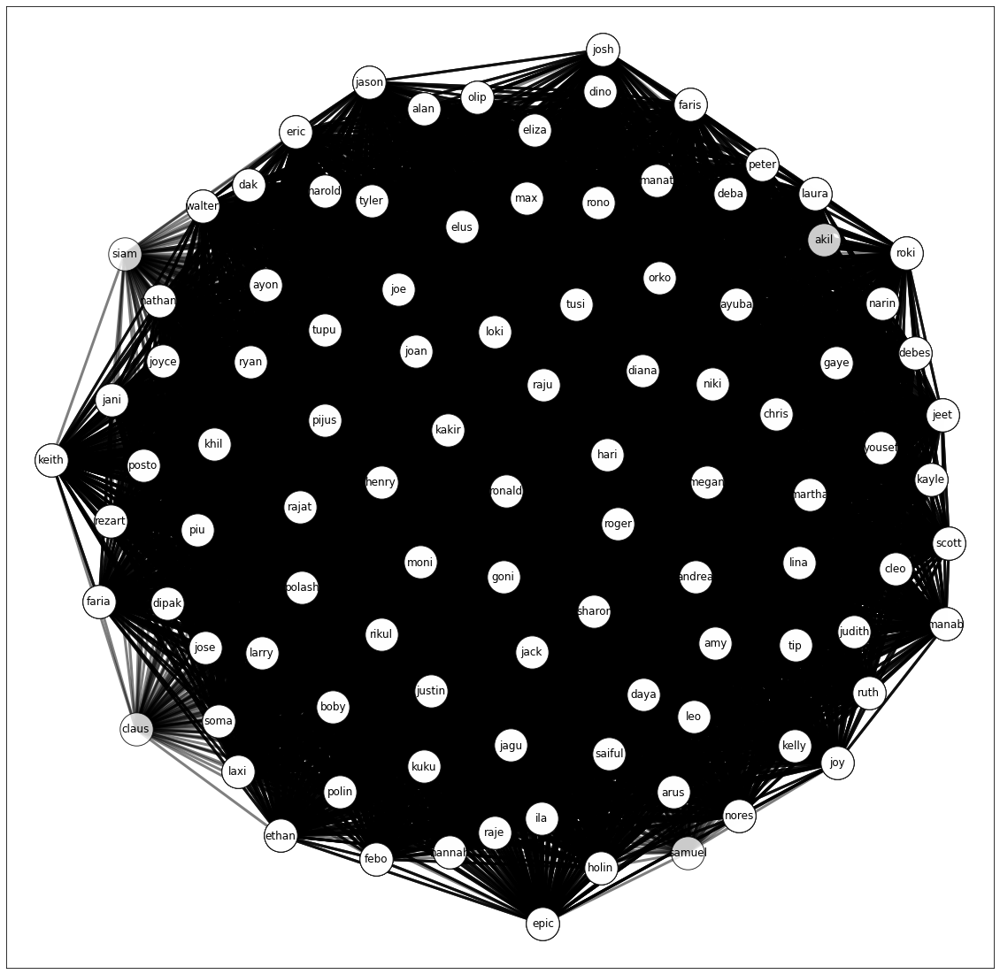

In [64]:
#weights = np.array([0.8, 0.5])

#weights = np.array([.7, .3])

weights = np.array([1, 1])

clusters = evalquery(weights)

weight_final = weights

nclusters = clusters

In [52]:
def clustersprint(tclusters):

    pltdim = len(tclusters)

    wdim = math.ceil(pltdim/4)
    
    #print(wdim)

    plt.subplots(figsize=(20,2))

    QW = []

    QW = [0 for xd in range(0,pltdim)]

    for uz in range(0,pltdim):
        kk = uz+1
        
        #print(kk)
        plt.subplot(wdim, 4, kk)

        QW[uz] = nx.complete_graph(tclusters[uz])
        
        #dcolor = list(mcolor.keys())[uz]
        dcolor = overlap[uz]
        #print(list(QW[uz].nodes()))
        #nx.draw(G1, pos, with_labels=True, node_color = 'silver', node_size=1600)
    
        nx.draw(QW[uz], nodelist=tclusters[uz], node_color = dcolor, edge_color = dcolor, with_labels=True, node_size=800)
        #plt.title('Cluster '+str(uz))

        plt.title('Cluster '+str(uz)+': '+str(tclusters[uz]))
    
#print(len(G8))

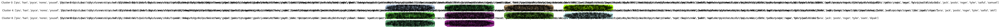

In [53]:
clustersprint(clusters)

In [54]:
def feedbackverify(feedback, ispossible):

    #feedback = ['eliza', 'siam']
    #feedback = ['ayon', 'alan', 'joe']

    rel = []

    #th = 0.5

    #print(feedback)
    for feed in feedback:
        rel.append(list(mapping.keys())[list(mapping.values()).index(feed)])

    print(rel)

    r1 = 2

    s1 = []
    s2 = []

    for subset in combinations(rel, r1):
        if Smaj[subset[0],subset[1]] < thr1 and Syear[subset[0],subset[1]] <thr2:
            ispossible = 1

            stri = "There is no edge between "+ mapping[subset[0]]+" and "+mapping[subset[1]]+".\nTherefore, User feedback is not possible to fulfil."
            print(stri)
            break

        s1.append(Smaj[subset[0],subset[1]])
        s2.append(Syear[subset[0],subset[1]])

    if(ispossible == 1):
        ctypes.windll.user32.MessageBoxW(0, stri, "Inconsistency")

    print(s1,s2)
    print()
    
    return s1,s2,ispossible

In [55]:
def normalizew(s1,s2,feedback_option):

    def objective(x):
        #return (p+(1-x[0])-p*(1-x[0]))*(q+(1-x[1])-q*(1-x[1]))
        return (p*x[0])+(q*x[1])-(p*q*x[0]*x[1]) 
    def constraint(x):
        #return ((p+(1-x[0])-p*(1-x[0]))*(q+(1-x[1])-q*(1-x[1])))-thrf
        return ((p*x[0])+(q*x[1])-(p*q*x[0]*x[1]))-thrf 

    x0 = [0.5,0.5]
    
    #x0 = [[0,0],[0,0.5],[0.5,0],[0,1],[0.5,0.5],[0.5,1],[1,0.5],[1,0],[1,1]]

    b = (0,1)
    bnd = (b,b)
    cons = {'type': 'ineq', 'fun': constraint}
    
    weights_temp = []
    
    if feedback_option == 1:

        th1 = 1.1
        th2 = 1.1

        #th = 0.5

        for i in range(0,len(s1)):
            p = s1[i]
            q = s2[i]
            
            #minimum = 1
            
            #for pit in range(0,len(x0)):

            sol = minimize(objective, x0, method='SLSQP', bounds=bnd, constraints=cons)
                
                #if sol.fun<minimum:
                    #minimum = sol.fun
            r = sol.x
                    #ttt = x0[pit]
                    
                
            #print(r,ttt)
            #print(minimum)

            if r[0]<th1:
                th1 = r[0]
            if r[1]<th2:
                th2 = r[1]

            #print(th1,th2)    
        
        #th1 = round(th1,2)
        #th2 = round(th2,2)
        
        #print(th1,th2 - th2 % 0.01)
        
        #th1 = int(th1*100)/100
        #th2 = int(th2*100)/100
        
        #th1 = th1 - th1 % 0.01
        #th2 = th2 - th2 % 0.01
        
        th1 = int(th1*100)/100+0.01
        th2 = int(th2*100)/100+0.01
        
        #print(tmpt)
        
        weights_temp.append(th1)
        weights_temp.append(th2)

        print()

        for i in range(0,len(s1)):
            p = s1[i]
            q = s2[i]

            print(objective(weights_temp))
            
    else:
        rf = 0

        for i in range(0,len(s1)):
            p = s1[i]
            q = s2[i]

            #print(p1,q1)

            if p<thrf or q<thrf:
                #print(p,q)
                #sol = minimize(objective, x0, method='COBYLA', bounds=bnd, constraints=cons)
                sol = minimize(objective, x0, method='SLSQP', bounds=bnd, constraints=cons)

                r = sol.x

                #print(sol1)

                break
        
        r[0] = int(r[0]*100)/100
        r[1] = int(r[1]*100)/100
        
        ptem = []
        
        bt = 0
        
        ptem.append(r[0]+0.01)
        ptem.append(r[1])
        
        print('Weight Check: ',r)
        
        if objective(ptem)<0.5:
            r[0] = r[0]+0.01
            bt = 0
        else:
            r[1] = r[1]+0.01
            bt = 1
  
        weights_temp.append(r[0])
        weights_temp.append(r[1])
    
        print('Objective Value: ',objective(weights_temp))
        
        weights_temp.append(bt)

    return weights_temp

In [56]:
def feedback_new(feedback):

    #feedback = ['ayon', 'eliza', 'alan']#, 'alan']

    #feedback = ['siam', 'diana', 'alan']

    #feedback = ['ayon', 'alan']

    ispossible = 0
    
    weights_f = []

    s1,s2, ispossible = feedbackverify(feedback, ispossible)

    if ispossible == 0:
        weights_f = normalizew(s1,s2,1)
        
    return s1,s2,weights_f
    #printclusters(nclusters)

In [57]:
#feedback = ['siam', 'eliza', 'ayon']

#feedback = ['siam', 'diana']

#s1,s2,weights = feedback_new(feedback)

#print(s1,s2)

#print('Weights: ',weights)

#nclusters = evalquery(weights)

#weight_final = weights

In [58]:
def fetchdata(obj, fcluster):
    
    import ctypes

    frel = []
    
    weightf2 = -1

    ffeedback = nclusters[fcluster]

    print(ffeedback)

    #fobj = list(mapping.keys())[list(mapping.values()).index(obj)]

    for ffeed in ffeedback:
            findx = list(mapping.keys())[list(mapping.values()).index(ffeed)]
            #if findx !=fobj:
            frel.append(findx)

    #print(frel, fobj)
    print(frel)

    d1 = []
    d2 = []
    
    for subset in combinations(frel, 2):
        d1.append(Smaj[subset[0],subset[1]])
        d2.append(Syear[subset[0],subset[1]])

    #for w in frel:
        #d1.append(Smaj[fobj,w])
        #d2.append(Syear[fobj,w])

    print(d1,d2)

    weightf2 = normalizew(d1,d2,2)

    #if weightf2 == -1:
        #ctypes.windll.user32.MessageBoxW(0, "Not possible", "Inconsistency")
    #else:
        #print('\nweight:', weightf2)
        #print()
        #fclustersf = evalquery(weightf2)
    
    return d1,d2,weightf2

In [59]:
def verify_constraint(simp, wgt):
    #return (simp[0]+(1-wgt[0])-simp[0]*(1-wgt[0]))*(simp[1]+(1-wgt[1])-simp[1]*(1-wgt[1]))
    return (simp[0]*wgt[0])+(simp[1]*wgt[1])-(simp[0]*wgt[0]*simp[1]*wgt[1])

def check_feedback(feedbackm, feedbackn, weight_m):
        is_feedback = 1
        
        for i in range(0,len(feedbackm)):
            for j in range(0,len(feedbackm[i])):
                print('Testing:',feedbackm[i][j],feedbackn[i][j])
                
                temp_var = []
                
                temp_var.append(feedbackm[i][j])
                temp_var.append(feedbackn[i][j])
                
                print(verify_constraint(temp_var,weight_m))
                    
                if verify_constraint(temp_var,weight_m)<0.5:
                    is_feedback = 0
                    break
        return is_feedback

In [60]:
def Fmeasure(gclst):
    #pclst = [['eliza', 'siam', 'ayon'], ['eliza', 'alan'], ['diana', 'joe', 'alan'], ['diana', 'siam', 'ayon']]
    pclst = [['sharon', 'samuel', 'chris', 'lina'],
     ['sharon', 'samuel', 'rajat', 'jason', 'joan'],
     ['sharon', 'samuel', 'rajat', 'jason', 'ayuba'],
     ['sharon', 'samuel', 'rajat', 'joan', 'polash'],
     ['sharon', 'samuel', 'rajat', 'lina', 'laura'],
     ['sharon', 'samuel', 'rajat', 'deba', 'laura'],
     ['sharon', 'samuel', 'rajat', 'deba', 'polash'],
     ['sharon', 'samuel', 'rajat', 'deba', 'ayuba'],
     ['sharon', 'samuel', 'keith', 'joan'],
     ['sharon', 'samuel', 'keith', 'justin'],
     ['sharon', 'samuel', 'ryan', 'jason'],
     ['sharon', 'samuel', 'ryan', 'polash'],
     ['sharon', 'samuel', 'ryan', 'lina'],
     ['sharon', 'samuel', 'justin', 'laura'],
     ['sharon', 'samuel', 'justin', 'ayuba'],
     ['sharon', 'martha', 'diana', 'keith', 'justin'],
     ['sharon', 'martha', 'rajat', 'polash', 'jack'],
     ['sharon', 'martha', 'rajat', 'polash', 'deba'],
     ['sharon', 'martha', 'rajat', 'henry', 'ayuba'],
     ['sharon', 'martha', 'rajat', 'deba', 'laura'],
     ['sharon', 'martha', 'rajat', 'deba', 'ayuba'],
     ['sharon', 'martha', 'rajat', 'lina', 'jack'],
     ['sharon', 'martha', 'rajat', 'lina', 'laura'],
     ['sharon', 'martha', 'rajat', 'lina', 'siam'],
     ['sharon', 'martha', 'harold', 'justin', 'jack'],
     ['sharon', 'martha', 'harold', 'justin', 'laura'],
     ['sharon', 'martha', 'harold', 'justin', 'siam'],
     ['sharon', 'martha', 'harold', 'polash', 'jack'],
     ['sharon', 'martha', 'keith', 'saiful', 'ethan'],
     ['sharon', 'martha', 'ethan', 'siam', 'lina'],
     ['sharon', 'martha', 'ethan', 'saiful', 'jack', 'lina'],
     ['sharon', 'martha', 'ethan', 'saiful', 'henry', 'ayuba'],
     ['sharon', 'martha', 'justin', 'ayuba'],
     ['sharon', 'martha', 'saiful', 'polash', 'jack'],
     ['sharon', 'jason', 'diana', 'rezart'],
     ['sharon', 'jason', 'henry', 'rajat', 'ayuba'],
     ['sharon', 'jason', 'henry', 'ryan', 'saiful'],
     ['sharon', 'jason', 'henry', 'ethan', 'hannah'],
     ['sharon', 'jason', 'henry', 'ethan', 'saiful', 'ayuba'],
     ['sharon', 'jason', 'jack', 'rajat', 'joan'],
     ['sharon', 'jason', 'jack', 'harold', 'joan'],
     ['sharon', 'jason', 'jack', 'ethan', 'hannah'],
     ['sharon', 'jason', 'jack', 'ethan', 'saiful'],
     ['sharon', 'jason', 'jack', 'ryan', 'saiful'],
     ['sharon', 'jason', 'siam', 'joan', 'rajat'],
     ['sharon', 'jason', 'siam', 'joan', 'harold'],
     ['sharon', 'jason', 'siam', 'ethan'],
     ['sharon', 'jason', 'rezart', 'saiful'],
     ['sharon', 'chris', 'siam', 'lina', 'ethan'],
     ['sharon', 'rezart', 'keith', 'justin', 'diana'],
     ['sharon', 'rezart', 'keith', 'saiful'],
     ['sharon', 'rezart', 'polash', 'deba'],
     ['sharon', 'rezart', 'polash', 'saiful'],
     ['sharon', 'ryan', 'saiful', 'polash', 'jack'],
     ['sharon', 'ryan', 'saiful', 'lina', 'jack'],
     ['sharon', 'joan', 'polash', 'jack', 'rajat'],
     ['sharon', 'joan', 'polash', 'jack', 'harold'],
     ['sharon', 'hannah', 'laura', 'deba'],
     ['walter', 'joan', 'samuel', 'scott', 'keith'],
     ['walter', 'joan', 'samuel', 'rajat', 'ayon'],
     ['walter', 'joan', 'samuel', 'rajat', 'peter'],
     ['walter', 'joan', 'yousef', 'ayon'],
     ['walter', 'joan', 'tyler', 'kayle'],
     ['walter', 'joan', 'tyler', 'peter'],
     ['walter', 'joan', 'jack', 'rajat', 'ayon'],
     ['walter', 'joan', 'jack', 'rajat', 'roger'],
     ['walter', 'joan', 'jack', 'kayle', 'roger'],
     ['walter', 'joan', 'roger', 'scott'],
     ['walter', 'joan', 'roger', 'rajat', 'peter'],
     ['walter', 'ruth', 'max', 'hannah'],
     ['walter', 'ruth', 'max', 'lina', 'megan'],
     ['walter', 'ruth', 'max', 'tyler', 'megan'],
     ['walter', 'ruth', 'max', 'tyler', 'diana'],
     ['walter', 'ruth', 'diana', 'jose', 'tyler'],
     ['walter', 'ruth', 'rajat', 'jack', 'ayon', 'lina'],
     ['walter', 'ruth', 'rajat', 'samuel', 'ayon', 'lina'],
     ['walter', 'ruth', 'rajat', 'samuel', 'deba'],
     ['walter', 'ruth', 'rajat', 'jose'],
     ['walter', 'ruth', 'tyler', 'megan', 'jose'],
     ['walter', 'ruth', 'megan', 'deba'],
     ['walter', 'ruth', 'hannah', 'jack'],
     ['walter', 'ruth', 'hannah', 'jose'],
     ['walter', 'ruth', 'hannah', 'deba'],
     ['walter', 'alan', 'joe', 'scott'],
     ['walter', 'alan', 'joe', 'ethan'],
     ['walter', 'alan', 'ethan', 'jack'],
     ['walter', 'alan', 'ethan', 'chris'],
     ['walter', 'alan', 'ethan', 'ayuba'],
     ['walter', 'alan', 'kayle', 'jack', 'roger'],
     ['walter', 'alan', 'kayle', 'chris'],
     ['walter', 'alan', 'kayle', 'raju'],
     ['walter', 'alan', 'kayle', 'ayuba'],
     ['walter', 'alan', 'ryan', 'raju'],
     ['walter', 'alan', 'ryan', 'roger', 'jack'],
     ['walter', 'alan', 'ryan', 'roger', 'scott'],
     ['walter', 'alan', 'scott', 'chris'],
     ['walter', 'rajat', 'samuel', 'ayon', 'judith'],
     ['walter', 'rajat', 'samuel', 'ayon', 'laura', 'lina'],
     ['walter', 'rajat', 'samuel', 'ayon', 'ayuba'],
     ['walter', 'rajat', 'samuel', 'peter', 'laura', 'lina'],
     ['walter', 'rajat', 'samuel', 'peter', 'laura', 'deba'],
     ['walter', 'rajat', 'samuel', 'deba', 'ayuba'],
     ['walter', 'rajat', 'roger', 'judith'],
     ['walter', 'rajat', 'roger', 'deba', 'peter'],
     ['walter', 'rajat', 'jose', 'ayuba'],
     ['walter', 'raju', 'diana', 'keith'],
     ['walter', 'raju', 'diana', 'kayle'],
     ['walter', 'raju', 'diana', 'yousef'],
     ['walter', 'raju', 'judith', 'ayon'],
     ['walter', 'raju', 'judith', 'kayle'],
     ['walter', 'raju', 'judith', 'hannah'],
     ['walter', 'raju', 'ayon', 'laura', 'lina'],
     ['walter', 'raju', 'ayon', 'yousef'],
     ['walter', 'raju', 'megan', 'keith'],
     ['walter', 'raju', 'megan', 'lina', 'laura'],
     ['walter', 'raju', 'megan', 'lina', 'ryan'],
     ['walter', 'raju', 'megan', 'deba', 'laura'],
     ['walter', 'raju', 'megan', 'deba', 'kayle'],
     ['walter', 'raju', 'megan', 'deba', 'yousef'],
     ['walter', 'raju', 'hannah', 'deba', 'laura'],
     ['walter', 'raju', 'hannah', 'deba', 'yousef'],
     ['walter', 'lina', 'samuel', 'scott', 'chris'],
     ['walter', 'lina', 'samuel', 'scott', 'laura'],
     ['walter', 'lina', 'samuel', 'scott', 'ryan'],
     ['walter', 'lina', 'max', 'megan', 'scott', 'chris'],
     ['walter', 'lina', 'max', 'megan', 'scott', 'laura'],
     ['walter', 'lina', 'max', 'megan', 'scott', 'ryan'],
     ['walter', 'lina', 'max', 'megan', 'peter', 'laura'],
     ['walter', 'lina', 'jack', 'ethan', 'ayon'],
     ['walter', 'lina', 'jack', 'ryan'],
     ['walter', 'lina', 'ethan', 'chris'],
     ['walter', 'lina', 'ethan', 'peter'],
     ['walter', 'jack', 'hannah', 'ethan'],
     ['walter', 'keith', 'scott', 'megan'],
     ['walter', 'keith', 'jose', 'megan'],
     ['walter', 'keith', 'jose', 'diana'],
     ['walter', 'keith', 'jose', 'ethan'],
     ['walter', 'ayon', 'ayuba', 'ethan'],
     ['walter', 'ayon', 'joe', 'laura', 'larry'],
     ['walter', 'ayon', 'joe', 'ethan', 'judith'],
     ['walter', 'ayon', 'joe', 'ethan', 'yousef', 'larry'],
     ['walter', 'ayon', 'samuel', 'larry', 'laura'],
     ['walter', 'kayle', 'max', 'chris', 'megan'],
     ['walter', 'kayle', 'max', 'tyler', 'megan'],
     ['walter', 'kayle', 'max', 'tyler', 'diana', 'larry'],
     ['walter', 'kayle', 'judith', 'chris'],
     ['walter', 'kayle', 'judith', 'roger'],
     ['walter', 'kayle', 'deba', 'roger'],
     ['walter', 'kayle', 'deba', 'ayuba'],
     ['walter', 'kayle', 'ayuba', 'tyler'],
     ['walter', 'joyce', 'samuel', 'ryan'],
     ['walter', 'joyce', 'samuel', 'judith', 'chris'],
     ['walter', 'joyce', 'samuel', 'deba', 'ayuba'],
     ['walter', 'joyce', 'samuel', 'larry'],
     ['walter', 'joyce', 'max', 'chris', 'megan'],
     ['walter', 'joyce', 'max', 'hannah'],
     ['walter', 'joyce', 'max', 'tyler', 'megan'],
     ['walter', 'joyce', 'max', 'tyler', 'diana', 'larry'],
     ['walter', 'joyce', 'max', 'ryan', 'megan'],
     ['walter', 'joyce', 'judith', 'roger'],
     ['walter', 'joyce', 'judith', 'ethan', 'chris'],
     ['walter', 'joyce', 'judith', 'ethan', 'joe'],
     ['walter', 'joyce', 'judith', 'ethan', 'hannah'],
     ['walter', 'joyce', 'yousef', 'megan', 'chris'],
     ['walter', 'joyce', 'yousef', 'megan', 'jose'],
     ['walter', 'joyce', 'yousef', 'megan', 'deba'],
     ['walter', 'joyce', 'yousef', 'diana', 'jose'],
     ['walter', 'joyce', 'yousef', 'diana', 'larry'],
     ['walter', 'joyce', 'yousef', 'ethan', 'chris'],
     ['walter', 'joyce', 'yousef', 'ethan', 'joe', 'larry'],
     ['walter', 'joyce', 'yousef', 'ethan', 'hannah', 'jose'],
     ['walter', 'joyce', 'yousef', 'deba', 'joe'],
     ['walter', 'joyce', 'yousef', 'deba', 'hannah'],
     ['walter', 'joyce', 'tyler', 'jose', 'megan'],
     ['walter', 'joyce', 'tyler', 'jose', 'diana'],
     ['walter', 'joyce', 'tyler', 'jose', 'ayuba'],
     ['walter', 'joyce', 'ryan', 'roger'],
     ['walter', 'joyce', 'roger', 'deba'],
     ['walter', 'joyce', 'ayuba', 'jose', 'ethan'],
     ['walter', 'scott', 'joe', 'judith'],
     ['walter', 'scott', 'joe', 'laura', 'larry'],
     ['walter', 'scott', 'max', 'hannah', 'laura'],
     ['walter', 'scott', 'max', 'larry', 'laura'],
     ['walter', 'scott', 'samuel', 'judith', 'chris'],
     ['walter', 'scott', 'samuel', 'larry', 'laura'],
     ['walter', 'scott', 'judith', 'roger'],
     ['walter', 'scott', 'judith', 'hannah'],
     ['walter', 'laura', 'peter', 'hannah', 'max'],
     ['walter', 'laura', 'peter', 'hannah', 'deba'],
     ['walter', 'laura', 'peter', 'deba', 'megan'],
     ['walter', 'laura', 'deba', 'joe'],
     ['walter', 'peter', 'diana', 'max', 'tyler'],
     ['walter', 'peter', 'ethan', 'hannah'],
     ['walter', 'peter', 'tyler', 'megan', 'max'],
     ['ronald', 'joan', 'jack', 'roger', 'harold'],
     ['ronald', 'joan', 'amy', 'keith'],
     ['ronald', 'joan', 'amy', 'roger', 'peter'],
     ['ronald', 'joan', 'amy', 'roger', 'harold'],
     ['ronald', 'alan', 'roger', 'jack', 'harold'],
     ['ronald', 'alan', 'martha', 'jack', 'harold'],
     ['ronald', 'alan', 'martha', 'joe'],
     ['ronald', 'alan', 'martha', 'ayuba'],
     ['ronald', 'harold', 'megan', 'laura', 'martha'],
     ['ronald', 'harold', 'laura', 'amy'],
     ['ronald', 'harold', 'eric', 'roger'],
     ['ronald', 'laura', 'hannah', 'peter'],
     ['ronald', 'laura', 'joe', 'martha'],
     ['ronald', 'laura', 'peter', 'megan'],
     ['ronald', 'laura', 'peter', 'amy'],
     ['ronald', 'hannah', 'jack', 'ruth'],
     ['ronald', 'saiful', 'martha', 'jack'],
     ['ronald', 'saiful', 'martha', 'keith', 'megan'],
     ['ronald', 'saiful', 'martha', 'joe'],
     ['ronald', 'saiful', 'martha', 'ayuba'],
     ['ronald', 'saiful', 'ruth', 'jack'],
     ['ronald', 'saiful', 'ruth', 'amy'],
     ['ronald', 'saiful', 'ruth', 'megan'],
     ['ronald', 'saiful', 'rezart', 'keith', 'eric'],
     ['ronald', 'saiful', 'amy', 'keith'],
     ['ronald', 'saiful', 'amy', 'peter'],
     ['ronald', 'saiful', 'amy', 'ayuba'],
     ['ronald', 'saiful', 'eric', 'ayuba'],
     ['ronald', 'saiful', 'peter', 'megan'],
     ['henry', 'martha', 'scott', 'megan'],
     ['henry', 'martha', 'scott', 'alan'],
     ['henry', 'martha', 'megan', 'joyce'],
     ['henry', 'martha', 'megan', 'saiful'],
     ['henry', 'martha', 'ayuba', 'alan', 'ethan'],
     ['henry', 'martha', 'ayuba', 'joyce', 'ethan'],
     ['henry', 'jason', 'megan', 'ryan', 'joyce'],
     ['henry', 'jason', 'megan', 'ryan', 'saiful'],
     ['henry', 'jason', 'rajat', 'ayon', 'judith'],
     ['henry', 'jason', 'rajat', 'ayon', 'amy', 'ayuba'],
     ['henry', 'jason', 'rajat', 'nathan'],
     ['henry', 'jason', 'ryan', 'andrea', 'saiful'],
     ['henry', 'jason', 'ryan', 'alan'],
     ['henry', 'jason', 'ethan', 'judith', 'ayon'],
     ['henry', 'jason', 'ethan', 'judith', 'hannah', 'joyce'],
     ['henry', 'jason', 'ethan', 'andrea', 'ayon', 'saiful'],
     ['henry', 'jason', 'ethan', 'andrea', 'nathan', 'hannah'],
     ['henry', 'jason', 'ethan', 'andrea', 'nathan', 'saiful'],
     ['henry', 'jason', 'ethan', 'ayuba', 'alan'],
     ['henry', 'jason', 'ethan', 'ayuba', 'ayon', 'saiful', 'amy'],
     ['henry', 'jason', 'ethan', 'ayuba', 'ayon', 'saiful', 'eric'],
     ['henry', 'jason', 'ethan', 'ayuba', 'joyce', 'amy'],
     ['henry', 'scott', 'judith', 'roger'],
     ['henry', 'scott', 'judith', 'hannah'],
     ['henry', 'scott', 'hannah', 'andrea'],
     ['henry', 'scott', 'ryan', 'andrea'],
     ['henry', 'scott', 'ryan', 'alan', 'roger'],
     ['henry', 'scott', 'ryan', 'megan'],
     ['henry', 'roger', 'rajat', 'judith'],
     ['henry', 'roger', 'rajat', 'amy'],
     ['henry', 'roger', 'eric'],
     ['henry', 'roger', 'joyce', 'judith'],
     ['henry', 'roger', 'joyce', 'amy'],
     ['henry', 'roger', 'joyce', 'ryan'],
     ['henry', 'jose', 'megan', 'joyce'],
     ['henry', 'jose', 'rajat', 'nathan'],
     ['henry', 'jose', 'rajat', 'ayuba'],
     ['henry', 'jose', 'ethan', 'hannah', 'andrea', 'nathan'],
     ['henry', 'jose', 'ethan', 'hannah', 'joyce'],
     ['henry', 'jose', 'ethan', 'ayuba', 'joyce'],
     ['harold', 'joan', 'scott', 'siam'],
     ['harold', 'joan', 'scott', 'roger'],
     ['harold', 'joan', 'amy', 'jason', 'siam'],
     ['harold', 'joan', 'amy', 'yousef'],
     ['harold', 'joan', 'roger', 'polash', 'jack'],
     ['harold', 'judith', 'kelly', 'jason', 'raju'],
     ['harold', 'judith', 'kelly', 'roger', 'scott'],
     ['harold', 'judith', 'polash', 'roger', 'joyce'],
     ['harold', 'judith', 'joyce', 'jason'],
     ['harold', 'alan', 'jack', 'jason'],
     ['harold', 'alan', 'kelly', 'jason', 'raju'],
     ['harold', 'alan', 'kelly', 'scott', 'roger'],
     ['harold', 'alan', 'kelly', 'scott', 'martha'],
     ['harold', 'jack', 'roger', 'justin'],
     ['harold', 'megan', 'jason', 'kelly', 'raju', 'siam'],
     ['harold', 'megan', 'jason', 'joyce'],
     ['harold', 'megan', 'raju', 'kelly', 'yousef'],
     ['harold', 'megan', 'raju', 'justin', 'laura'],
     ['harold', 'megan', 'raju', 'justin', 'siam'],
     ['harold', 'megan', 'raju', 'justin', 'yousef'],
     ['harold', 'megan', 'jose', 'siam'],
     ['harold', 'megan', 'jose', 'joyce', 'polash'],
     ['harold', 'megan', 'jose', 'joyce', 'yousef'],
     ['harold', 'megan', 'martha', 'justin', 'scott', 'laura'],
     ['harold', 'megan', 'martha', 'justin', 'scott', 'siam'],
     ['harold', 'megan', 'martha', 'justin', 'yousef'],
     ['harold', 'megan', 'martha', 'max', 'scott', 'kelly', 'siam'],
     ['harold', 'megan', 'martha', 'max', 'scott', 'laura'],
     ['harold', 'megan', 'martha', 'max', 'joyce'],
     ['harold', 'megan', 'martha', 'polash', 'joyce'],
     ['harold', 'megan', 'martha', 'yousef', 'kelly'],
     ['harold', 'megan', 'martha', 'yousef', 'joyce'],
     ['harold', 'amy', 'kelly', 'siam', 'jason'],
     ['harold', 'amy', 'kelly', 'siam', 'max'],
     ['harold', 'amy', 'kelly', 'roger'],
     ['harold', 'amy', 'kelly', 'yousef'],
     ['harold', 'amy', 'laura', 'max'],
     ['harold', 'amy', 'joyce', 'jason'],
     ['harold', 'amy', 'joyce', 'roger'],
     ['harold', 'amy', 'joyce', 'max'],
     ['harold', 'amy', 'joyce', 'yousef'],
     ['harold', 'eric', 'jason'],
     ['harold', 'eric', 'justin', 'roger'],
     ['harold', 'eric', 'justin', 'yousef'],
     ['harold', 'roger', 'justin', 'scott'],
     ['eliza', 'samuel', 'rono', 'larry', 'laura'],
     ['eliza', 'samuel', 'rono', 'larry', 'eric'],
     ['eliza', 'samuel', 'rono', 'larry', 'joyce'],
     ['eliza', 'samuel', 'rono', 'joan'],
     ['eliza', 'samuel', 'rono', 'lina', 'laura'],
     ['eliza', 'samuel', 'rono', 'lina', 'eric'],
     ['eliza', 'samuel', 'judith', 'scott'],
     ['eliza', 'samuel', 'judith', 'joyce'],
     ['eliza', 'samuel', 'scott', 'joan'],
     ['eliza', 'samuel', 'scott', 'laura', 'larry'],
     ['eliza', 'samuel', 'scott', 'laura', 'lina'],
     ['eliza', 'samuel', 'amy', 'peter', 'joan'],
     ['eliza', 'samuel', 'amy', 'peter', 'laura'],
     ['eliza', 'samuel', 'amy', 'joyce'],
     ['eliza', 'samuel', 'peter', 'lina', 'laura'],
     ['eliza', 'max', 'laura', 'larry', 'scott'],
     ['eliza', 'max', 'laura', 'larry', 'rono'],
     ['eliza', 'max', 'laura', 'amy', 'peter'],
     ['eliza', 'max', 'laura', 'hannah', 'scott'],
     ['eliza', 'max', 'laura', 'hannah', 'peter'],
     ['eliza', 'max', 'laura', 'lina', 'peter'],
     ['eliza', 'max', 'laura', 'lina', 'martha', 'scott'],
     ['eliza', 'max', 'laura', 'lina', 'martha', 'rono'],
     ['eliza', 'max', 'diana', 'tyler', 'peter', 'amy'],
     ['eliza', 'max', 'diana', 'tyler', 'joyce', 'amy'],
     ['eliza', 'max', 'diana', 'tyler', 'joyce', 'martha'],
     ['eliza', 'max', 'diana', 'tyler', 'joyce', 'larry'],
     ['eliza', 'max', 'joyce', 'hannah'],
     ['eliza', 'max', 'joyce', 'rono', 'martha'],
     ['eliza', 'max', 'joyce', 'rono', 'larry'],
     ['eliza', 'judith', 'hannah', 'scott'],
     ['eliza', 'judith', 'hannah', 'joyce'],
     ['eliza', 'alan', 'martha', 'scott'],
     ['eliza', 'alan', 'martha', 'rono'],
     ['eliza', 'yousef', 'joan', 'amy'],
     ['eliza', 'yousef', 'joan', 'rono'],
     ['eliza', 'yousef', 'eric', 'rono', 'larry'],
     ['eliza', 'yousef', 'joyce', 'hannah', 'jose'],
     ['eliza', 'yousef', 'joyce', 'rono', 'martha'],
     ['eliza', 'yousef', 'joyce', 'rono', 'jose'],
     ['eliza', 'yousef', 'joyce', 'rono', 'larry'],
     ['eliza', 'yousef', 'joyce', 'diana', 'amy'],
     ['eliza', 'yousef', 'joyce', 'diana', 'martha'],
     ['eliza', 'yousef', 'joyce', 'diana', 'jose'],
     ['eliza', 'yousef', 'joyce', 'diana', 'larry'],
     ['eliza', 'joan', 'tyler', 'amy', 'peter'],
     ['eliza', 'eric', 'tyler', 'larry'],
     ['eliza', 'jose', 'tyler', 'diana', 'joyce'],
     ['siam', 'tyler', 'max', 'megan', 'martha'],
     ['siam', 'tyler', 'max', 'amy'],
     ['siam', 'tyler', 'max', 'larry'],
     ['siam', 'tyler', 'martha', 'megan', 'justin'],
     ['siam', 'tyler', 'nathan', 'jason', 'joan'],
     ['siam', 'tyler', 'nathan', 'justin', 'larry'],
     ['siam', 'tyler', 'nathan', 'jose'],
     ['siam', 'tyler', 'megan', 'jason'],
     ['siam', 'tyler', 'megan', 'jose'],
     ['siam', 'tyler', 'amy', 'jason', 'joan'],
     ['siam', 'kelly', 'jason', 'rajat', 'amy'],
     ['siam', 'kelly', 'jason', 'ethan', 'amy'],
     ['siam', 'kelly', 'larry', 'max', 'scott'],
     ['siam', 'kelly', 'larry', 'max', 'rono'],
     ['siam', 'kelly', 'larry', 'ethan'],
     ['siam', 'kelly', 'lina', 'chris', 'megan', 'scott', 'max'],
     ['siam', 'kelly', 'lina', 'chris', 'ethan'],
     ['siam', 'kelly', 'lina', 'raju', 'megan'],
     ['siam', 'kelly', 'lina', 'martha', 'rajat'],
     ['siam', 'kelly', 'lina', 'martha', 'max', 'scott', 'megan'],
     ['siam', 'kelly', 'lina', 'martha', 'max', 'rono'],
     ['siam', 'kelly', 'lina', 'martha', 'ethan'],
     ['siam', 'nathan', 'rajat', 'jason', 'joan'],
     ['siam', 'nathan', 'rajat', 'jose'],
     ['siam', 'nathan', 'rono', 'joan'],
     ['siam', 'nathan', 'rono', 'jose'],
     ['siam', 'nathan', 'rono', 'larry'],
     ['siam', 'nathan', 'ethan', 'jason'],
     ['siam', 'nathan', 'ethan', 'jose'],
     ['siam', 'nathan', 'ethan', 'larry'],
     ['siam', 'joan', 'rajat', 'jason', 'amy'],
     ['siam', 'justin', 'larry', 'scott'],
     ['amy', 'ruth', 'kelly', 'ayon', 'rajat'],
     ['amy', 'ruth', 'kelly', 'ayon', 'saiful'],
     ['amy', 'ruth', 'kelly', 'rajat', 'deba'],
     ['amy', 'ruth', 'kelly', 'max', 'diana'],
     ['amy', 'ruth', 'kelly', 'max', 'saiful'],
     ['amy', 'ruth', 'samuel', 'rajat', 'ayon'],
     ['amy', 'ruth', 'samuel', 'rajat', 'deba'],
     ['amy', 'ruth', 'tyler', 'max', 'diana'],
     ['amy', 'ruth', 'tyler', 'max', 'saiful'],
     ['amy', 'yousef', 'kelly', 'ayon', 'saiful', 'ethan'],
     ['amy', 'yousef', 'kelly', 'diana'],
     ['amy', 'yousef', 'kelly', 'deba'],
     ['amy', 'yousef', 'joan', 'ayon'],
     ['amy', 'yousef', 'joyce', 'deba'],
     ['amy', 'yousef', 'joyce', 'ethan'],
     ['amy', 'keith', 'samuel', 'joan'],
     ['amy', 'keith', 'diana'],
     ['amy', 'keith', 'ethan', 'saiful'],
     ['amy', 'ayon', 'jason', 'saiful', 'kelly', 'ethan'],
     ['amy', 'ayon', 'jason', 'rajat', 'kelly'],
     ['amy', 'ayon', 'jason', 'rajat', 'samuel', 'joan'],
     ['amy', 'ayon', 'jason', 'rajat', 'samuel', 'ayuba'],
     ['amy', 'ayon', 'laura', 'rajat', 'samuel'],
     ['amy', 'joyce', 'jason', 'diana', 'tyler'],
     ['amy', 'joyce', 'jason', 'ayuba', 'samuel'],
     ['amy', 'joyce', 'jason', 'ayuba', 'tyler'],
     ['amy', 'joyce', 'roger', 'deba'],
     ['amy', 'joyce', 'deba', 'samuel', 'ayuba'],
     ['amy', 'peter', 'max', 'kelly', 'diana'],
     ['amy', 'peter', 'max', 'kelly', 'saiful'],
     ['amy', 'peter', 'max', 'saiful', 'tyler'],
     ['amy', 'peter', 'jason', 'kelly', 'rajat'],
     ['amy', 'peter', 'jason', 'kelly', 'diana'],
     ['amy', 'peter', 'jason', 'kelly', 'saiful', 'ethan'],
     ['amy', 'peter', 'jason', 'joan', 'rajat', 'samuel'],
     ['amy', 'peter', 'jason', 'joan', 'tyler'],
     ['amy', 'peter', 'jason', 'tyler', 'diana'],
     ['amy', 'peter', 'jason', 'tyler', 'saiful'],
     ['amy', 'peter', 'deba', 'rajat', 'kelly', 'roger'],
     ['amy', 'peter', 'deba', 'rajat', 'laura', 'samuel'],
     ['amy', 'peter', 'roger', 'rajat', 'joan'],
     ['amy', 'ayuba', 'jason', 'tyler', 'saiful'],
     ['amy', 'ayuba', 'deba', 'rajat', 'samuel'],
     ['eric', 'samuel', 'chris', 'lina'],
     ['eric', 'samuel', 'keith', 'justin'],
     ['eric', 'samuel', 'ayon', 'jason', 'ayuba'],
     ['eric', 'samuel', 'ayon', 'lina'],
     ['eric', 'samuel', 'ayon', 'larry'],
     ['eric', 'samuel', 'justin', 'larry'],
     ['eric', 'samuel', 'justin', 'ayuba'],
     ['eric', 'chris', 'kayle'],
     ['eric', 'chris', 'ethan', 'yousef'],
     ['eric', 'chris', 'ethan', 'lina'],
     ['eric', 'kayle', 'roger', 'justin'],
     ['eric', 'kayle', 'rono', 'larry'],
     ['eric', 'kayle', 'tyler', 'larry', 'justin'],
     ['eric', 'kayle', 'tyler', 'ayuba', 'jason'],
     ['eric', 'kayle', 'tyler', 'ayuba', 'justin'],
     ['eric', 'larry', 'yousef', 'ayon', 'ethan'],
     ['eric', 'larry', 'yousef', 'justin'],
     ['eric', 'justin', 'keith', 'rezart'],
     ['eric', 'justin', 'rezart', 'yousef'],
     ['eric', 'saiful', 'keith', 'ethan'],
     ['eric', 'saiful', 'rono', 'rezart', 'yousef'],
     ['eric', 'saiful', 'rono', 'lina'],
     ['eric', 'saiful', 'ayon', 'rezart', 'jason'],
     ['eric', 'saiful', 'ayon', 'rezart', 'yousef'],
     ['eric', 'saiful', 'ayon', 'ethan', 'yousef'],
     ['eric', 'saiful', 'ayon', 'ethan', 'lina'],
     ['eric', 'saiful', 'tyler', 'jason', 'ayuba'],
     ['justin', 'samuel', 'ruth', 'nathan'],
     ['justin', 'samuel', 'keith', 'scott'],
     ['justin', 'samuel', 'laura', 'andrea', 'scott'],
     ['justin', 'samuel', 'laura', 'andrea', 'nathan'],
     ['justin', 'samuel', 'laura', 'peter'],
     ['justin', 'samuel', 'laura', 'larry', 'scott'],
     ['justin', 'samuel', 'laura', 'larry', 'nathan'],
     ['justin', 'diana', 'yousef', 'raju'],
     ['justin', 'diana', 'yousef', 'martha'],
     ['justin', 'diana', 'yousef', 'rezart'],
     ['justin', 'diana', 'yousef', 'larry'],
     ['justin', 'diana', 'tyler', 'ruth'],
     ['justin', 'diana', 'tyler', 'kayle', 'larry'],
     ['justin', 'diana', 'tyler', 'peter'],
     ['justin', 'diana', 'tyler', 'martha'],
     ['justin', 'diana', 'keith', 'raju'],
     ['justin', 'diana', 'raju', 'kayle'],
     ['justin', 'andrea', 'raju', 'laura'],
     ['justin', 'andrea', 'raju', 'kayle'],
     ['justin', 'andrea', 'raju', 'yousef'],
     ['justin', 'andrea', 'kayle', 'nathan'],
     ['justin', 'jack', 'ruth'],
     ['justin', 'jack', 'kayle', 'roger'],
     ['justin', 'nathan', 'kayle', 'larry', 'tyler'],
     ['justin', 'nathan', 'tyler', 'ruth'],
     ['justin', 'scott', 'keith', 'megan', 'martha'],
     ['justin', 'scott', 'keith', 'rezart'],
     ['justin', 'megan', 'ruth', 'tyler'],
     ['justin', 'megan', 'kayle', 'raju'],
     ['justin', 'megan', 'kayle', 'tyler'],
     ['justin', 'megan', 'raju', 'keith'],
     ['justin', 'megan', 'peter', 'laura'],
     ['justin', 'megan', 'peter', 'tyler'],
     ['justin', 'roger', 'peter'],
     ['justin', 'ayuba', 'tyler', 'martha'],
     ['jason', 'samuel', 'andrea', 'joan', 'ayon'],
     ['jason', 'samuel', 'andrea', 'joan', 'nathan'],
     ['jason', 'samuel', 'andrea', 'ryan'],
     ['jason', 'samuel', 'rajat', 'judith', 'ayon'],
     ['jason', 'samuel', 'rajat', 'nathan', 'joan'],
     ['jason', 'samuel', 'joyce', 'judith'],
     ['jason', 'samuel', 'joyce', 'ryan'],
     ['jason', 'diana', 'kelly', 'kayle', 'raju'],
     ['jason', 'diana', 'kelly', 'rezart'],
     ['jason', 'diana', 'joyce', 'rezart'],
     ['jason', 'diana', 'tyler', 'kayle'],
     ['jason', 'raju', 'andrea', 'kayle'],
     ['jason', 'raju', 'andrea', 'hannah'],
     ['jason', 'raju', 'andrea', 'saiful', 'ayon'],
     ['jason', 'raju', 'andrea', 'saiful', 'ryan'],
     ['jason', 'raju', 'kelly', 'judith', 'ayon'],
     ['jason', 'raju', 'kelly', 'judith', 'kayle'],
     ['jason', 'raju', 'kelly', 'judith', 'hannah'],
     ['jason', 'raju', 'kelly', 'alan', 'kayle'],
     ['jason', 'raju', 'kelly', 'megan', 'kayle'],
     ['jason', 'raju', 'kelly', 'megan', 'saiful'],
     ['jason', 'raju', 'kelly', 'saiful', 'ayon'],
     ['jason', 'raju', 'ryan', 'megan', 'saiful'],
     ['jason', 'raju', 'ryan', 'alan'],
     ['jason', 'tyler', 'megan', 'kayle'],
     ['jason', 'tyler', 'megan', 'peter', 'saiful'],
     ['jason', 'tyler', 'megan', 'joyce'],
     ['jason', 'tyler', 'nathan', 'joan', 'kayle'],
     ['jason', 'tyler', 'nathan', 'saiful'],
     ['jason', 'jack', 'alan', 'kayle'],
     ['jason', 'jack', 'alan', 'ethan'],
     ['jason', 'jack', 'alan', 'ryan'],
     ['jason', 'jack', 'kayle', 'joan'],
     ['jason', 'jack', 'ayon', 'joan', 'rajat'],
     ['jason', 'jack', 'ayon', 'ethan', 'saiful'],
     ['jason', 'kelly', 'rajat', 'judith', 'ayon'],
     ['jason', 'kelly', 'peter', 'megan', 'saiful'],
     ['jason', 'kelly', 'peter', 'ethan', 'hannah'],
     ['jason', 'kelly', 'rezart', 'ayon', 'saiful'],
     ['jason', 'kelly', 'ethan', 'judith', 'ayon'],
     ['jason', 'kelly', 'ethan', 'judith', 'hannah'],
     ['jason', 'kelly', 'ethan', 'alan'],
     ['jason', 'kayle', 'joan', 'andrea', 'nathan'],
     ['jason', 'kayle', 'ayuba', 'alan'],
     ['andrea', 'rono', 'nathan', 'jose'],
     ['andrea', 'rono', 'nathan', 'samuel', 'joan'],
     ['andrea', 'rono', 'nathan', 'samuel', 'laura'],
     ['andrea', 'rono', 'nathan', 'kayle', 'joan'],
     ['andrea', 'rono', 'nathan', 'saiful'],
     ['andrea', 'rono', 'ryan', 'lina', 'samuel'],
     ['andrea', 'rono', 'ryan', 'lina', 'saiful'],
     ['andrea', 'rono', 'yousef', 'joan'],
     ['andrea', 'rono', 'yousef', 'jose'],
     ['andrea', 'rono', 'yousef', 'saiful'],
     ['andrea', 'rono', 'lina', 'laura', 'samuel'],
     ['andrea', 'polash', 'samuel', 'joan'],
     ['andrea', 'polash', 'samuel', 'ryan'],
     ['andrea', 'polash', 'jose'],
     ['andrea', 'polash', 'saiful', 'ryan'],
     ['andrea', 'chris', 'kayle'],
     ['andrea', 'chris', 'yousef', 'ethan'],
     ['andrea', 'chris', 'lina', 'scott', 'samuel'],
     ['andrea', 'chris', 'lina', 'ethan'],
     ['andrea', 'yousef', 'ayon', 'joan'],
     ['andrea', 'yousef', 'ayon', 'saiful', 'raju'],
     ['andrea', 'yousef', 'ayon', 'saiful', 'ethan'],
     ['andrea', 'yousef', 'hannah', 'raju'],
     ['andrea', 'yousef', 'hannah', 'jose', 'ethan'],
     ['andrea', 'lina', 'scott', 'samuel', 'laura'],
     ['andrea', 'lina', 'scott', 'samuel', 'ryan'],
     ['andrea', 'lina', 'ayon', 'raju', 'laura'],
     ['andrea', 'lina', 'ayon', 'raju', 'saiful'],
     ['andrea', 'lina', 'ayon', 'samuel', 'laura'],
     ['andrea', 'lina', 'ayon', 'ethan', 'saiful'],
     ['andrea', 'lina', 'ryan', 'raju', 'saiful'],
     ['andrea', 'scott', 'samuel', 'joan'],
     ['andrea', 'scott', 'hannah', 'laura'],
     ['andrea', 'laura', 'nathan', 'hannah'],
     ['andrea', 'laura', 'hannah', 'raju'],
     ['nathan', 'joe', 'deba', 'laura'],
     ['nathan', 'joe', 'laura', 'larry'],
     ['nathan', 'joe', 'ethan', 'larry'],
     ['nathan', 'joe', 'ethan', 'saiful'],
     ['nathan', 'ruth', 'hannah', 'jose'],
     ['nathan', 'ruth', 'hannah', 'deba'],
     ['nathan', 'ruth', 'rajat', 'samuel', 'deba'],
     ['nathan', 'ruth', 'rajat', 'jose'],
     ['nathan', 'ruth', 'rono', 'samuel', 'deba'],
     ['nathan', 'ruth', 'rono', 'jose'],
     ['nathan', 'ruth', 'rono', 'saiful'],
     ['nathan', 'ruth', 'tyler', 'jose'],
     ['nathan', 'ruth', 'tyler', 'saiful'],
     ['nathan', 'rajat', 'samuel', 'laura', 'deba'],
     ['nathan', 'deba', 'hannah', 'laura'],
     ['nathan', 'deba', 'rono', 'laura', 'samuel'],
     ['nathan', 'deba', 'rono', 'kayle'],
     ['nathan', 'larry', 'rono', 'laura', 'samuel'],
     ['nathan', 'larry', 'rono', 'kayle'],
     ['rezart', 'scott', 'kelly'],
     ['rezart', 'polash', 'joyce', 'deba'],
     ['rezart', 'yousef', 'kelly', 'ayon', 'saiful'],
     ['rezart', 'yousef', 'kelly', 'rono', 'deba'],
     ['rezart', 'yousef', 'kelly', 'rono', 'saiful'],
     ['rezart', 'yousef', 'kelly', 'diana'],
     ['rezart', 'yousef', 'joyce', 'rono', 'deba'],
     ['rezart', 'yousef', 'joyce', 'diana'],
     ['polash', 'rajat', 'judith', 'samuel'],
     ['polash', 'rajat', 'judith', 'roger'],
     ['polash', 'rajat', 'peter', 'joan', 'samuel'],
     ['polash', 'rajat', 'peter', 'joan', 'roger'],
     ['polash', 'rajat', 'peter', 'deba', 'samuel'],
     ['polash', 'rajat', 'peter', 'deba', 'roger'],
     ['polash', 'rajat', 'roger', 'jack', 'joan'],
     ['polash', 'rajat', 'jose'],
     ['polash', 'jack', 'roger', 'ryan'],
     ['polash', 'joyce', 'samuel', 'judith'],
     ['polash', 'joyce', 'samuel', 'deba'],
     ['polash', 'joyce', 'samuel', 'ryan'],
     ['polash', 'joyce', 'ryan', 'megan'],
     ['polash', 'joyce', 'ryan', 'roger'],
     ['polash', 'joyce', 'tyler', 'megan', 'jose'],
     ['polash', 'joyce', 'tyler', 'megan', 'martha'],
     ['polash', 'joyce', 'deba', 'roger'],
     ['polash', 'joyce', 'deba', 'martha', 'megan'],
     ['polash', 'joan', 'tyler', 'peter'],
     ['polash', 'peter', 'megan', 'saiful', 'tyler'],
     ['polash', 'peter', 'megan', 'deba'],
     ['polash', 'saiful', 'megan', 'ryan'],
     ['polash', 'saiful', 'megan', 'martha', 'tyler'],
     ['martha', 'tyler', 'max', 'megan', 'joyce'],
     ['martha', 'tyler', 'max', 'megan', 'saiful'],
     ['martha', 'tyler', 'ayuba', 'joyce'],
     ['martha', 'tyler', 'ayuba', 'saiful'],
     ['martha', 'jack', 'alan', 'ethan'],
     ['martha', 'kelly', 'max', 'diana'],
     ['martha', 'kelly', 'max', 'lina', 'saiful', 'megan'],
     ['martha', 'kelly', 'max', 'lina', 'saiful', 'rono'],
     ['martha', 'kelly', 'alan', 'joe', 'scott'],
     ['martha', 'kelly', 'alan', 'joe', 'ethan'],
     ['martha', 'kelly', 'alan', 'rono'],
     ['martha', 'kelly', 'rajat', 'deba'],
     ['martha', 'kelly', 'yousef', 'saiful', 'megan'],
     ['martha', 'kelly', 'yousef', 'saiful', 'joe', 'ethan'],
     ['martha', 'kelly', 'yousef', 'saiful', 'rono'],
     ['martha', 'kelly', 'yousef', 'diana'],
     ['martha', 'kelly', 'yousef', 'deba', 'megan'],
     ['martha', 'kelly', 'yousef', 'deba', 'joe'],
     ['martha', 'kelly', 'yousef', 'deba', 'rono'],
     ['martha', 'kelly', 'lina', 'ethan', 'saiful'],
     ['martha', 'joyce', 'yousef', 'ethan', 'joe'],
     ['martha', 'joyce', 'yousef', 'deba', 'megan'],
     ['martha', 'joyce', 'yousef', 'deba', 'joe'],
     ['martha', 'joyce', 'yousef', 'deba', 'rono'],
     ['martha', 'joyce', 'ayuba', 'deba'],
     ['martha', 'laura', 'joe', 'scott'],
     ['martha', 'laura', 'joe', 'deba'],
     ['martha', 'laura', 'lina', 'max', 'megan', 'scott'],
     ['martha', 'laura', 'deba', 'megan'],
     ['martha', 'laura', 'deba', 'rono'],
     ['rono', 'ruth', 'deba', 'kelly'],
     ['rono', 'ruth', 'lina', 'kelly', 'max', 'saiful'],
     ['rono', 'ruth', 'lina', 'samuel'],
     ['rono', 'deba', 'samuel', 'joyce'],
     ['rono', 'deba', 'kayle', 'kelly'],
     ['rono', 'kelly', 'kayle', 'alan'],
     ['rono', 'kelly', 'kayle', 'larry', 'max'],
     ['rono', 'kelly', 'larry', 'yousef'],
     ['rono', 'ryan', 'alan'],
     ['rono', 'ryan', 'samuel', 'joyce'],
     ['rono', 'ryan', 'max', 'joyce'],
     ['rono', 'ryan', 'max', 'saiful', 'lina'],
     ['kelly', 'joe', 'judith', 'scott'],
     ['kelly', 'joe', 'judith', 'ayon', 'ethan'],
     ['kelly', 'joe', 'ayon', 'yousef', 'ethan', 'larry'],
     ['kelly', 'joe', 'ayon', 'yousef', 'ethan', 'saiful'],
     ['kelly', 'joe', 'larry', 'scott'],
     ['kelly', 'max', 'megan', 'kayle', 'chris'],
     ['kelly', 'max', 'megan', 'lina', 'ruth', 'saiful'],
     ['kelly', 'max', 'megan', 'lina', 'peter', 'saiful'],
     ['kelly', 'max', 'hannah', 'scott'],
     ['kelly', 'max', 'hannah', 'ruth'],
     ['kelly', 'max', 'hannah', 'peter'],
     ['kelly', 'max', 'diana', 'kayle', 'larry'],
     ['kelly', 'ruth', 'ayon', 'lina', 'rajat'],
     ['kelly', 'ruth', 'ayon', 'lina', 'saiful'],
     ['kelly', 'ruth', 'deba', 'megan'],
     ['kelly', 'ruth', 'deba', 'hannah'],
     ['kelly', 'chris', 'judith', 'scott'],
     ['kelly', 'chris', 'judith', 'kayle'],
     ['kelly', 'chris', 'judith', 'ethan'],
     ['kelly', 'chris', 'alan', 'scott'],
     ['kelly', 'chris', 'alan', 'kayle'],
     ['kelly', 'chris', 'alan', 'ethan'],
     ['kelly', 'chris', 'yousef', 'megan'],
     ['kelly', 'chris', 'yousef', 'ethan'],
     ['kelly', 'yousef', 'larry', 'diana'],
     ['kelly', 'yousef', 'raju', 'ayon', 'saiful'],
     ['kelly', 'yousef', 'raju', 'saiful', 'megan'],
     ['kelly', 'yousef', 'raju', 'diana'],
     ['kelly', 'yousef', 'raju', 'deba', 'megan'],
     ['kelly', 'yousef', 'raju', 'deba', 'hannah'],
     ['kelly', 'yousef', 'ethan', 'hannah'],
     ['kelly', 'lina', 'raju', 'saiful', 'megan'],
     ['kelly', 'lina', 'raju', 'saiful', 'ayon'],
     ['kelly', 'lina', 'ayon', 'ethan', 'saiful'],
     ['kelly', 'lina', 'peter', 'rajat'],
     ['kelly', 'lina', 'peter', 'ethan', 'saiful'],
     ['kelly', 'deba', 'raju', 'kayle', 'megan'],
     ['kelly', 'deba', 'kayle', 'roger'],
     ['kelly', 'deba', 'peter', 'megan'],
     ['kelly', 'deba', 'peter', 'hannah'],
     ['kelly', 'scott', 'hannah', 'judith'],
     ['kelly', 'roger', 'judith', 'rajat'],
     ['kelly', 'roger', 'judith', 'kayle'],
     ['kelly', 'roger', 'alan', 'kayle'],
     ['saiful', 'ruth', 'lina', 'jack', 'ayon'],
     ['saiful', 'ruth', 'tyler', 'megan', 'max'],
     ['saiful', 'ayon', 'ethan', 'jack', 'lina'],
     ['saiful', 'ryan', 'lina', 'megan', 'raju'],
     ['saiful', 'ryan', 'lina', 'megan', 'max'],
     ['saiful', 'raju', 'keith', 'megan'],
     ['saiful', 'peter', 'tyler', 'max', 'megan']]
    #gclst = [[1,2,3],[2,3,4],[5,6],[7]]
    
    #print(pclst)
    #print(gclst)

    pset = set()
    gset = set()

    for pc in pclst:
        pc = sorted(pc)
        if len(pc)>1:
            P_list=set(list(combinations(pc,2)))
            pset.update(P_list)
        
    for qc in gclst:
        qc = sorted(qc)
        if len(qc)>1:
            Q_list=set(list(combinations(qc,2)))
            gset.update(Q_list)

    print(pset)
    print(gset)
    
    #print(pset.intersection(gset))

    a11 = len(pset.intersection(gset))
    
    #print(ac)

    a10 = len(gset.difference(pset))

    a01 = len(pset.difference(gset))
    
    print("difference:", pset.difference(gset))
    
    lam = (dim*(dim-1))/2
    
    a00 = lam-a11-a10-a01
    
    accuracy = (a11+a00)/lam
    
    cldis = -np.log(accuracy)
    
    cldis = int(cldis*100)/100
    
    #print("accuracy: ",cldis)

    #beta = 1

    #precision = ac/(ac+cc)
    #recall = ac/(ac+bc)
    
    #F = (2*ac)/((2*ac)+bc+cc)

    #Fm = 2*((precision*recall)/(precision+recall))

    #Fs = (((beta**2)+1)*(precision*recall))/(((beta**2)*precision)+recall)

    #print("Precision: ",precision)
    #print("Recall: ",recall)

    #print(F, Fm, Fs)
    
    return cldis

[[0.91 0.83 0.78 ... 0.83 0.66 0.84]
 [0.83 0.91 0.78 ... 0.65 0.73 0.84]
 [0.78 0.78 0.91 ... 0.76 0.77 0.68]
 ...
 [0.83 0.65 0.76 ... 0.91 0.77 0.66]
 [0.66 0.73 0.77 ... 0.77 0.91 0.75]
 [0.84 0.84 0.68 ... 0.66 0.75 0.91]]
Cluster  0 :  ['piu', 'hari', 'joyce', 'nores', 'yousef', 'joy', 'andrea', 'tupu', 'kelly', 'laura', 'elus', 'harold', 'deba', 'loki', 'holin', 'kuku', 'amy', 'rikul', 'jason', 'megan', 'goni', 'justin', 'ethan', 'gaye', 'josh', 'tip', 'peter', 'polin', 'manat', 'febo', 'ruth', 'dino', 'debes', 'martha', 'jeet', 'daya', 'henry', 'polash', 'narin', 'ayon', 'max', 'walter', 'faris', 'jani', 'scott', 'diana', 'jagu', 'moni', 'alan', 'khil', 'eric', 'ayuba', 'laxi', 'lina', 'manab', 'joe', 'roki', 'hannah', 'chris', 'olip', 'ronald', 'rezart', 'keith', 'jose', 'boby', 'rono', 'sharon', 'rajat', 'kayle', 'niki', 'kakir', 'raje', 'larry', 'orko', 'tusi', 'cleo', 'soma', 'judith', 'nathan', 'epic', 'arus', 'ila', 'pijus', 'eliza', 'faria', 'jack', 'posto', 'roger', 'ty

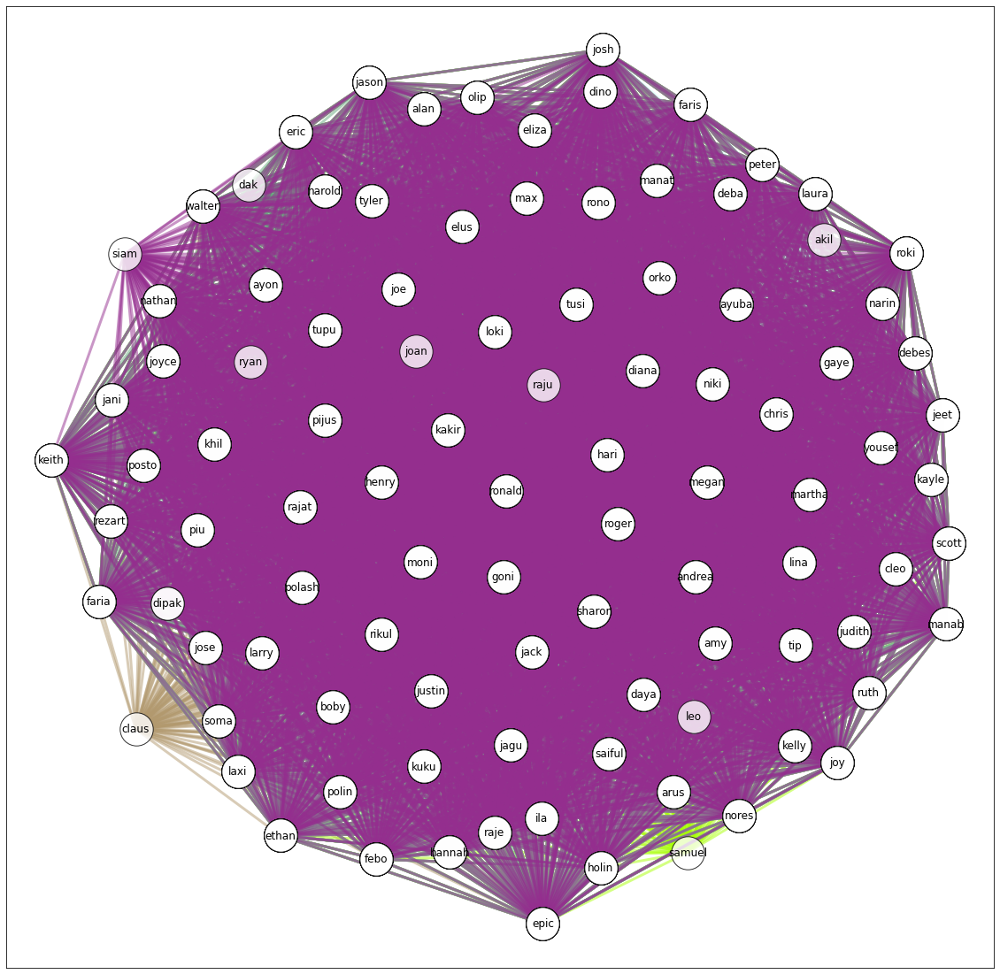

In [61]:
feedbackf = []
feedbackb = []

clusterdistances = []
feedbacknumber = []

weight_arry = []

bit = -1

fnum = 0

fclustersf = evalquery(weight_final)
clusterdist = Fmeasure(fclustersf)

clusterdistances.append(clusterdist)
feedbacknumber.append(fnum)

print(clusterdistances)

[[0.91 0.83 0.78 ... 0.83 0.66 0.84]
 [0.83 0.91 0.78 ... 0.65 0.73 0.84]
 [0.78 0.78 0.91 ... 0.76 0.77 0.68]
 ...
 [0.83 0.65 0.76 ... 0.91 0.77 0.66]
 [0.66 0.73 0.77 ... 0.77 0.91 0.75]
 [0.84 0.84 0.68 ... 0.66 0.75 0.91]]
Cluster  0 :  ['piu', 'hari', 'joyce', 'nores', 'yousef', 'joy', 'andrea', 'tupu', 'kelly', 'laura', 'elus', 'harold', 'deba', 'loki', 'holin', 'kuku', 'amy', 'rikul', 'jason', 'megan', 'goni', 'justin', 'ethan', 'gaye', 'josh', 'tip', 'peter', 'polin', 'manat', 'febo', 'ruth', 'dino', 'debes', 'martha', 'jeet', 'daya', 'henry', 'polash', 'narin', 'ayon', 'max', 'walter', 'faris', 'jani', 'scott', 'diana', 'jagu', 'moni', 'alan', 'khil', 'eric', 'ayuba', 'laxi', 'lina', 'manab', 'joe', 'roki', 'hannah', 'chris', 'olip', 'ronald', 'rezart', 'keith', 'jose', 'boby', 'rono', 'sharon', 'rajat', 'kayle', 'niki', 'kakir', 'raje', 'larry', 'orko', 'tusi', 'cleo', 'soma', 'judith', 'nathan', 'epic', 'arus', 'ila', 'pijus', 'eliza', 'faria', 'jack', 'posto', 'roger', 'ty

person name: siam
Cluster number: 9
['piu', 'hari', 'joyce', 'nores', 'yousef', 'joy', 'andrea', 'tupu', 'kelly', 'laura', 'elus', 'harold', 'deba', 'loki', 'holin', 'kuku', 'amy', 'rikul', 'jason', 'megan', 'goni', 'justin', 'ethan', 'gaye', 'josh', 'tip', 'peter', 'polin', 'manat', 'febo', 'ruth', 'dino', 'debes', 'martha', 'jeet', 'daya', 'henry', 'polash', 'narin', 'ayon', 'max', 'walter', 'faris', 'jani', 'scott', 'diana', 'jagu', 'moni', 'alan', 'khil', 'eric', 'ayuba', 'laxi', 'lina', 'manab', 'joe', 'roki', 'hannah', 'chris', 'olip', 'ronald', 'rezart', 'keith', 'jose', 'boby', 'rono', 'sharon', 'rajat', 'kayle', 'niki', 'kakir', 'raje', 'larry', 'orko', 'tusi', 'cleo', 'soma', 'judith', 'nathan', 'epic', 'arus', 'ila', 'pijus', 'eliza', 'faria', 'jack', 'posto', 'roger', 'tyler', 'siam', 'dipak']
[57, 54, 35, 63, 12, 51, 46, 99, 38, 29, 56, 44, 8, 87, 91, 77, 25, 83, 21, 42, 76, 26, 39, 81, 84, 53, 18, 96, 58, 71, 31, 75, 65, 49, 89, 74, 36, 13, 68, 1, 17, 41, 61, 94, 28, 5, 7

Cluster  1 :  ['piu', 'hari', 'joyce', 'nores', 'yousef', 'joy', 'andrea', 'tupu', 'kelly', 'laura', 'elus', 'harold', 'deba', 'loki', 'holin', 'kuku', 'amy', 'rikul', 'jason', 'megan', 'goni', 'justin', 'ethan', 'gaye', 'josh', 'tip', 'peter', 'polin', 'manat', 'febo', 'ruth', 'debes', 'jeet', 'martha', 'daya', 'henry', 'polash', 'narin', 'ayon', 'max', 'walter', 'faris', 'jani', 'scott', 'diana', 'jagu', 'moni', 'alan', 'khil', 'eric', 'ayuba', 'laxi', 'lina', 'manab', 'joe', 'roki', 'chris', 'hannah', 'olip', 'ronald', 'rezart', 'jose', 'boby', 'rono', 'sharon', 'rajat', 'kayle', 'niki', 'kakir', 'raje', 'larry', 'orko', 'tusi', 'cleo', 'soma', 'judith', 'nathan', 'epic', 'arus', 'ila', 'eliza', 'faria', 'pijus', 'jack', 'posto', 'roger', 'tyler', 'dino', 'saiful', 'dipak']
Cluster  2 :  ['piu', 'hari', 'joyce', 'nores', 'yousef', 'joy', 'andrea', 'tupu', 'kelly', 'laura', 'elus', 'harold', 'deba', 'loki', 'holin', 'kuku', 'amy', 'rikul', 'jason', 'megan', 'goni', 'justin', 'ethan',

Cluster  12 :  ['piu', 'hari', 'joyce', 'nores', 'yousef', 'joy', 'andrea', 'tupu', 'kelly', 'laura', 'elus', 'harold', 'deba', 'loki', 'holin', 'kuku', 'amy', 'rikul', 'jason', 'megan', 'goni', 'justin', 'ethan', 'gaye', 'josh', 'tip', 'peter', 'polin', 'manat', 'febo', 'ruth', 'debes', 'jeet', 'martha', 'daya', 'henry', 'polash', 'narin', 'ayon', 'max', 'walter', 'faris', 'jani', 'scott', 'diana', 'jagu', 'moni', 'alan', 'khil', 'eric', 'ayuba', 'laxi', 'lina', 'manab', 'joe', 'roki', 'chris', 'hannah', 'olip', 'ronald', 'rezart', 'jose', 'boby', 'rono', 'sharon', 'rajat', 'kayle', 'niki', 'kakir', 'raje', 'larry', 'orko', 'tusi', 'cleo', 'soma', 'judith', 'nathan', 'epic', 'arus', 'ila', 'eliza', 'faria', 'pijus', 'jack', 'posto', 'roger', 'tyler', 'keith', 'saiful', 'claus']
Cluster  13 :  ['piu', 'hari', 'joyce', 'nores', 'yousef', 'joy', 'andrea', 'tupu', 'kelly', 'laura', 'elus', 'harold', 'deba', 'loki', 'holin', 'kuku', 'amy', 'rikul', 'jason', 'megan', 'goni', 'justin', 'etha

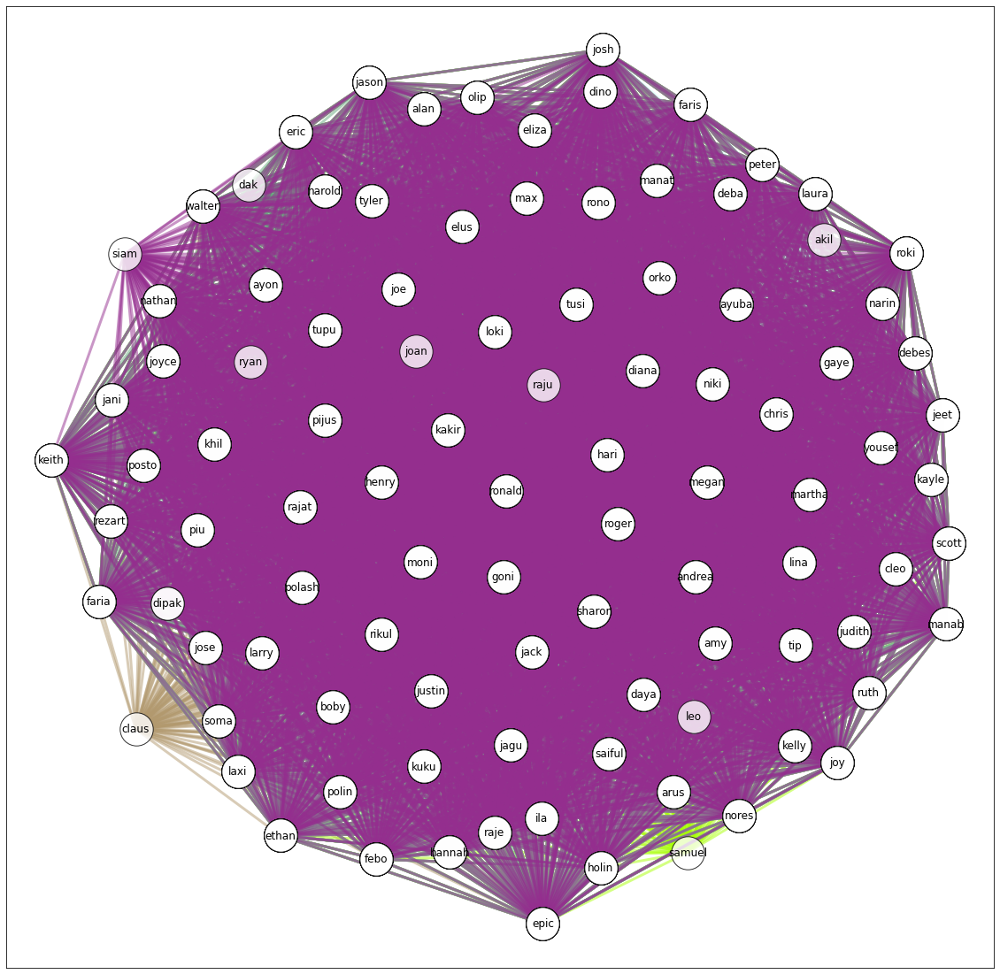

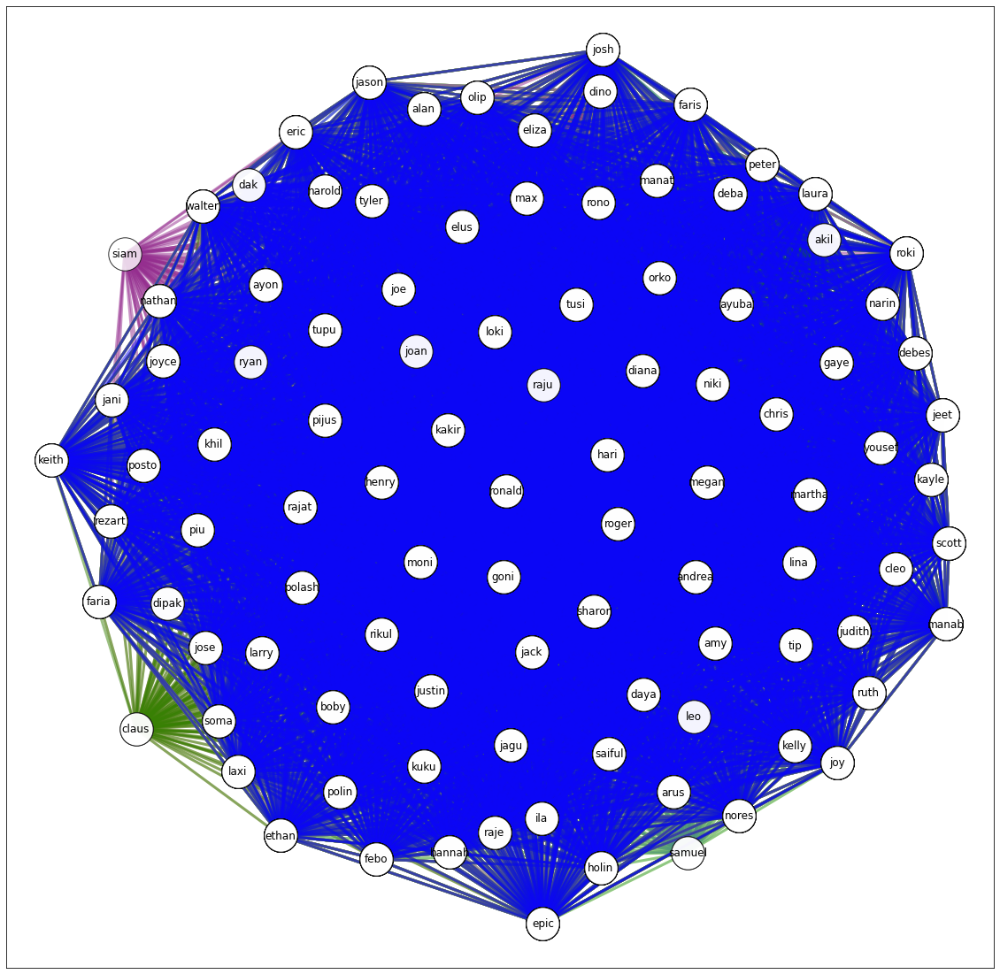

In [62]:
fclustersf = evalquery(weight_final)

print("1. Feedback (1)\n2. Feedback (2)")

#choice = int(input())
choice = 2

feedback = []

possibility = 1
    
if choice == 1:
        
    for sw in range(0,2):
        feedback.append(input('person name: '))
            
    s1,s2,weight_temp = feedback_new(feedback)
    
    print('Weight temp: ',weight_temp)
        
    if len(feedbackf)>0:
        if bit ==-1:
            for mn in weight_arry:
                if mn[0]>weight_temp[0]:
                    weight_temp[0] = mn[0]
                if mn[1]>weight_temp[1]:
                    weight_temp[1] = mn[1]
        else:
            weight_temp[bit] = fixed_val
            
            if bit == 0:
                for mn in weight_arry:
                    if mn[1]>weight_temp[1]:
                        weight_temp[1] = mn[1]
            else:
                for mn in weight_arry:
                    if mn[0]>weight_temp[0]:
                        weight_temp[0] = mn[0]
        
        print('Feedback print: ',feedbackf)
        print('Weights: ',weight_arry,weight_temp)
        
        if check_feedback(feedbackf,feedbackb,weight_temp)==0:
            possibility = 0
            print('Feedback is not possible to fulfil')

    if possibility == 1:
        weight_final = weight_temp
        fclustersf = evalquery(weight_final)
        nclusters = fclustersf
        
        fnum +=1
        
        clusterdist = Fmeasure(nclusters)
            
        clusterdistances.append(clusterdist)
        
        feedbacknumber.append(fnum)
        
        feedbackf.append(s1)
        feedbackb.append(s2)
        
        weight_arry.append(weight_final)
        
elif choice == 2:
    #print(nclusters)
    obj = input('person name: ')
    fcluster= int(input('Cluster number: '))

    d1,d2,weight_temp = fetchdata(obj, fcluster)
    
    #weight_temp = [0.61, 0.38, 0]
    
    print('Weight temp: ',weight_temp)
    
    print('weight array: ',weight_arry)
        
    #if weight_temp!=-1:
    if len(feedbackf)>0:
        
        weight_tp = weight_temp
        weight_temp = []
        
        bit = weight_tp[2]
        
        fixed_val = weight_tp[bit]
        
        if weight_tp[2]==0:
            for mn in weight_arry:
                if mn[1]>weight_tp[1]:
                    weight_tp[1] = mn[1]
        else:
            for mn in weight_arry:
                if mn[0]>weight_tp[0]:
                    weight_tp[0] = mn[0]
                    
        weight_temp.append(weight_tp[0])
        weight_temp.append(weight_tp[1])
        
        print(weight_temp)
                    
        print('Feedback print: ',feedbackf)
        if check_feedback(feedbackf,feedbackb,weight_temp)==0:
            possibility = 0
            print('Feedback is not possible to fulfil')

    if possibility == 1:
        weight_final = weight_temp
        fclustersf = evalquery(weight_final)
        nclusters = fclustersf

        feedbackf.append(d1)
        feedbackb.append(d2)
        
        weight_arry.append(weight_final)
    
    #print(feedback)

print(feedbackf)
print(feedbackb)

print('weight: ',weight_final)

In [19]:
clusterdistances

#feedbacknumber


#print(nclusters)

[0.24, 0.19, 0.09]

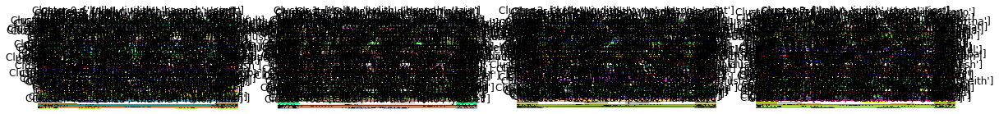

In [20]:
clustersprint(nclusters)

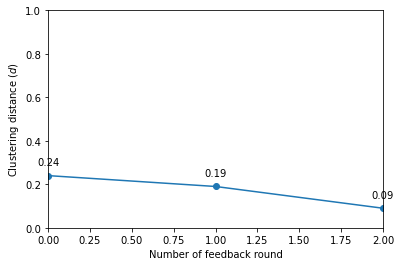

In [21]:
import matplotlib.pyplot as plt

plt.plot(feedbacknumber,clusterdistances,'-o')
#plt.axis([0, 5, 0, 1])
plt.xlabel('Number of feedback round')
plt.ylabel('Clustering distance ($\mathit{d}$)')

for x,y in zip(feedbacknumber,clusterdistances):

    #label = "{:.2f}".format(y)
    label = y

    plt.annotate(label, # this is the text
                 (x,y), # this is the point to label
                 textcoords="offset points", # how to position the text
                 xytext=(0,10), # distance from text to points (x,y)
                 ha='center')
plt.xlim(0,len(feedbacknumber)-1)
plt.ylim(0,1)

plt.show()

[[1.     0.9694 0.94   ... 0.9734 0.8688 0.9844]
 [0.9694 1.     0.9616 ... 0.8768 0.9256 0.977 ]
 [0.94   0.9616 1.     ... 0.9796 0.9966 0.8947]
 ...
 [0.9734 0.8768 0.9796 ... 1.     0.9472 0.8965]
 [0.8688 0.9256 0.9966 ... 0.9472 1.     0.9886]
 [0.9844 0.977  0.8947 ... 0.8965 0.9886 1.    ]]
[[-0.          0.03107796  0.0618754  ...  0.02696018  0.14064233
   0.01572296]
 [ 0.03107796 -0.          0.03915672 ...  0.13147636  0.0773131
   0.02326863]
 [ 0.0618754   0.03915672 -0.         ...  0.02061095  0.00340579
   0.11126681]
 ...
 [ 0.02696018  0.13147636  0.02061095 ... -0.          0.05424501
   0.10925699]
 [ 0.14064233  0.0773131   0.00340579 ...  0.05424501 -0.
   0.01146548]
 [ 0.01572296  0.02326863  0.11126681 ...  0.10925699  0.01146548
  -0.        ]]
[0.03107796 0.0618754  0.0282966  ... 0.05424501 0.10925699 0.01146548]


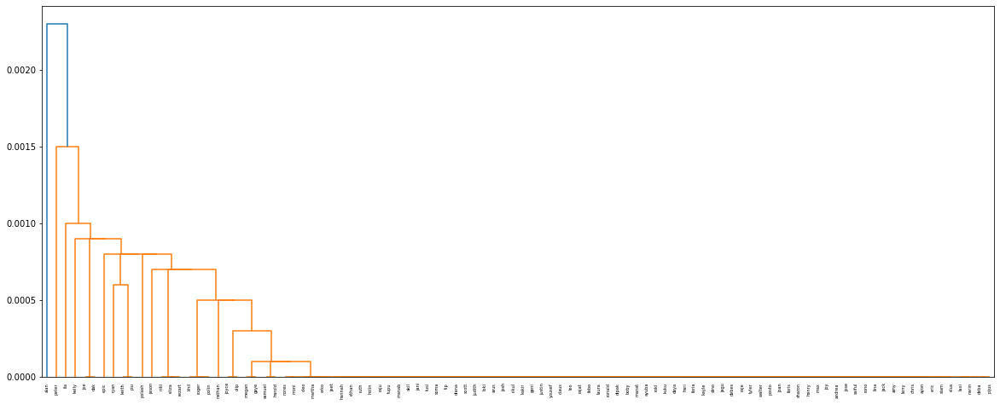

In [18]:
import numpy as np
from scipy.cluster.hierarchy import dendrogram, linkage, single
from scipy.spatial.distance import pdist, squareform

#S = np.array([[1     , 0.83   , 0.54   , 0.9    , 0.62   , 0.68   , 0.77   , 0.36   , 0.48   , 0.41],
#[0.83   , 1      ,0.98    , 0.72   , 0.59   , 0.26   , 0.35   , 0.42   , 0.39   , 0.2],
#[0.54   , 0.98   , 1      , 0.55   , 0.61   , 0.94   , 0.7    , 0.67   , 0.63   , 0.41],
#[0.9    , 0.72   , 0.55   , 1      , 0.76   , 0.18   , 0.48   , 0.22   , 0.15   , 0.42],
#[0.62   , 0.59   , 0.61   , 0.76   , 1      , 0.27   , 0.19   , 0.43   , 0.33   , 0.1],
#[0.68   , 0.26   , 0.94   , 0.18   , 0.27   , 1      , 0.8    , 0.43   , 0.37   , 0.48],
#[0.77   , 0.35   , 0.7    , 0.48   , 0.19   , 0.8    , 1      , 0.3    , 0.16   , 0.29],
#[0.36   , 0.42   , 0.67   , 0.22   , 0.43   , 0.43   , 0.3    , 1      , 0.98   , 0.35], 
#[0.48   , 0.39   , 0.63   , 0.15   , 0.33   , 0.37   , 0.16   , 0.98   , 1      , 0.69],
#[0.41   , 0.2    , 0.41   , 0.42   , 0.1    , 0.48   , 0.29   , 0.35   , 0.69   , 1]])

#S = np.array([[1.,   0.96, 0.01,   0.01,   0.4,  0.01],
 #[0.96, 1.,   0.01,   0.01,   0.01,   0.62],
 #[0.01,   0.01,   1.,   0.64, 0.01,   0.58],
 #[0.01,   0.01,   0.64, 1.,   0.01,   0.61],
 #[0.4,  0.01,   0.01,   0.01,   1.,   0.01  ],
 #[0.01,   0.62, 0.58, 0.61, 0.01,   1.  ]])

S = Smaj+Syear-Smaj*Syear

for i in range(0,dim):
    for j in range(0,dim):
        if S[i,j]==0:
            S[i,j]=0.01

print(S)

dist = -np.log(S)

print(dist)



nlabels = ['siam', 'ayon', 'alan', 'joe', 'eliza', 'diana', 'lina', 'ayuba',
          'deba', 'kayle',  'raju',  'rezart',  'yousef', 'polash',  'rono',  'saiful',
          'rajat',  'max',  'peter',  'chris',
          'ryan', 'jason', 'ronald', 'eric', 'larry',
          'amy', 'justin', 'sharon', 'scott', 'laura',
          'samuel',  'ruth',  'jack',  'tyler',  'jose',
          'joyce',  'henry',  'nathan',  'kelly',
          'ethan', 'joan', 'walter', 'megan', 'judith',
          'harold', 'keith', 'andrea', 'roger', 'hannah',
          'martha', 'leo', 'joy', 'orko', 'tip',
          'hari', 'cleo', 'elus', 'piu', 'manat',
          'raje', 'claus', 'faris', 'pijus', 'nores',
          'posto', 'debes', 'faria', 'ila', 'narin',
          'khil', 'dak', 'febo', 'jagu', 'olip',
          'daya', 'dino', 'goni', 'kuku', 'roki',
          'boby', 'dipak', 'gaye', 'kakir', 'rikul',
          'josh', 'arus', 'niki', 'loki', 'soma',
          'jeet', 'akil', 'holin', 'laxi', 'tusi',
          'jani', 'epic', 'polin', 'moni', 'manab',
          'tupu']

#nlabels = ['siam','ayon','alan','joe','eliza','diana']
#mapping = {'a': 'siam', 'b': 'ayon', 'c': 'alan', 'd': 'joe','e': 'eliza', 'f': 'diana'}

#print(distances)

#for k in range(distances.shape[1]):
#    for l in range(distances.shape[0]):
#        if k==l:
#            distances[k][l] = 0

#print(dist)

distances = squareform(dist)

print(distances)


fig, ax7 = plt.subplots(figsize=(20,8))

dendrogram = dendrogram(linkage(distances, method='single'), labels = nlabels)

In [33]:
from sklearn.cluster import AgglomerativeClustering
#fig, ax8 = plt.subplots(figsize=(8,8))

#nodes_net = ['a','b','c','d','e','f','g','h','i','j']

cluster = AgglomerativeClustering(affinity='precomputed', linkage='single', n_clusters=4)
cluster.fit_predict(dist)

print(cluster.labels_)

print(max(cluster.labels_))

clsf = []

for w in range(0,max(cluster.labels_)+1):
    jet = 0
    clstemp = []
    for q in cluster.labels_:
        if w == q:
            #print(q)
            #print(nlabels[jet])
            clstemp.append(nlabels[jet])
        jet += 1
    clsf.append(clstemp)

print(clsf)

[0 0 3 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 2 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
3
[['siam', 'ayon', 'joe', 'eliza', 'diana', 'lina', 'ayuba', 'deba', 'kayle', 'raju', 'rezart', 'yousef', 'polash', 'rono', 'saiful', 'rajat', 'max', 'chris', 'ryan', 'jason', 'ronald', 'eric', 'larry', 'amy', 'justin', 'sharon', 'scott', 'laura', 'samuel', 'ruth', 'jack', 'tyler', 'jose', 'joyce', 'henry', 'nathan', 'kelly', 'ethan', 'joan', 'walter', 'megan', 'judith', 'harold', 'keith', 'andrea', 'roger', 'hannah', 'martha', 'leo', 'joy', 'orko', 'tip', 'hari', 'cleo', 'elus', 'piu', 'manat', 'raje', 'claus', 'faris', 'pijus', 'nores', 'posto', 'debes', 'faria', 'narin', 'khil', 'dak', 'febo', 'jagu', 'olip', 'daya', 'dino', 'goni', 'kuku', 'roki', 'boby', 'dipak', 'gaye', 'kakir', 'rikul', 'josh', 'arus', 'niki', 'loki', 'soma', 'jeet', 'akil', 'holin', 'laxi', 'tusi', 'jani', 'ep

In [34]:
Y = np.empty((dim, dim), dtype=float)

for i in range(0,dim):
    for j in range(0,dim):
        if S[i,j]<thrf:
            Y[i,j] = 0
        else:
            Y[i,j] = S[i,j]

G9 = nx.from_numpy_matrix(Y)

G9 = nx.relabel_nodes(G9, mapping)

edpt = [tuple(sorted(edh)) for edh in G9.edges]

print(edpt)


[('siam', 'siam'), ('ayon', 'siam'), ('alan', 'siam'), ('joe', 'siam'), ('eliza', 'siam'), ('diana', 'siam'), ('lina', 'siam'), ('ayuba', 'siam'), ('deba', 'siam'), ('kayle', 'siam'), ('raju', 'siam'), ('rezart', 'siam'), ('siam', 'yousef'), ('polash', 'siam'), ('rono', 'siam'), ('saiful', 'siam'), ('rajat', 'siam'), ('max', 'siam'), ('peter', 'siam'), ('chris', 'siam'), ('ryan', 'siam'), ('jason', 'siam'), ('ronald', 'siam'), ('eric', 'siam'), ('larry', 'siam'), ('amy', 'siam'), ('justin', 'siam'), ('sharon', 'siam'), ('scott', 'siam'), ('laura', 'siam'), ('ruth', 'siam'), ('jack', 'siam'), ('siam', 'tyler'), ('jose', 'siam'), ('joyce', 'siam'), ('henry', 'siam'), ('nathan', 'siam'), ('kelly', 'siam'), ('ethan', 'siam'), ('joan', 'siam'), ('siam', 'walter'), ('megan', 'siam'), ('judith', 'siam'), ('harold', 'siam'), ('keith', 'siam'), ('andrea', 'siam'), ('roger', 'siam'), ('hannah', 'siam'), ('martha', 'siam'), ('leo', 'siam'), ('joy', 'siam'), ('orko', 'siam'), ('siam', 'tip'), ('ha

Cluster  0 :  ['siam', 'ayon', 'joe', 'eliza', 'diana', 'lina', 'ayuba', 'deba', 'kayle', 'raju', 'rezart', 'yousef', 'polash', 'rono', 'saiful', 'rajat', 'max', 'chris', 'ryan', 'jason', 'ronald', 'eric', 'larry', 'amy', 'justin', 'sharon', 'scott', 'laura', 'samuel', 'ruth', 'jack', 'tyler', 'jose', 'joyce', 'henry', 'nathan', 'kelly', 'ethan', 'joan', 'walter', 'megan', 'judith', 'harold', 'keith', 'andrea', 'roger', 'hannah', 'martha', 'leo', 'joy', 'orko', 'tip', 'hari', 'cleo', 'elus', 'piu', 'manat', 'raje', 'claus', 'faris', 'pijus', 'nores', 'posto', 'debes', 'faria', 'narin', 'khil', 'dak', 'febo', 'jagu', 'olip', 'daya', 'dino', 'goni', 'kuku', 'roki', 'boby', 'dipak', 'gaye', 'kakir', 'rikul', 'josh', 'arus', 'niki', 'loki', 'soma', 'jeet', 'akil', 'holin', 'laxi', 'tusi', 'jani', 'epic', 'polin', 'moni', 'manab', 'tupu']
[('dak', 'niki'), ('kayle', 'raje'), ('jeet', 'piu'), ('claus', 'saiful'), ('goni', 'walter'), ('faris', 'jason'), ('henry', 'rajat'), ('niki', 'raju'), (

Cluster  1 :  ['ila']
Cluster  2 :  ['peter']
Cluster  3 :  ['alan']


{'siam': Text(-0.83161297, 0.50407745, 'siam'),
 'ayon': Text(-0.53680229, 0.43458075, 'ayon'),
 'alan': Text(-0.20529513, 0.8312662, 'alan'),
 'joe': Text(-0.25761174, 0.42468698, 'joe'),
 'eliza': Text(0.02719944, 0.78353093, 'eliza'),
 'diana': Text(0.25304329, 0.24256294, 'diana'),
 'lina': Text(0.58135904, -0.18784663, 'lina'),
 'ayuba': Text(0.4500152, 0.3906661, 'ayuba'),
 'deba': Text(0.43720864, 0.64067396, 'deba'),
 'kayle': Text(0.85748105, -0.00172306, 'kayle'),
 'raju': Text(0.04561252, 0.21139816, 'raju'),
 'rezart': Text(-0.86107209, -0.0943577, 'rezart'),
 'yousef': Text(0.75229355, 0.06885527, 'yousef'),
 'polash': Text(-0.45999655, -0.24356175, 'polash'),
 'rono': Text(0.16133699, 0.6193264, 'rono'),
 'saiful': Text(0.18283673, -0.61686877, 'saiful'),
 'rajat': Text(-0.46414214, -0.06272753, 'rajat'),
 'max': Text(0.01016856, 0.63007355, 'max'),
 'peter': Text(0.50429058, 0.7049124, 'peter'),
 'chris': Text(0.53303782, 0.14519309, 'chris'),
 'ryan': Text(-0.56781181, 

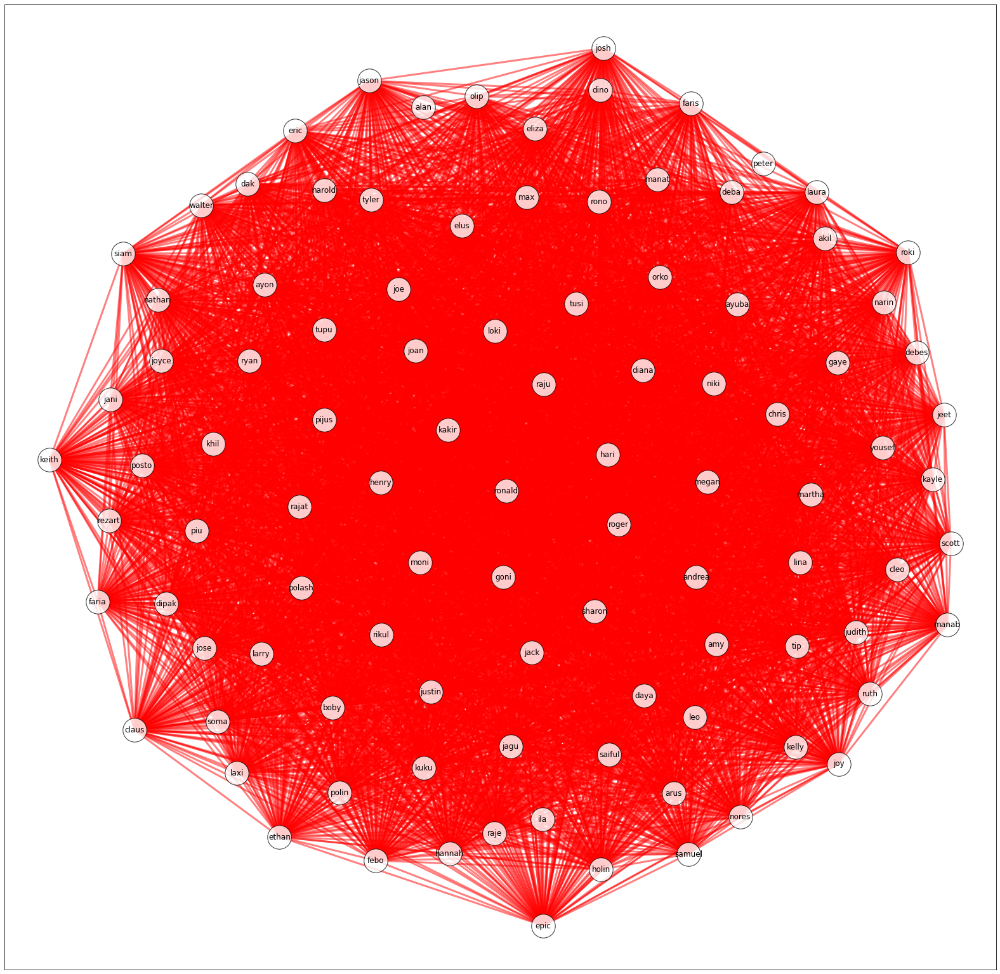

In [35]:
from collections import Counter

sublist = []
    
for edg in clsf:
    edg = sorted(edg)
    ed_sublist = list(combinations(edg,2))
    for edgsub in ed_sublist:
        sublist.append(edgsub)
        
subcount = Counter(sublist)

fig, ax1 = plt.subplots(figsize=(28,28))
    
######################################
    
#print(clusters)

#options = {"node_size": 800, "alpha": 0.8}

#pos = nx.spring_layout(G)

#nx.draw_networkx_labels(G,pos, font_size=18)

for i in range(0,len(clsf)):
    node_list = clsf[i]
    
    #print(node_list)
        
    #print("Cluster ", i, ": ", node_list)
    ncolor = list(mcolor.keys())[i]
        
    print(list(mcolor.values())[i]+"Cluster ", i, ": ", node_list) 

    #nx.draw_networkx_nodes(G3, pos, nodelist=node_list, node_color=colornames[i], **options)
    nx.draw_networkx_nodes(G,pos, nodelist=node_list, node_color='white',edgecolors='black', **options)

    if len(node_list)>1:
        
        #gt = 1
        #t_list = []
        #n_list=[]
    
        #for mt in range(0,len(node_list)-1):
            #t_list.append(node_list[mt])
            #t_list.append(node_list[mt+1])
        
            #n_list.append(tuple(sorted(t_list)))
        
            #t_list = []
        
        #print(n_list)
        
        #edge_list = n_list

        
        node_list = sorted(node_list)
            
        edge_list = list(combinations(node_list,2))
        
        #print(edge_list)
        
        edge_list = list(set(edge_list) & set(edpt))
            
        print(edge_list)
            
        weight_edge = []
            
        for co_edge in edge_list:
                
            tempedge = 3
                
            rep_sub = list(subcount.values())[list(subcount.keys()).index(co_edge)]
                
            if rep_sub > 1:
                tempedge = (tempedge+1) * rep_sub +2
                weight_edge.append(tempedge)
                subcount[co_edge] = rep_sub-1
            else:
                weight_edge.append(tempedge)
                           
        nx.draw_networkx_edges(G,pos, edgelist=edge_list,
                               width=3, alpha=0.5, edge_color=ncolor)
nx.draw_networkx_labels(G, pos)

In [36]:
from sklearn_extra.cluster import KMedoids

kmedoids = KMedoids(n_clusters=4, random_state=0).fit(dist)
kmedoids.labels_

clsf = []

for w in range(0,max(kmedoids.labels_)+1):
    jet = 0
    clstemp = []
    for q in kmedoids.labels_:
        if w == q:
            #print(q)
            #print(nlabels[jet])
            clstemp.append(nlabels[jet])
        jet += 1
    clsf.append(clstemp)

print(clsf)

[['ayon', 'diana', 'saiful', 'max', 'ronald', 'justin', 'sharon', 'nathan', 'megan', 'keith', 'andrea', 'hannah', 'joy', 'hari', 'cleo', 'elus', 'piu', 'posto', 'ila', 'narin', 'dino', 'dipak', 'niki', 'soma', 'holin', 'epic', 'moni', 'tupu'], ['eliza', 'ayuba', 'deba', 'kayle', 'rono', 'jason', 'eric', 'larry', 'amy', 'scott', 'henry', 'ethan', 'martha', 'orko', 'raje', 'pijus', 'nores', 'febo', 'olip', 'goni', 'rikul', 'loki', 'polin'], ['alan', 'joe', 'rezart', 'yousef', 'polash', 'rajat', 'peter', 'ryan', 'jack', 'walter', 'harold', 'roger', 'tip', 'manat', 'debes', 'faria', 'jagu', 'daya', 'kuku', 'roki', 'boby', 'gaye', 'kakir', 'laxi', 'tusi', 'jani', 'manab'], ['siam', 'lina', 'raju', 'chris', 'laura', 'samuel', 'ruth', 'tyler', 'jose', 'joyce', 'kelly', 'joan', 'judith', 'leo', 'claus', 'faris', 'khil', 'dak', 'josh', 'arus', 'jeet', 'akil']]


In [37]:
import matplotlib._color_data as mcd

overlap =[]

#for name in mcd.CSS4_COLORS:
for name in mcd.XKCD_COLORS:
    if 'white' not in name:
        overlap.append(name)

Cluster  0 :  ['ayon', 'diana', 'saiful', 'max', 'ronald', 'justin', 'sharon', 'nathan', 'megan', 'keith', 'andrea', 'hannah', 'joy', 'hari', 'cleo', 'elus', 'piu', 'posto', 'ila', 'narin', 'dino', 'dipak', 'niki', 'soma', 'holin', 'epic', 'moni', 'tupu']
[('diana', 'max'), ('ayon', 'elus'), ('justin', 'niki'), ('dipak', 'nathan'), ('justin', 'narin'), ('dipak', 'tupu'), ('narin', 'nathan'), ('cleo', 'dino'), ('narin', 'tupu'), ('hari', 'joy'), ('moni', 'soma'), ('niki', 'tupu'), ('piu', 'tupu'), ('ila', 'megan'), ('epic', 'max'), ('dino', 'megan'), ('andrea', 'ila'), ('saiful', 'tupu'), ('sharon', 'tupu'), ('keith', 'max'), ('cleo', 'diana'), ('cleo', 'dipak'), ('diana', 'soma'), ('epic', 'justin'), ('soma', 'tupu'), ('niki', 'posto'), ('nathan', 'sharon'), ('niki', 'ronald'), ('diana', 'keith'), ('cleo', 'hannah'), ('max', 'nathan'), ('hannah', 'nathan'), ('max', 'tupu'), ('posto', 'tupu'), ('andrea', 'niki'), ('joy', 'nathan'), ('cleo', 'posto'), ('hannah', 'tupu'), ('megan', 'niki'

{'siam': Text(-0.83161297, 0.50407745, 'siam'),
 'ayon': Text(-0.53680229, 0.43458075, 'ayon'),
 'alan': Text(-0.20529513, 0.8312662, 'alan'),
 'joe': Text(-0.25761174, 0.42468698, 'joe'),
 'eliza': Text(0.02719944, 0.78353093, 'eliza'),
 'diana': Text(0.25304329, 0.24256294, 'diana'),
 'lina': Text(0.58135904, -0.18784663, 'lina'),
 'ayuba': Text(0.4500152, 0.3906661, 'ayuba'),
 'deba': Text(0.43720864, 0.64067396, 'deba'),
 'kayle': Text(0.85748105, -0.00172306, 'kayle'),
 'raju': Text(0.04561252, 0.21139816, 'raju'),
 'rezart': Text(-0.86107209, -0.0943577, 'rezart'),
 'yousef': Text(0.75229355, 0.06885527, 'yousef'),
 'polash': Text(-0.45999655, -0.24356175, 'polash'),
 'rono': Text(0.16133699, 0.6193264, 'rono'),
 'saiful': Text(0.18283673, -0.61686877, 'saiful'),
 'rajat': Text(-0.46414214, -0.06272753, 'rajat'),
 'max': Text(0.01016856, 0.63007355, 'max'),
 'peter': Text(0.50429058, 0.7049124, 'peter'),
 'chris': Text(0.53303782, 0.14519309, 'chris'),
 'ryan': Text(-0.56781181, 

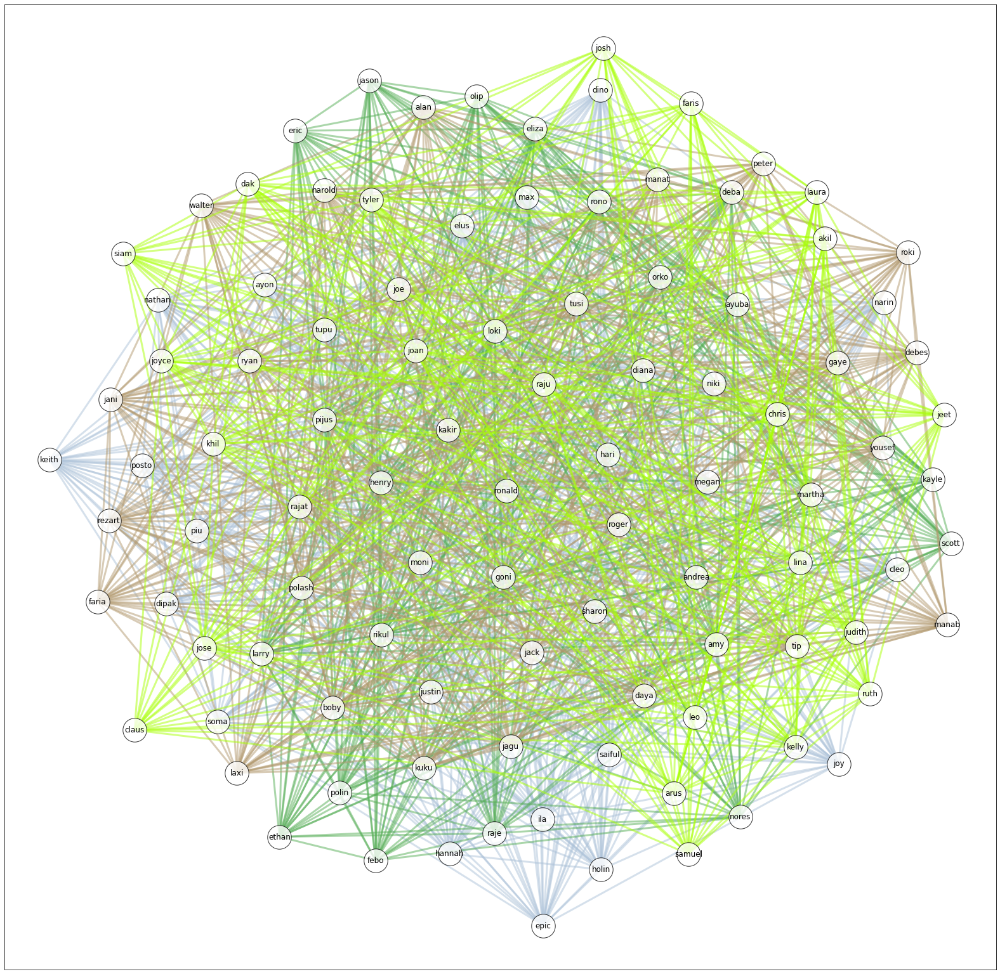

In [38]:
sublist = []
    
for edg in clsf:
    edg = sorted(edg)
    ed_sublist = list(combinations(edg,2))
    for edgsub in ed_sublist:
        sublist.append(edgsub)
        
subcount = Counter(sublist)

fig, ax1 = plt.subplots(figsize=(28,28))
    
######################################
    
#print(clusters)

#options = {"node_size": 800, "alpha": 0.8}

#pos = nx.spring_layout(G)

#nx.draw_networkx_labels(G,pos, font_size=18)

for i in range(0,len(clsf)):
    node_list = clsf[i]
    
    #print(node_list)
        
    #print("Cluster ", i, ": ", node_list)
    ncolor = overlap[i]
        
    print(list(mcolor.values())[i]+"Cluster ", i, ": ", node_list) 

    #nx.draw_networkx_nodes(G3, pos, nodelist=node_list, node_color=colornames[i], **options)
    nx.draw_networkx_nodes(G,pos, nodelist=node_list, node_color='white',edgecolors='black', **options)

    if len(node_list)>1:
        
        #gt = 1
        #t_list = []
        #n_list=[]
    
        #for mt in range(0,len(node_list)-1):
            #t_list.append(node_list[mt])
            #t_list.append(node_list[mt+1])
        
            #n_list.append(tuple(sorted(t_list)))
        
            #t_list = []
        
        #print(n_list)
        
        #edge_list = n_list

        
        node_list = sorted(node_list)
            
        edge_list = list(combinations(node_list,2))
        
        #print(edge_list)
        
        edge_list = list(set(edge_list) & set(edpt))
            
        print(edge_list)
            
        weight_edge = []
            
        for co_edge in edge_list:
                
            tempedge = 3
                
            rep_sub = list(subcount.values())[list(subcount.keys()).index(co_edge)]
                
            if rep_sub > 1:
                tempedge = (tempedge+1) * rep_sub +2
                weight_edge.append(tempedge)
                subcount[co_edge] = rep_sub-1
            else:
                weight_edge.append(tempedge)
                           
        nx.draw_networkx_edges(G,pos, edgelist=edge_list,
                               width=3, alpha=0.5, edge_color=ncolor)
nx.draw_networkx_labels(G, pos)

In [17]:
def evalquery(weights):
    
    for i in range(0,dim):
        for j in range(0,dim):
            sm = Smaj[i,j]
            sy = Syear[i,j]
            if sm < thr1 and sy <thr2:
                e[i,j] = 0
            else:
                #tempval = (sm+(1-weights[0])-sm*(1-weights[0]))*(sy+(1-weights[1])-sy*(1-weights[1]))
                tempval = (sm*weights[0])+(sy*weights[1])-(sm*sy*weights[0]*weights[1])
                #e[i,j] = tempval - tempval % 0.01
                e[i,j] = int(tempval*100)/100

    #print(e)

    #Conjunction maxterm
    for i in range(0,dim):
        for j in range(0,dim):
            if e[i,j]<thrf:
                u[i,j] = 0
            else:
                u[i,j] = e[i,j]


    #print(u)
    #print(feedback)

    G3 = nx.from_numpy_matrix(u)

        #mapping = {0: 'siam', 1: 'ayon', 2: 'alan', 3: 'joe', 4: 'eliza'}
    G3 = nx.relabel_nodes(G3, mapping)

    weightsg = nx.get_edge_attributes(G3, "weight")

    fig, ax1 = plt.subplots(figsize=(20,20))

    clusters = list(clq.find_cliques(G3))
    
    nx.draw_networkx_nodes(G1, pos, node_color='white', edgecolors='black', **options)
    nx.draw_networkx_edges(G1, pos, width=3, alpha=0.5)
    nx.draw_networkx_labels(G1, pos)
    
    return clusters

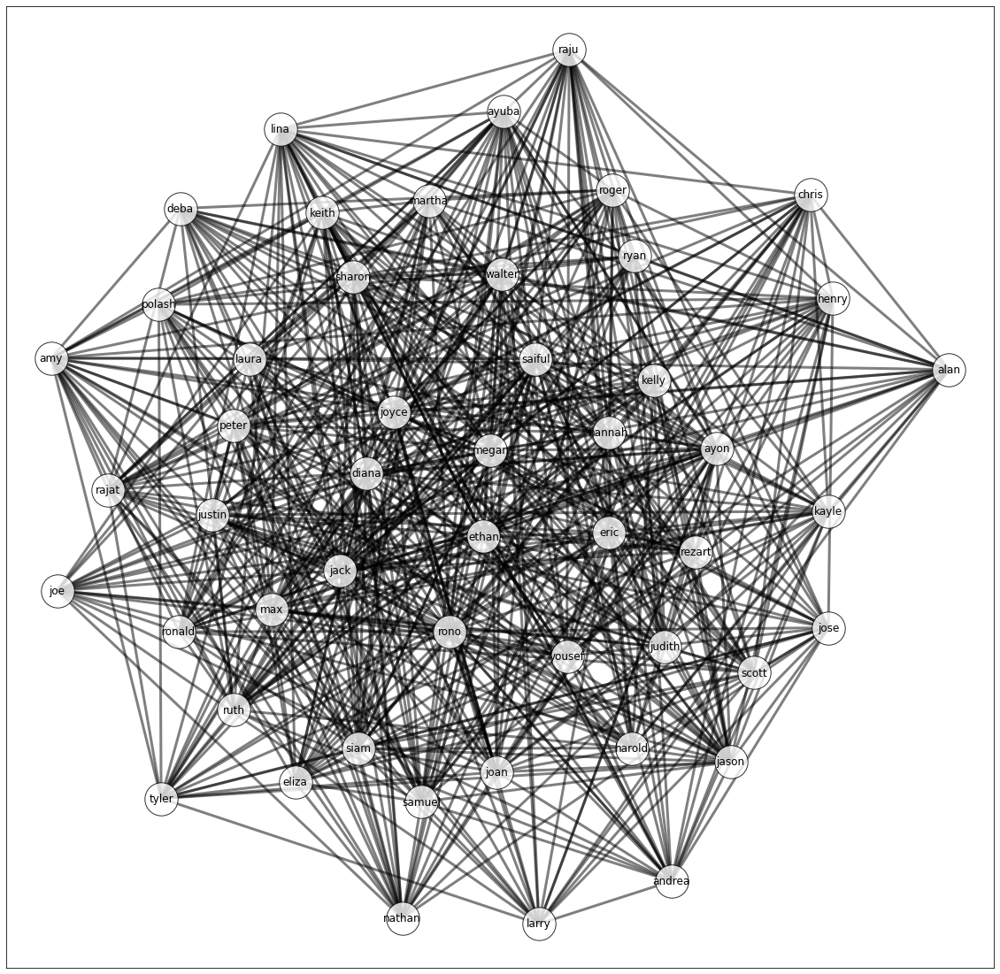

In [18]:
weights = np.array([1, 1])

clusters = evalquery(weights)

weight_final = weights

nclusters = clusters